<a href="https://colab.research.google.com/github/dolmani38/concept_drift/blob/main/230820_D1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Concept drift tolerant machine learning method

In [1]:
import numpy as np
import pandas as pd
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [3]:
import random
import os
def seed_everything(seed: int = 46):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    #tf.random.set_seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)

# 실험을 위한 기본적인 function 들...

In [4]:
import sys, os
import math

from torch.autograd import Variable
from argparse import Namespace
#from FRTrain_arch import Generator, DiscriminatorF, DiscriminatorR, weights_init_normal, test_model
#from FRTrain_arch import weights_init_normal, test_model
import warnings
warnings.filterwarnings("ignore")

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

In [5]:
main_figsize=(15,3)

plt.rc('font', size=10)        # 기본 폰트 크기
plt.rc('axes', labelsize=10)   # x,y축 label 폰트 크기
plt.rc('xtick', labelsize=10)  # x축 눈금 폰트 크기
plt.rc('ytick', labelsize=10)  # y축 눈금 폰트 크기
plt.rc('legend', fontsize=10)  # 범례 폰트 크기
plt.rc('figure', titlesize=10) # figure title 폰트 크기


In [6]:
def weights_init_normal(m):
    """Initializes the weight and bias of the model.

    Args:
        m: A torch model to initialize.

    Returns:
        None.
    """

    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)
    elif classname.find('Linear') != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.2)
        torch.nn.init.constant_(m.bias.data, 0)


In [7]:
# Define the Generator
# bucket에 대해 x를 전처리
class Generator(nn.Module):

    def __init__(self,input_dim):
        super(Generator, self).__init__()

        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        #self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(2, self.input_dim*10))
            #self.fc2.append(nn.BatchNorm1d(num_features=50))
            self.fc3.append(nn.Linear(self.input_dim*10, 1))

        #self.fc = nn.Linear(input_dim, input_dim)

    def forward(self,x,b):
        pxy = []
        for i in range(self.input_dim):
            h0 = self.fc1[i](torch.cat((x[:,i].reshape(-1,1),b), 1))
            #h1 = F.relu(self.fc2[i](h0))
            #h2 = self.fc3[i](h1)
            h2 = self.fc3[i](F.relu(h0))
            pxy.append(h2)

        #return self.fc(torch.tensor(torch.cat(pxy, dim=1), requires_grad = True))
        return torch.cat(pxy, dim=1)


In [8]:
# Define the Discriminator
# 비즈니스에 해당하는 모델
class Discriminator(nn.Module):

    def __init__(self, input_dim=5):
        """Initializes Discriminator with torch components."""
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, input_dim*4),
            nn.ReLU(),
            nn.Linear(input_dim*4, input_dim),
            nn.ReLU(),
            nn.Linear(input_dim, 1),
            nn.Sigmoid()
        )

    def forward(self, input_data):
        """Defines a forward operation of the model.

        Args:
            input_data: The input data.

        Returns:
            The predicted label (y_hat) for the given input data.
        """

        output = self.model(input_data)
        return output


In [9]:
from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
import scipy

def test_model(model_,model2_, train_tensors, test_tensors, avaible_range,columns):
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test

    model_.eval()

    b_dim = XS_test.shape[1]-1

    #test_analysis = {}
    XS = XS_train[:,b_dim].cpu().data.numpy()
    '''
    for bk in np.unique(XS,axis = 0):
        test_analysis[f'Sum(MI{bk})']= []
        test_analysis[f'Std(MI{bk})']= []
        test_analysis[f'Ent(MI{bk})']= []

        test_analysis[f'Sum(DR{bk})']= []
        test_analysis[f'Std(DR{bk})']= []
        test_analysis[f'Ent(DR{bk})']= []

    test_analysis['TrainSum(MI)']= []
    test_analysis['TrainStd(MI)']= []
    test_analysis['TrainEnt(MI)']= []

    test_analysis['Test Sum(MI)']= []
    test_analysis['Test Std(MI)']= []
    test_analysis['Test Ent(MI)']= []

    test_analysis['Test Sum(DR)']= []
    test_analysis['Test Std(DR)']= []
    test_analysis['Test Ent(DR)']= []
    '''
    if model2_ == None:
        ax = XS_test[:,0:b_dim]
        ref_ax = XS_train[:,0:b_dim]
    else:
        model2_.eval()
        ax = model2_(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
        ref_ax = model2_(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range)

    y_hat = model_(ax)
    y_hat = (y_hat.cpu().data.numpy()> 0.5).astype(float)

    ty_ = y_test.data.numpy()
    f1 = f1_score(ty_,y_hat)
    '''
    #################### Test (f(x'),y) #########################
    ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
    mi_scores = make_mi_scores(ax_df, ty_, discrete_features="auto")
    #test_analysis['Test Sum(MI)'].append(np.sum(mi_scores))
    #test_analysis['Test Std(MI)'].append(np.std(mi_scores))
    #test_analysis['Test Ent(MI)'].append(scipy.stats.entropy(mi_scores))

    ks = __ks_drift(ax_df.values,XS_test[:,0:b_dim].cpu().data.numpy())
    #test_analysis['Test Sum(DR)'].append(np.sum(ks[:,0]))
    #test_analysis['Test Std(DR)'].append(np.std(ks[:,0]))
    #test_analysis['Test Ent(DR)'].append(scipy.stats.entropy(ks[:,0]))

    #################### Train (f(x'),y) #########################
    ax_df = pd.DataFrame(ref_ax.cpu().data.numpy(),columns=columns)
    mi_scores = make_mi_scores(ax_df, y_train.data.numpy(), discrete_features="auto")
    #test_analysis['TrainSum(MI)'].append(np.sum(mi_scores))
    #test_analysis['TrainStd(MI)'].append(np.std(mi_scores))
    #test_analysis['TrainEnt(MI)'].append(scipy.stats.entropy(mi_scores))

    #################### Train (f(x'_b),y_b) #########################
    '''
    '''
    for bk in np.unique(XS,axis = 0):
        inx = np.where(XS==bk)[0]
        #print(XS_train[:,b_dim].cpu().data.numpy())
        if model2_ == None:
            ax = XS_train[inx][:,0:b_dim]
        else:
            ax = model2_(XS_train[inx][:,0:b_dim],XS_train[inx][:,b_dim].reshape(-1,1)/avaible_range)


        ty_ = y_train[inx].data.numpy()

        ax_df = pd.DataFrame(ax.cpu().data.numpy(),columns=columns)
        mi_scores = make_mi_scores(ax_df, ty_, discrete_features="auto")
        #test_analysis[f'Sum(MI{bk})'].append(np.sum(mi_scores))
        #test_analysis[f'Std(MI{bk})'].append(np.std(mi_scores))
        #test_analysis[f'Ent(MI{bk})'].append(scipy.stats.entropy(mi_scores))

        ks = __ks_drift(XS_train[:,0:b_dim].cpu().data.numpy(),ax_df.values)
        #test_analysis[f'Sum(DR{bk})'].append(np.sum(ks[:,0]))
        #test_analysis[f'Std(DR{bk})'].append(np.std(ks[:,0]))
        #test_analysis[f'Ent(DR{bk})'].append(scipy.stats.entropy(ks[:,0]))
    '''
    print("Test f1 score: {}".format(f1))

    #test_analysis_df = pd.DataFrame(test_analysis)
    #print(test_analysis_df)

    return f1#,test_analysis_df

In [10]:

def test_all_data(discriminator,generator,X_train, X_live, Y_live, train_size, test_size, avaible_range, columns, ShowChart = False,bucket_size_array=[200]):

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    print('X_live.shape',X_live.shape)
    b_dim = X_live.shape[1]-1
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break


    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set),dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []
    MISS = {}
    DRF = {}
    for col in columns:
        MISS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        if generator == None:
            xs = X_live_unit[:,0:b_dim]
        else:
            xs = generator(X_live_unit[:,0:b_dim],X_live_unit[:,b_dim].reshape(-1,1)/avaible_range)
        predicted_y = discriminator(xs)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        #r2 = r2_score(yT[bk*bucket_count:bk*bucket_count+bucket_count],predicted_y.detach().numpy())
        f1s.append(f1_)

        cpu_xs = xs.cpu().data.numpy()
        mi_scores = make_mi_scores(pd.DataFrame(cpu_xs,columns=columns), Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,cpu_xs)
        for ix,col in enumerate(columns):
            MISS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MISS)
    df_drf = pd.DataFrame(DRF)

    if ShowChart:
        plt.figure(figsize=main_figsize)
        plt.plot(f1s,linewidth=1)
        plt.ylabel('F1 Score')
        plt.xlabel(f'bucket ({test_size})')
        plt.show()

        df_mis.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

        df_drf.plot(figsize=main_figsize,linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})',fontsize=15)
        plt.legend(loc=1)
        plt.show()

    print(f'mean of drift:\n{df_drf.mean()}')
    print('Mean F1 for all data:',np.mean(f1s))

    return f1s, df_mis, df_drf

In [11]:
H=20

class Net(nn.Module):
    def __init__(self,input_dim):
        super(Net, self).__init__()
        self.input_dim = input_dim
        self.fc1 = nn.ModuleList()
        self.fc2 = nn.ModuleList()
        self.fc3 = nn.ModuleList()
        #self.fc4 = nn.ModuleList()

        for i in range(self.input_dim):
            self.fc1.append(nn.Linear(1, H))
            self.fc2.append(nn.Linear(1, H))
            self.fc3.append(nn.Linear(H, 1))

    def forward(self, x, y):
        h = []
        for i in range(self.input_dim):
            h0 = F.relu(self.fc1[i](x[:,i].reshape(-1,1))+self.fc2[i](y.reshape(-1,1)))
            h1 = self.fc3[i](h0)
            h.append(h1)

        mi = torch.cat(h, dim=1)
        return mi

class customLoss(nn.Module):
    def __init__(self, model):
        super(customLoss, self).__init__()
        self.model = model

    def forward(self, x,y):
        minibatch = int(x.shape[0] * 0.8)
        s = np.random.choice(x.shape[0],minibatch)
        #x_sample = Variable(torch.from_numpy(x[s,:]).type(torch.FloatTensor), requires_grad = True)
        #y_sample = Variable(torch.from_numpy(y[s]).type(torch.FloatTensor), requires_grad = True)
        #y_shuffle = Variable(torch.from_numpy(np.random.permutation(y[s])).type(torch.FloatTensor), requires_grad = True)
        x_sample = x[s,:] #Variable(x[s,:], requires_grad = True)
        y_sample = y[s] #Variable(, requires_grad = True)
        y_shuffle = y[torch.randperm(minibatch)] #Variable(, requires_grad = True)
        p_xy = self.model(x_sample, y_sample)
        p_x_y = self.model(x_sample, y_shuffle)
        ret = torch.mean(p_xy,0) - torch.log(torch.mean(torch.exp(p_x_y),0))
        loss = - ret

        return loss #, ret.sum().reshape(-1,)

In [12]:
# 본래의 FR-Train에서, Robustness Discriminator를 삭제 하였으므로,  val_tensors, lambda_r 를 삭제 한다.

def train_model(train_tensors, test_tensors, train_opt, lambda_f, avaible_range, alpha, columns,ShowChart = False, do_mine=True):
    #seed_everything()

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)

    lambda_f = torch.tensor([lambda_f],dtype=torch.float32).to(device)

    XS_train = train_tensors.XS_train.to(device)
    y_train = train_tensors.y_train.to(device)
    #s1_train = train_tensors.s1_train.to(device)

    XS_test = test_tensors.XS_test.to(device)
    y_test = test_tensors.y_test.to(device)
    #s1_test = test_tensors.s1_test.to(device)

    # Saves return values here
    #test_result = []

    val = train_opt.val # Number of data points in validation set
    k = train_opt.k     # Update ratio of generator and discriminator (1:k training).
    n_epochs = train_opt.n_epochs  # Number of training epoch

    b_dim = XS_train.shape[1]-1

    # The loss values of each component will be saved in the following lists.
    # We can draw epoch-loss graph by the following lists, if necessary.
    g_losses =[]
    a_losses = []
    m_losses =[]
    f_losses = []

    bce_loss = nn.BCELoss()
    mse_loss = nn.MSELoss(reduce=False)  # mean square error

    # Initializes generator and discriminator
    discriminator = Discriminator(b_dim).to(device)
    discriminator.apply(weights_init_normal)

    optimizer_G = torch.optim.Adam(discriminator.parameters(), lr=train_opt.lr_g)

    train_len = XS_train.shape[0]


    adapter = Generator(b_dim).to(device)
    #adapter.apply(weights_init_normal)

    optimizer_A = torch.optim.Adam(adapter.parameters(), lr=0.001)

    mine = Net(b_dim).to(device)

    mine_loss = customLoss(mine).to(device)
    optimizer_M = torch.optim.Adam(mine_loss.parameters(), lr=0.001)
    #kld_loss = nn.KLDivLoss(reduction='batchmean')
    default_value = torch.tensor([0.5],dtype=torch.float32).to(device)
    for epoch in tqdm(range(n_epochs)):


        # -------------------------------
        #  b에 대한 x의 전처리
        # -------------------------------

        if lambda_f >= 0.0:
            xs = adapter(XS_train[:,0:b_dim],XS_train[:,b_dim].reshape(-1,1)/avaible_range) # z0, b

            #org = torch.histc(XS_train[:,0:b_dim], bins=100, min=0, max=1)
            #trg = torch.histc(xs, bins=100, min=0, max=1)

            ml = torch.mean(mse_loss(xs, XS_train[:,0:b_dim]),dim=0)

            ## distribution의 변차를 최소화 한다. kld_loss ??
            #kl = torch.mean(kld_loss(trg.log(), org),dim=0)
            #
            a_loss =  torch.sum(ml) + torch.std(ml)
        else:
            xs = XS_train[:,0:b_dim]
            a_loss = torch.tensor(0.0)

        # -------------------
        #  Forwards Generator
        # -------------------
        #xs = torch.cat((XS_train[:,0:4], a_z.reshape(-1,1)), 1)
        #print(xs.shape)
        gen_y = discriminator(xs).reshape(-1,1)
        g_loss = bce_loss(gen_y, y_train.reshape(-1,1)) #+ torch.log(mine_loss.mean()+1)*0.001

        optimizer_A.zero_grad()
        #optimizer_M.zero_grad()
        optimizer_G.zero_grad()
        '''
        if lambda_f >= 0.0:
            # -------------------
            #  Forwards MINE
            # -------------------

            xs_test = adapter(XS_test[:,0:b_dim],XS_test[:,b_dim].reshape(-1,1)/avaible_range)
            #x_sample = Variable(torch.clone(xs_test), requires_grad = True)

            m_loss, lmd = mine_loss(xs_test,
                                    y_test, #generator(xs_test).reshape(-1,1),
                                    default_value)

            m_losses.append(-m_loss.cpu().data.numpy())
            f_losses.append(lmd.cpu().data.numpy())

            m_loss = m_loss.sum() * 0.01
            #m_loss.mean().backward()

            #lambda_f = lmd #.detach()
        else:
            m_loss = torch.tensor(0.0)
        '''

        lambda1 = 0.7

        if lambda_f >= 0.0:
            #loss =  lambda1*g_loss + (1-lambda1)*a_loss + torch.std(torch.tensor((g_loss,a_loss)))   #(1.0-lambda_f) * g_loss + lambda_f * a_loss + m_loss.mean()*0.01
            loss =  g_loss + a_loss + torch.std(torch.tensor((g_loss,a_loss)))
        else:
            loss = g_loss

        loss.backward()

        optimizer_G.step()
        #optimizer_M.step()
        optimizer_A.step()

        a_losses.append(a_loss.cpu().data.numpy())
        g_losses.append(g_loss.cpu().data.numpy())

        '''
        if epoch % 200 == 0:
            print(
                    "[Lambda: %1f] [Epoch %d/%d] [a loss: %f] [G loss: %f]"
                    % (lambda_f, epoch, n_epochs, a_losses[-1], g_losses[-1])
                )
        '''
        if lambda_f < 0.0:
            adapter = None

#     torch.save(generator.state_dict(), './FR-Train_on_poi_synthetic.pth')
    f1 = test_model(discriminator,adapter, train_tensors, test_tensors, avaible_range,columns)
    #test_result.append([lambda_f, tmp[0].item(), tmp[1]])

    df_loss = pd.DataFrame({'Generator loss':a_losses,'Predictor loss':g_losses})
    if ShowChart:
        df_loss.plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel=f'bucket ({XS_train.shape[0]})',fontsize=15)
        plt.legend(loc=1)
        plt.show()
    '''
    if lambda_f >= 0.0:
        plt.figure(figsize=main_figsize)
        mi_df = pd.DataFrame(m_losses,columns=columns)
        mi_df.plot(figsize=main_figsize,linewidth=1,ylabel='MI',xlabel='epoch',fontsize=10)
        plt.legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

        plt.figure(figsize=main_figsize)
        #plt.plot(a_losses,linewidth=1,label='Adapter loss')
        #plt.plot(g_losses,linewidth=1,label='classifier loss')
        plt.plot(f_losses,linewidth=1,label='lambda')
        plt.ylabel('lambda')
        plt.xlabel('epoch')
        plt.legend(loc=1,ncol=1)
        plt.show()
    '''
    return f1,discriminator,adapter,df_loss

In [13]:
plt.style.use('bmh')

def __ks_2samp2(sample1, sample2):
    # Gets all observations
    sample1 = np.sort(sample1)
    sample2 = np.sort(sample2)
    n1 = sample1.shape[0]
    n2 = sample2.shape[0]
    data_all = np.concatenate([sample1, sample2])
    cdf1 = np.searchsorted(sample1, data_all, side='right') / n1
    cdf2 = np.searchsorted(sample2, data_all, side='right') / n2
    # Evaluates the KS statistic
    cddiffs = cdf1 - cdf2
    minS = -np.min(cddiffs)
    maxS = np.max(cddiffs)
    ks_stat =  max(minS, maxS)

    #if ks_stat == minS:
    #    ks_stat = -ks_stat

    # Calculates the P-Value based on the two-sided test
    # The P-Value comes from the KS Distribution Survival Function (SF = 1-CDF)
    m, n = float(n1), float(n2)
    en = m * n / (m + n)
    p_value = 0.0 #stats.kstwobign.sf(math.sqrt(en) * abs(ks_stat))
    #p_value = stats.kstwobign.sf(en * abs(ks_stat))
    return ks_stat,p_value

def __ks_drift(ref_x,inf_x):
    x_drift = np.zeros((ref_x.shape[1],2))
    for i in range(ref_x.shape[1]):
        #s, p = ks_2samp(ref_x[:,i],inf_x[:,i],mode='asymp')
        s, p = __ks_2samp2(ref_x[:,i],inf_x[:,i])
        x_drift[i,0] = s
        x_drift[i,1] = p
    return x_drift

In [14]:
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif

def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

In [15]:
from tqdm import tqdm
from sklearn.preprocessing import MinMaxScaler, StandardScaler

plt.style.use('bmh')
plt.rcParams['axes.facecolor'] = 'white'

def check_mi_drift(X:pd.DataFrame,Y:np.array,train_size:int,test_size:int):

    mi_scores = make_mi_scores(X, Y, discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    columns = X.columns
    scaler_c1 = MinMaxScaler()
    # trainset을 가지고 Scaler를 fit하고, testset을 포함한 그 이후의 Data를 모두 transform 한다.
    X = pd.DataFrame(np.concatenate((scaler_c1.fit_transform(X[0:train_size]), scaler_c1.transform(X[train_size:])),axis=0), columns=columns)

    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]

        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            #print(xl.shape)
            truncate_count = xl.shape[0] #truncate_count + len(xl)
            break

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = np.asarray(X_live_set)
    Y_live_set = np.asarray(Y_live_set)

    MIS = {}
    DRF = {}
    for col in columns:
        MIS[col] = []
        DRF[col] = []

    print('Search MI & Drift...for X_live_set',X_live_set.shape)
    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        X_live_unit = pd.DataFrame(X_live_unit,columns = columns)
        mi_scores = make_mi_scores(X_live_unit, Y_live_unit, discrete_features="auto")
        ks = __ks_drift(X_train.values,X_live_unit.values)
        for ix,col in enumerate(columns):
            MIS[col].append(mi_scores[col])
            DRF[col].append(ks[:,0][ix])

    df_mis = pd.DataFrame(MIS)
    df_drf = pd.DataFrame(DRF)

    for c_name in df_mis.columns:
        fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
        df_mis[c_name].plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
        ax[0].set_title(f'Mutual Information of {c_name}',fontdict={'fontsize':10})

        df_drf[c_name].plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
        ax[1].set_title(f'Drift (KS-test) of {c_name}',fontdict={'fontsize':10})
        ax[1].legend(bbox_to_anchor=(1.0, 1.0))
        plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    df_mis.plot(ax=ax[0],linewidth=1,ylabel='MI',xlabel=f'bucket ({test_size})',legend=None)
    ax[0].set_title(f'Mutual Information',fontdict={'fontsize':10})

    df_drf.plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel=f'bucket ({test_size})')
    ax[1].set_title(f'Drift (KS-test)',fontdict={'fontsize':10})
    ax[1].legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    return X,Y

In [16]:
import copy
import torch.optim as optim

def train_classificaion_model(X,Y,train_size, test_size):
    seed_everything()

    mi_scores = make_mi_scores(X[test_size:test_size+train_size], Y[test_size:test_size+train_size], discrete_features="auto")
    #print(mi_scores)
    print(f'MI Analysis MI Max {np.max(mi_scores):.5f}, Min {np.min(mi_scores):.5f}, Mean {np.mean(mi_scores):.5f}, Std {np.std(mi_scores):.5f}')

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print(device)
    # Convert to 2D PyTorch tensors
    X_train = torch.tensor(X[:train_size].values, dtype=torch.float32).to(device)
    y_train = torch.tensor(Y[:train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    X_test = torch.tensor(X[test_size:test_size+train_size].values, dtype=torch.float32).to(device)
    y_test = torch.tensor(Y[test_size:test_size+train_size], dtype=torch.float32).reshape(-1, 1).to(device)

    in_dim = X_train.shape[1]
    # Define the model
    model = nn.Sequential(
        nn.Linear(in_dim, in_dim*4),
        nn.ReLU(),
        nn.Linear(in_dim*4, in_dim),
        nn.ReLU(),
        nn.Linear(in_dim, 1),
        nn.Sigmoid()
    ).to(device)

    # loss function and optimizer
    loss_fn = nn.BCELoss()  # mean square error
    optimizer = optim.Adam(model.parameters(), lr=0.0001)

    n_epochs = 1000   # number of epochs to run
    batch_size = 100  # size of each batch
    batch_start = torch.arange(0, len(X_train), batch_size)

    # Hold the best model
    best_mse = np.inf   # init to infinity
    best_weights = None
    history = []

    for epoch in tqdm(range(n_epochs)):
        model.train()
        with tqdm(batch_start, unit="batch", mininterval=0, disable=True) as bar:
            bar.set_description(f"Epoch {epoch}")
            for start in bar:
                # take a batch
                X_batch = X_train[start:start+batch_size]
                y_batch = y_train[start:start+batch_size]
                # forward pass
                y_pred = model(X_batch)
                loss = loss_fn(y_pred, y_batch)
                # backward pass
                optimizer.zero_grad()
                loss.backward()
                # update weights
                optimizer.step()
                # print progress
                bar.set_postfix(mse=float(loss))
        # evaluate accuracy at end of each epoch
        model.eval()
        y_pred = model(X_test)
        mse = loss_fn(y_pred, y_test)
        mse = float(mse)
        history.append(mse)
        if mse < best_mse:
            best_mse = mse
            best_weights = copy.deepcopy(model.state_dict())

    # restore model and return best accuracy
    model.load_state_dict(best_weights)
    print("MSE: %.2f" % best_mse)
    print("RMSE: %.2f" % np.sqrt(best_mse))
    plt.plot(history)
    plt.show()

    from sklearn.metrics import r2_score,precision_recall_fscore_support,f1_score
    predicted_y = model(X_test)
    f1_ = f1_score(y_test.cpu().data.numpy(),(predicted_y.cpu().data.numpy()> 0.5).astype(float))
    print(f'F1 Score:{f1_:.5f}')

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    print('Dataset structure X_train,',X_train.shape,'X_test,',X_test.shape,'X_live',X_live.shape)
    X_live_set = []
    Y_live_set = []
    truncate_count = 0
    for i in range(int(X_live.shape[0]/test_size)):
        xl = X_live[i*test_size:i*test_size+train_size]
        yl = Y_live[i*test_size:i*test_size+train_size]
        if len(xl) ==  train_size:
            X_live_set.append(xl)
            Y_live_set.append(yl)
        else:
            truncate_count = truncate_count + len(xl)

    print(f'Truncate {truncate_count} rows from live_set {X_live.shape}')
    X_live_set = torch.tensor(np.asarray(X_live_set), dtype=torch.float32).to(device)
    Y_live_set = np.asarray(Y_live_set)

    f1s = []

    for X_live_unit,Y_live_unit in zip(tqdm(X_live_set),Y_live_set):
        predicted_y = model(X_live_unit)
        predicted_y = (predicted_y.cpu().data.numpy()> 0.5).astype(float)
        f1_ = f1_score(Y_live_unit,predicted_y)
        f1s.append(f1_)

    plt.figure(figsize=main_figsize)
    plt.plot(f1s,linewidth=1)
    plt.ylabel('F1 score')
    plt.xlabel(f'bucket ({test_size})')
    #plt.title('Changes of F1 score according to bucket')
    plt.show()

    result_table3 = {}
    #result_table3['lambda']=[]
    result_table3['test_f1']=[]
    result_table3['init_f1']=[]
    result_table3['mean_f1']=[]
    result_table3['last_f1']=[]
    result_table3['SUM(MI)']=[]

    #result_table3['lambda'].append('Case #1 Feature 5')
    result_table3['test_f1'].append(f1_)
    result_table3['init_f1'].append(f1s[0])
    result_table3['mean_f1'].append(np.mean(f1s))
    result_table3['last_f1'].append(f1s[-1])
    result_table3['SUM(MI)'].append(np.sum(mi_scores))

    result = pd.DataFrame(result_table3)
    print(result)
    return model, result

In [195]:
# importing the modules
from IPython.display import display

def drift_tolerant(X, Y,train_size, test_size,avaible_range = 400,lambda_f2 = 1.0,trial_count=5):

    seed_everything()

    print('trial_count:',trial_count)
    columns = X.columns[:-1]
    X_train = X[:train_size]
    Y_train = Y[:train_size]

    X_test = X[test_size:train_size+test_size]
    Y_test = Y[test_size:train_size+test_size]

    X_live = X[test_size:]
    Y_live = Y[test_size:]

    train_tensors = Namespace(XS_train = torch.tensor(X_train.values, dtype=torch.float32),
                            y_train = torch.tensor(Y_train, dtype=torch.float32))
    test_tensors = Namespace(XS_test = torch.tensor(X_test.values, dtype=torch.float32),
                            y_test = torch.tensor(Y_test, dtype=torch.float32))

    train_opt = Namespace(val=0, n_epochs=4000, k=5, lr_g=0.0001, lr_f=0.001, lr_r=0.001)

    lambda_f_set = np.asarray([[-0.1,0.0] for v in range(trial_count)]).reshape(-1,) # np.concatenate([[-0.1 for v in range(trial_count)],[0.0 for v in range(trial_count)]])
    lambda_a2 = 0.0

    print('lambda_f2',lambda_f2)
    result_table0 = {} # Original
    result_table1 = {} # Drift tolerant
    # Original
    infos2 = {}
    result_table2 = {}
    result_table2['Trial']=[]
    result_table2['test_f1']=[]
    result_table2['init_f1']=[]
    result_table2['mean_f1']=[]
    result_table2['last_f1']=[]
    # Drift tolerant
    infos3 = {}
    result_table3 = {}
    result_table3['Trial']=[]
    result_table3['test_f1']=[]
    result_table3['init_f1']=[]
    result_table3['mean_f1']=[]
    result_table3['last_f1']=[]


    for idx,lambda_f in enumerate(lambda_f_set):
        if lambda_f < 0.0:

            idx = len(result_table2['test_f1'])
            print(f'######################### Trial {idx} for Normal model ###########################')
        else:
            idx1 = len(result_table3['test_f1']) #idx-int(len(lambda_f_set)/2)
            print(f'######################### Trial {idx1} for Drift tolerant model ###########################')

        f1,last_discriminator, last_adapter, df_loss = train_model(train_tensors, test_tensors, train_opt, lambda_f = lambda_f, avaible_range = avaible_range, alpha= lambda_f2,columns = columns)# 0.00057)
        tad,df_mis,df_drf = test_all_data(last_discriminator,last_adapter,X_train[columns],X_live,Y_live,train_size, test_size, avaible_range, columns)
        if lambda_f < 0.0:
            result_table0[f'T{idx}'] = tad
            result_table2['Trial'].append(idx)

            infos2[f'T{idx}'] = (df_loss,df_mis,df_drf)
            result_table2['test_f1'].append(f1)
            result_table2['init_f1'].append(tad[0])
            result_table2['mean_f1'].append(np.mean(tad))
            result_table2['last_f1'].append(tad[-1])
            '''
            for clm in test_analysis.columns:
                if clm not in result_table2:
                    result_table2[clm] = []
                result_table2[clm].append(test_analysis[clm].values[0])
            '''
        else:
            #idx1 = idx-int(len(lambda_f_set)/2)
            result_table1[f'T{idx1}'] = tad
            result_table3['Trial'].append(idx1)

            infos3[f'T{idx1}'] = (df_loss,df_mis,df_drf)
            result_table3['test_f1'].append(f1)
            result_table3['init_f1'].append(tad[0])
            result_table3['mean_f1'].append(np.mean(tad))
            result_table3['last_f1'].append(tad[-1])
            '''
            for clm in test_analysis.columns:
                if clm not in result_table3:
                    result_table3[clm] = []
                result_table3[clm].append(test_analysis[clm].values[0])
            '''

            print('Normal model mean        :',np.mean(result_table2['mean_f1']))
            print('Drift tolerant model mean:',np.mean(result_table3['mean_f1']))


    Orginal_df = pd.DataFrame(result_table0)
    Driftto_df = pd.DataFrame(result_table1)

    original_statistics_df = pd.DataFrame(result_table2)
    drift_statistics_df = pd.DataFrame(result_table3)

    original_statistics_df.loc[len(original_statistics_df)] = original_statistics_df.mean()
    original_statistics_df.loc[len(original_statistics_df)] = original_statistics_df[0:len(original_statistics_df)-1].sem()
    original_statistics_df.at[len(original_statistics_df)-2,'Trial'] = 'mean'
    original_statistics_df.at[len(original_statistics_df)-1,'Trial'] = 'sem'

    drift_statistics_df.loc[len(drift_statistics_df)] = drift_statistics_df.mean()
    drift_statistics_df.loc[len(drift_statistics_df)] = drift_statistics_df[0:len(drift_statistics_df)-1].sem()
    drift_statistics_df.at[len(drift_statistics_df)-2,'Trial'] = 'mean'
    drift_statistics_df.at[len(drift_statistics_df)-1,'Trial'] = 'sem'

    fig, ax = plt.subplots(figsize=main_figsize)

    Orginal_df.T.plot.box(ax = ax, showfliers=False,ylabel='F1 Score',fontsize=10,color='blue')
    ax.set_xticks([])
    Orginal_med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':Orginal_df.T.median().values})],axis=0).reset_index(drop=True)
    Orginal_med_df.plot(ax = ax,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color='blue')

    flierprops = dict(marker='.', markerfacecolor='green', markeredgecolor='none')
    Driftto_df.T.plot.box(ax=ax, flierprops=flierprops,ylabel='F1 Score',fontsize=10,color='green')
    Driftto_med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':Driftto_df.T.median().values})],axis=0).reset_index(drop=True)
    Driftto_med_df.plot(ax = ax,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color='green')

    ax.legend(['Normal model','Drift tolerant model'],ncol=2,bbox_to_anchor=(1.0, 1.0))
    leg = ax.get_legend()
    leg.legendHandles[0].set_color('blue')
    leg.legendHandles[1].set_color('green')

    ax.set_title('Comparison of F1 score between normal model and drift tolerant model',fontdict={'fontsize':10})
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize)

    Orginal_df.T.plot.box(ax = ax, showfliers=False,ylabel='F1 Score',fontsize=10,color='blue')
    ax.set_xticks([])
    Orginal_med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':Orginal_df.T.median().values})],axis=0).reset_index(drop=True)
    Orginal_med_df.plot(ax = ax,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color='blue')

    #flierprops = dict(marker='.', markerfacecolor='green', markeredgecolor='none')
    Driftto_df.T.plot.box(ax=ax, showfliers=False,ylabel='F1 Score',fontsize=10,color='green')
    Driftto_med_df = pd.concat([pd.DataFrame({'med':None},index=[0]), pd.DataFrame({'med':Driftto_df.T.median().values})],axis=0).reset_index(drop=True)
    Driftto_med_df.plot(ax = ax,linestyle='--',linewidth=1,ylabel='F1 Score',fontsize=10,color='green')

    ax.legend(['Normal model','Drift tolerant model'],ncol=2,bbox_to_anchor=(1.0, 1.0))
    leg = ax.get_legend()
    leg.legendHandles[0].set_color('blue')
    leg.legendHandles[1].set_color('green')

    ax.set_title('Comparison of F1 score between normal model and drift tolerant model without outlier',fontdict={'fontsize':10})
    plt.show()

    max_mean_trial = int(drift_statistics_df[drift_statistics_df['mean_f1']==np.max(drift_statistics_df['mean_f1'])]['Trial'].values[0])
    print('max_mean_trial=',max_mean_trial)

    fig, ax = plt.subplots(figsize=main_figsize)
    Driftto_df[[f'T{max_mean_trial}']].plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='green',label=f'Drift tolerant model (T{max_mean_trial})')
    Orginal_df.T.median().plot(ax=ax,linewidth=1,ylabel='F1 Score',xlabel='bucket',color='blue',label='Normal model')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    ax.set_title('Max F1 score of drift tolerant model with normal model median',fontdict={'fontsize':10})
    plt.show()


    og_loss,og_mis,og_drf = infos2['T0']
    df_loss,df_mis,df_drf = infos3[f'T{max_mean_trial}']

    ax = df_loss.astype(np.float32).plot(figsize=main_figsize,linewidth=1,ylabel='loss',xlabel='bucket')
    ax.set_title(f'Training loss at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize, nrows=1, ncols=2)
    og_mis.astype(np.float32).plot(ax = ax[0],linewidth=1,ylabel='MI',xlabel='bucket',legend=None)
    ax[0].set_title(f'MI of original feature',fontdict={'fontsize':10})
    df_mis.astype(np.float32).plot(ax = ax[1],linewidth=1,ylabel='MI',xlabel='bucket')
    ax[1].set_title(f'MI of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    fig, ax = plt.subplots(figsize=main_figsize,nrows=1, ncols=2)
    og_drf.astype(np.float32).plot(ax=ax[0],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket',legend=None)
    ax[0].set_title(f'Drift of original feature',fontdict={'fontsize':10})
    df_drf.astype(np.float32).plot(ax=ax[1],linewidth=1,ylabel='Drift (KS-test)',xlabel='bucket')
    ax[1].set_title(f'Drift of generated feature at trial {max_mean_trial}',fontdict={'fontsize':10})
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

    display(original_statistics_df)

    display(drift_statistics_df)

    return Orginal_df, Driftto_df, infos2, infos3, original_statistics_df,drift_statistics_df

# 이론

+ 사실 입력 $x_i$ 에서 어떤 feature가 시간에 따라 importance가 변하는지 알기 어렵다. trainset의 경우, bucket size가 크지 않을 수 있으며, 또한 I(z,b)가 분명하게 나타나지 않을 수도 있기 때문이다.
+ 따라서 아래와 같은 구조를 제안한다.
+ 실험3~4는 sensitive featrue z에 대해, G(z,b)으로 전처리 하였으나, 이번 구조는 모든 feature에 대하여 $G(x_i,b)$으로 전처리한다.
+ $I(x_i,b) > 0$ 인 feature는 G에 의해 전처리 될 것이고,$I(x_j,b) = 0$ 인 feature는 G에 의해 by-pass 되도록 학습될 것이다.

<pre>
x0 ------>|                     |- x'0 --> |                        |
x1 ------>|  Generator G(xi,b)  |- x'1 --> |                        |
x2 ------>|  (Adaptive model)   |- x'2 --> | Discriminator (D(x,g)) | -> y^
x3 ------>|                     |- x'3 --> | predictive model       |
z0 ------>|                     |- z'0 --> |                        |
                     ^
                     |
                     b
</pre>

$$
b = \{1,2,3,...N\} \in B
$$
$$
N << M
$$
$$
b_{norm} = b/M
\tag{17}
$$
$$
L_D = H(y,\hat{y}) = H(y,D(G(x_i,b_{norm})))=\mathbb{E}_{y}[-log(D(G(x_i,b_{norm})))]
\tag{21}
$$

$$
L_G = \sum_{i}MSE(G(x_i,b_{norm}),x_i)
\tag{22}
$$

$$
\min_{G(.)} λ L_D + (1-λ) L_G
\tag{23}
$$

$$
\min_{G(.)} λ L_D + (1-λ) L_G+ std(L_1,L_2)
\tag{24}
$$

# 실험
+ synthetic data를 만든다.
+ 해당 data는 data drift가 시간에 따라 변화 된다.
+ 이때, 성능의 감소를 정량적으로 측정하고
+ Bucket을 고려한 몇개의 모델을 적용한다.

## synthetic data의 생성 (Case #1 MI의 감소, Drift의 증가 )

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature z에 대해서 MI 감소, ks-test 통계량 증가



+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift

### Dataset 준비

In [92]:
data_size = 40000
cor = [1.5, 1.2, 0.9 , 0.7, 0.5]

In [93]:
seed_everything()
#y= np.random.normal(1,2,data_size)
y= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x[:,ix] = y + np.random.normal(1,cor_,data_size)
    #sns.scatterplot(x=x[:,ix],y=y)

In [94]:
seed_everything(100)

for i in range(400):
    s = i*100
    #x[s:s+100,3] = y[s:s+100] + np.random.normal(1,5-(i/100),100)
    x[s:s+100,4] = y[s:s+100] + np.random.normal(1,0.5+(i/100),100)
    #x[s:s+100,5] = i
#sns.scatterplot(x=x[0:200,4],y=y[0:200])
#sns.scatterplot(x=x[39800:40000,4],y=y[39800:40000])

### 실험

MI Analysis MI Max 0.20278, Min 0.02707, Mean 0.09885, Std 0.06305
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:06<00:00,  4.63it/s]


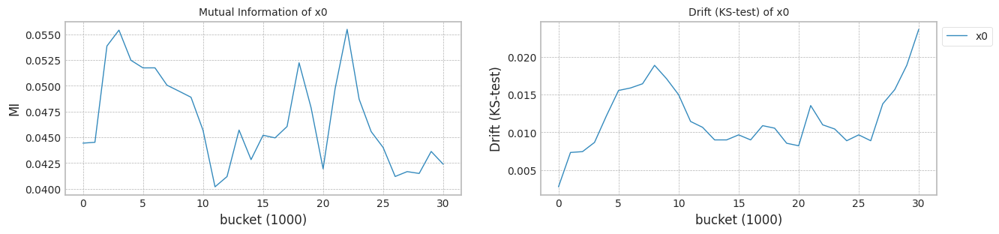

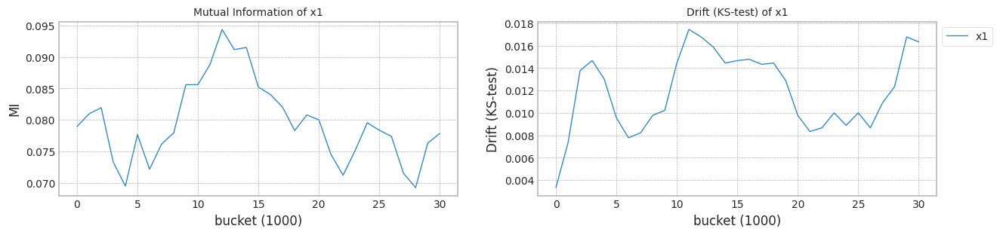

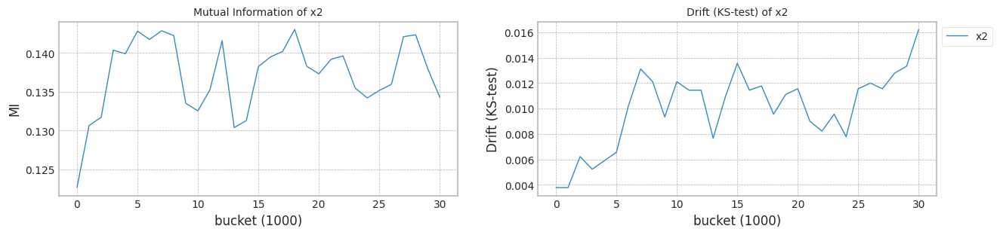

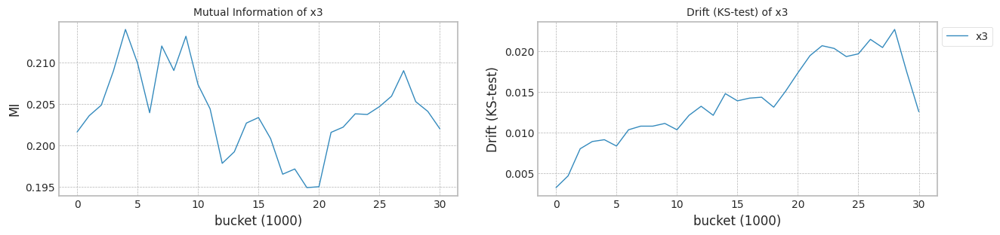

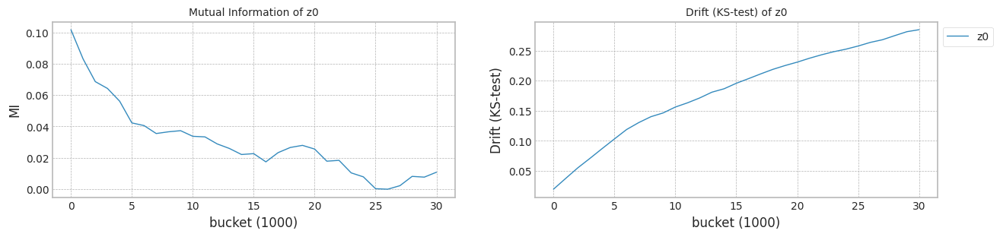

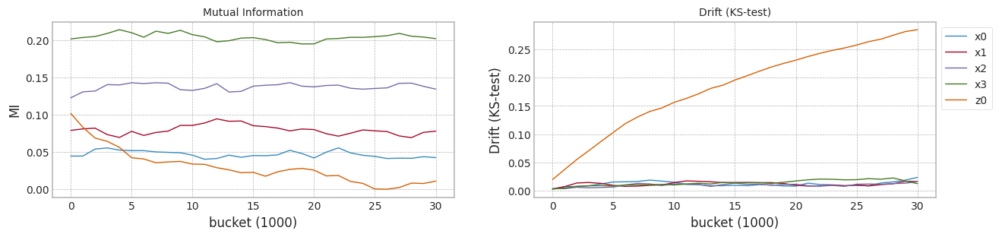

In [95]:
columns=['x0','x1','x2','x3','z0']
X = pd.DataFrame(x,columns=columns)
Y = y

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X, Y,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

cuda:0


100%|██████████| 300/300 [00:02<00:00, 109.22it/s]


<Axes: >

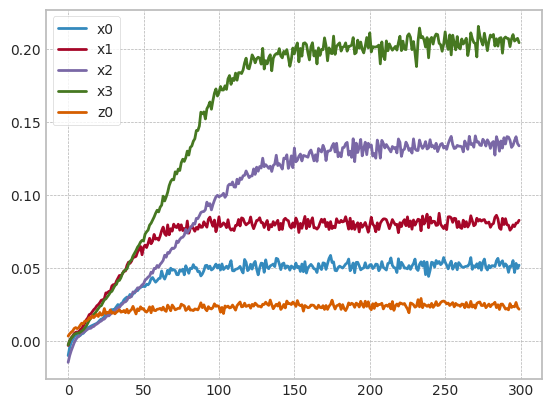

In [96]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
mine = Net(X1.shape[1]).to(device)
loss_mse = customLoss(mine).to(device)
optimizer = torch.optim.Adam(loss_mse.parameters(), lr=0.01)
plot_loss = []

x = torch.tensor(X1.values,dtype=torch.float32).to(device)
y = torch.tensor(Y1,dtype=torch.float32).to(device)

for epoch in tqdm(range(300)):
    mine.zero_grad()
    mine_loss = loss_mse(x,y)
    mine_loss.sum().backward()
    optimizer.step()
    plot_loss.append(-mine_loss.cpu().data.numpy())

plot_loss = np.asarray(plot_loss)
df_loss = pd.DataFrame(plot_loss,columns=X1.columns)

df_loss.plot()

In [97]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.520974,0.392205,0.600995,0.478669,0.421766,0
1,0.447230,0.556479,0.629077,0.735705,0.529014,0
2,0.489501,0.704159,0.760582,0.582973,0.570549,0
3,0.581446,0.301839,0.443337,0.515173,0.396001,0
4,0.571642,0.639275,0.524701,0.583380,0.561748,0
...,...,...,...,...,...,...
39995,0.346158,0.267147,0.513105,0.599663,0.185740,39
39996,0.426322,0.302644,0.484909,0.587518,0.721101,39
39997,0.374186,0.587769,0.624447,0.598315,0.489479,39
39998,0.470439,0.265430,0.218971,0.645349,1.258888,39


trial_count: 10
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 564.53it/s]


Test f1 score: 0.8755589486312575
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.51it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8033370678547825
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.89it/s]


Test f1 score: 0.8581103222282905
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.50it/s]


mean of drift:
x0    0.228466
x1    0.142541
x2    0.129287
x3    0.173226
z0    0.092771
dtype: float64
Mean F1 for all data: 0.8287080851177534
Normal model mean        : 0.8033370678547825
Drift tolerant model mean: 0.8287080851177534
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 554.15it/s]


Test f1 score: 0.8752573967703479
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8050695837316075
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.41it/s]


Test f1 score: 0.8788011376066507
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.068244
x1    0.128423
x2    0.113405
x3    0.152097
z0    0.240491
dtype: float64
Mean F1 for all data: 0.8450267919475111
Normal model mean        : 0.8042033257931951
Drift tolerant model mean: 0.8368674385326322
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 550.03it/s]


Test f1 score: 0.8555280819498411
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.776874864934093
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.03it/s]


Test f1 score: 0.877606909627133
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.095143
x1    0.083369
x2    0.065186
x3    0.127495
z0    0.359846
dtype: float64
Mean F1 for all data: 0.8285145352722383
Normal model mean        : 0.795093838840161
Drift tolerant model mean: 0.8340831374458343
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 556.77it/s]


Test f1 score: 0.8565048771888589
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7785596639941288
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.51it/s]


Test f1 score: 0.8461706305913156
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.54it/s]


mean of drift:
x0    0.259215
x1    0.046341
x2    0.147419
x3    0.187423
z0    0.437806
dtype: float64
Mean F1 for all data: 0.791322161646156
Normal model mean        : 0.790960295128653
Drift tolerant model mean: 0.8233928934959147
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 561.41it/s]


Test f1 score: 0.8440038222646918
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.56it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.7764108086680027
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 203.10it/s]


Test f1 score: 0.8659180977542933
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.380143
x1    0.111731
x2    0.129323
x3    0.153978
z0    0.370806
dtype: float64
Mean F1 for all data: 0.8176360718110309
Normal model mean        : 0.7880503978365229
Drift tolerant model mean: 0.822241529158938
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 519.15it/s]


Test f1 score: 0.8531980174651876
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.779635698280768
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 200.97it/s]


Test f1 score: 0.8696416794899977
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.50it/s]


mean of drift:
x0    0.495409
x1    0.072975
x2    0.183677
x3    0.166326
z0    0.202634
dtype: float64
Mean F1 for all data: 0.8445513455266535
Normal model mean        : 0.7866479479105637
Drift tolerant model mean: 0.8259598318868906
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 551.31it/s]


Test f1 score: 0.8611369990680336
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.77937267009738
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.21it/s]


Test f1 score: 0.8687092135825684
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.469803
x1    0.070401
x2    0.094466
x3    0.115968
z0    0.383125
dtype: float64
Mean F1 for all data: 0.8346687718895363
Normal model mean        : 0.7856086225086802
Drift tolerant model mean: 0.8272039661729828
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 557.25it/s]


Test f1 score: 0.8756628070555135
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.54it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8088947136032578
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.40it/s]


Test f1 score: 0.8656455142231948
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.51it/s]


mean of drift:
x0    0.154849
x1    0.114921
x2    0.129728
x3    0.159677
z0    0.295746
dtype: float64
Mean F1 for all data: 0.8344016915086595
Normal model mean        : 0.7885193838955026
Drift tolerant model mean: 0.8281036818399423
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 553.57it/s]


Test f1 score: 0.87546346782988
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8001058333633786
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 200.60it/s]


Test f1 score: 0.8798419839789312
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.55it/s]


mean of drift:
x0    0.080728
x1    0.081928
x2    0.108663
x3    0.145631
z0    0.112100
dtype: float64
Mean F1 for all data: 0.8501288422381471
Normal model mean        : 0.789806767169711
Drift tolerant model mean: 0.8305509218841873
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 542.70it/s]


Test f1 score: 0.8755830350363379
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.182717
dtype: float64
Mean F1 for all data: 0.8062409078908431
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.91it/s]


Test f1 score: 0.8580880675336526
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.54it/s]


mean of drift:
x0    0.457194
x1    0.142814
x2    0.079918
x3    0.091806
z0    0.302190
dtype: float64
Mean F1 for all data: 0.8018643799660629
Normal model mean        : 0.7914501812418242
Drift tolerant model mean: 0.8276822676923749


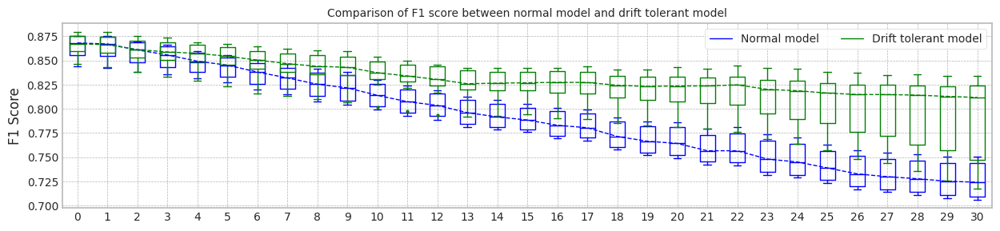

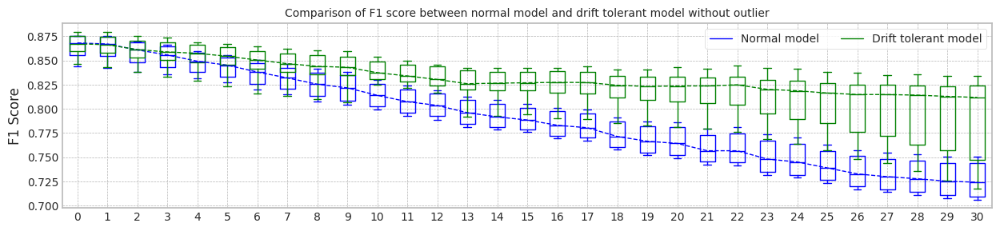

max_mean_trial= 8


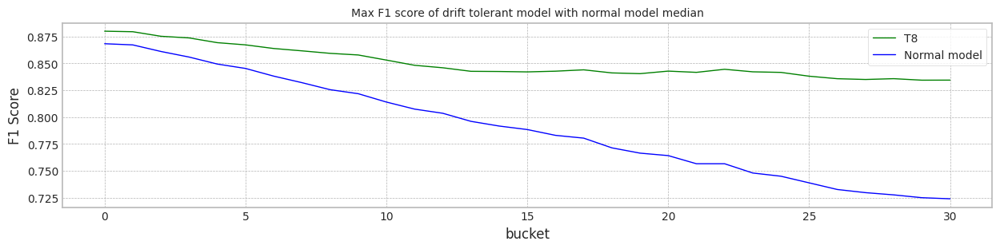

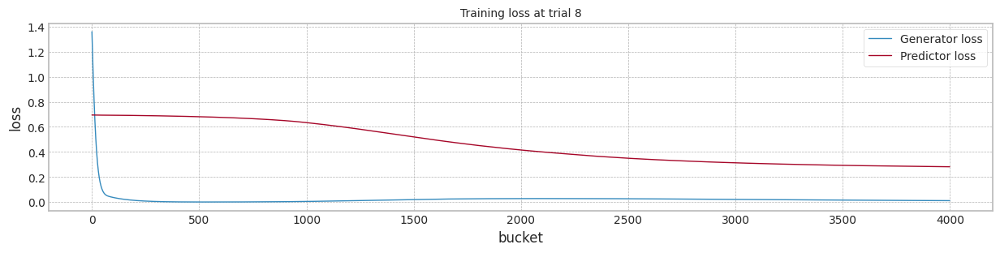

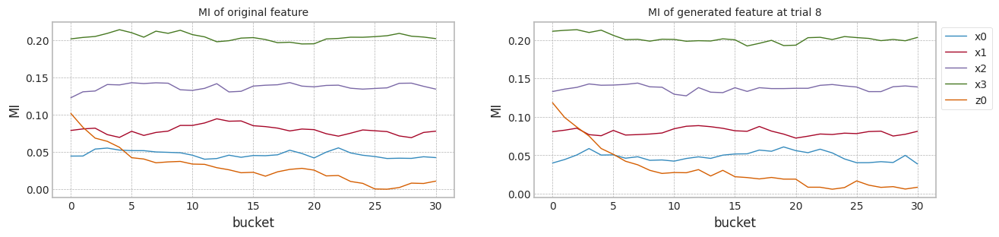

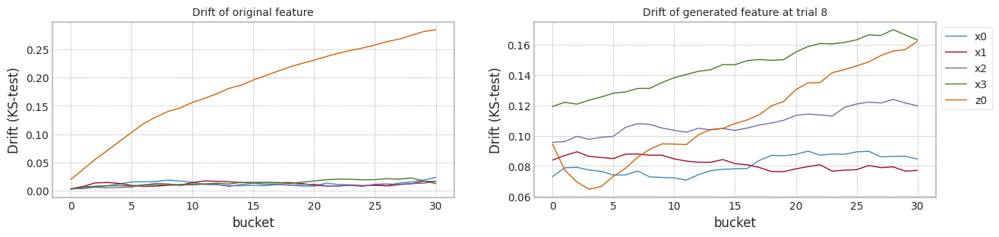

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.875559,0.875559,0.803337,0.741126
1,1.0,0.875257,0.875257,0.805070,0.744587
2,2.0,0.855528,0.855528,0.776875,0.706167
3,3.0,0.856505,0.856505,0.778560,0.708660
4,4.0,0.844004,0.844004,0.776411,0.712162
5,5.0,0.853198,0.853198,0.779636,0.710468
6,6.0,0.861137,0.861137,0.779373,0.708667
7,7.0,0.875663,0.875663,0.808895,0.750188
8,8.0,0.875463,0.875463,0.800106,0.735986
9,9.0,0.875583,0.875583,0.806241,0.745390


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.858110,0.858110,0.828708,0.814397
1,1.0,0.878801,0.878801,0.845027,0.820740
2,2.0,0.877607,0.877607,0.828515,0.742028
3,3.0,0.846171,0.846171,0.791322,0.732294
4,4.0,0.865918,0.865918,0.817636,0.761548
5,5.0,0.869642,0.869642,0.844551,0.831050
6,6.0,0.868709,0.868709,0.834669,0.809176
7,7.0,0.865646,0.865646,0.834402,0.824837
8,8.0,0.879842,0.879842,0.850129,0.834364
9,9.0,0.858088,0.858088,0.801864,0.717509


In [100]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100) #np.max(X1['b']+1))

## synthetic data의 생성 (Case #2 MI의 증감(상대적), Drift의 고정)

+ $P_t(y|X) \ne P_{t+w}(y|X)$ and $P_t(X) = P_{t+w}(X)$
+ Actual Drift
+ 즉, P(X)의 변화없이, Concept (본 Dataset에서 MI의 변화)만 변경


+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature에 대해 y의 비중이 시간에 따라 감소하도록 생성

### Dataset 준비

In [101]:
data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 2.5])

In [102]:
seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

In [103]:
x1.shape

(40000, 5)

In [104]:
import matplotlib.pyplot as plt

seed_everything()

y1_array = []
cor_const = cor[4]
for ii in range(x1.shape[0]):
    cor[4] = cor[4] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    y1_array.append(np.sum(cor * x1[ii])+e)

In [105]:
m = 5 #np.mean(y1_array[0:2000])
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
print(sum(y1))

5
21325


### 실험

MI Analysis MI Max 0.22746, Min 0.00677, Mean 0.06988, Std 0.08433
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:06<00:00,  4.60it/s]


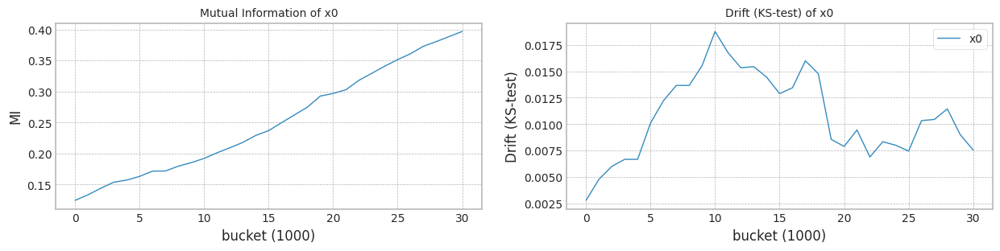

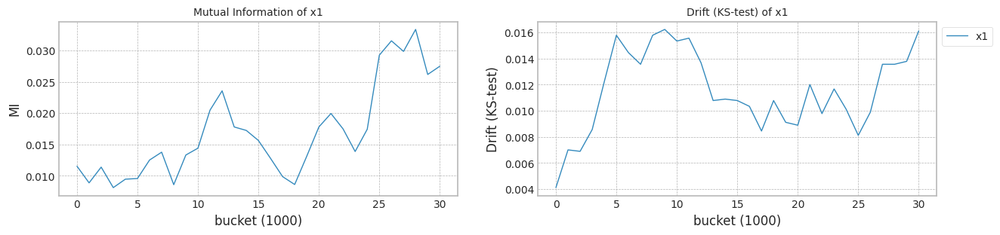

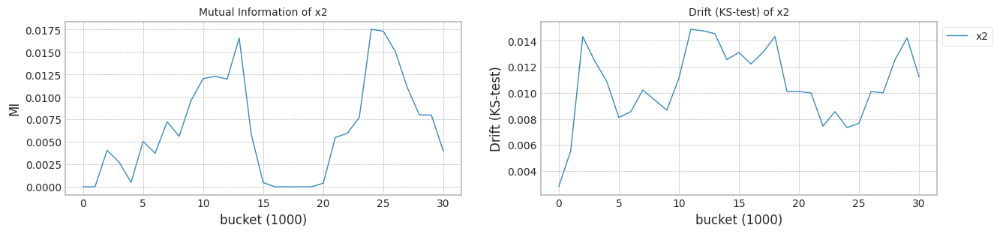

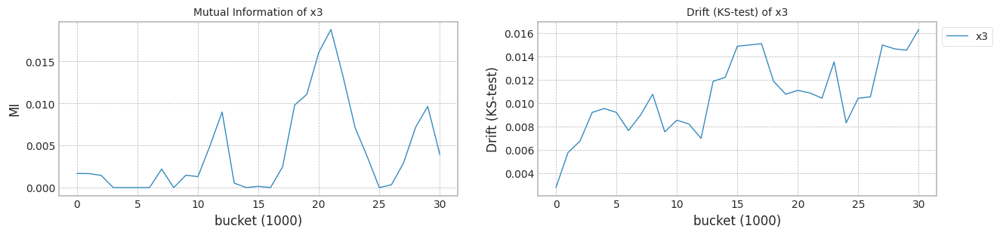

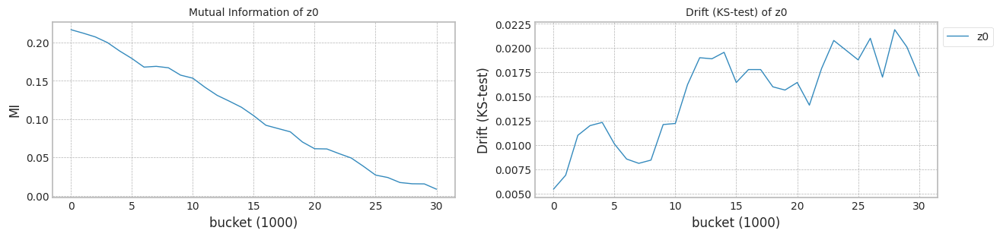

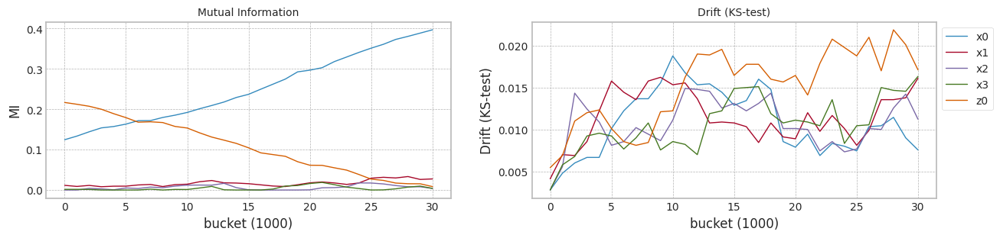

In [106]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

#train_size = 2100
#test_size = 400

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)
#model,df = train_classificaion_model(X1,Y1,train_size, test_size)

In [107]:
#bucket_size = 700
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.366139,0
1,0.610533,0.420412,0.508390,0.580336,0.662926,0
2,0.556874,0.464734,0.669603,0.724770,0.486574,0
3,0.344341,0.646524,0.340976,0.528780,0.611850,0
4,0.503142,0.550860,0.598773,0.465698,0.487044,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.709407,39
39996,0.358451,0.483875,0.341855,0.574439,0.695384,39
39997,0.559469,0.343824,0.542547,0.575250,0.504288,39
39998,0.433692,0.530132,0.301231,0.282353,0.762158,39


trial_count: 10
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 551.08it/s]


Test f1 score: 0.9365773646801531
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8642847292771869
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 199.83it/s]


Test f1 score: 0.9518826497243764
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.47it/s]


mean of drift:
x0    0.255075
x1    0.088928
x2    0.034247
x3    0.363806
z0    0.142022
dtype: float64
Mean F1 for all data: 0.9145783443717581
Normal model mean        : 0.8642847292771869
Drift tolerant model mean: 0.9145783443717581
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 549.39it/s]


Test f1 score: 0.9095621090259159
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.51it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.85329168099841
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 199.97it/s]


Test f1 score: 0.9562872023809523
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.48it/s]


mean of drift:
x0    0.236735
x1    0.082477
x2    0.049910
x3    0.312204
z0    0.252222
dtype: float64
Mean F1 for all data: 0.9148450968900799
Normal model mean        : 0.8587882051377984
Drift tolerant model mean: 0.914711720630919
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 559.48it/s]


Test f1 score: 0.9322837824200222
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8684525797318826
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.24it/s]


Test f1 score: 0.930771954674221
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.50it/s]


mean of drift:
x0    0.248129
x1    0.090222
x2    0.046409
x3    0.017351
z0    0.132401
dtype: float64
Mean F1 for all data: 0.9111311012852565
Normal model mean        : 0.8620096633358264
Drift tolerant model mean: 0.9135181808490316
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 555.42it/s]


Test f1 score: 0.9428676066654458
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8672823089981738
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.12it/s]


Test f1 score: 0.9442556708605016
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.50it/s]


mean of drift:
x0    0.232789
x1    0.068093
x2    0.030817
x3    0.285025
z0    0.117728
dtype: float64
Mean F1 for all data: 0.8950685911120938
Normal model mean        : 0.8633278247514133
Drift tolerant model mean: 0.9089057834147971
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 553.31it/s]


Test f1 score: 0.8506588579795021
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7940804543797344
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.18it/s]


Test f1 score: 0.9520790602274846
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.49it/s]


mean of drift:
x0    0.243835
x1    0.091946
x2    0.036842
x3    0.311710
z0    0.243677
dtype: float64
Mean F1 for all data: 0.8806026664109865
Normal model mean        : 0.8494783506770777
Drift tolerant model mean: 0.903245160014035
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 530.81it/s]


Test f1 score: 0.913331992760909
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.49it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8533114443146491
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 199.69it/s]


Test f1 score: 0.9590347923681257
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.50it/s]


mean of drift:
x0    0.235989
x1    0.089319
x2    0.060889
x3    0.436756
z0    0.205978
dtype: float64
Mean F1 for all data: 0.8970693182226038
Normal model mean        : 0.8501171996166729
Drift tolerant model mean: 0.9022158530487965
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 552.90it/s]


Test f1 score: 0.9217391304347826
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.51it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8645762925076509
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 202.05it/s]


Test f1 score: 0.968361581920904
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.254713
x1    0.067674
x2    0.042527
x3    0.550939
z0    0.132441
dtype: float64
Mean F1 for all data: 0.9247165604403103
Normal model mean        : 0.852182784315384
Drift tolerant model mean: 0.9054302398190127
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 558.85it/s]


Test f1 score: 0.9312034852060266
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8725484348557931
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.78it/s]


Test f1 score: 0.9405604042259991
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.48it/s]


mean of drift:
x0    0.180964
x1    0.077029
x2    0.068968
x3    0.170226
z0    0.242853
dtype: float64
Mean F1 for all data: 0.8972986252940278
Normal model mean        : 0.8547284906329351
Drift tolerant model mean: 0.9044137880033896
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 559.65it/s]


Test f1 score: 0.9285453882610282
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8574496308114765
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.35it/s]


Test f1 score: 0.962087087087087
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.50it/s]


mean of drift:
x0    0.254599
x1    0.101900
x2    0.065993
x3    0.327939
z0    0.135599
dtype: float64
Mean F1 for all data: 0.9070095066184277
Normal model mean        : 0.8550308395416619
Drift tolerant model mean: 0.9047022011828383
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 548.87it/s]


Test f1 score: 0.9091879391621452
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.54it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.015151
dtype: float64
Mean F1 for all data: 0.8498517790280777
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 203.25it/s]


Test f1 score: 0.9306613226452906
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.51it/s]


mean of drift:
x0    0.189642
x1    0.072158
x2    0.026631
x3    0.170677
z0    0.231842
dtype: float64
Mean F1 for all data: 0.8324849474923853
Normal model mean        : 0.8545129334903034
Drift tolerant model mean: 0.897480475813793


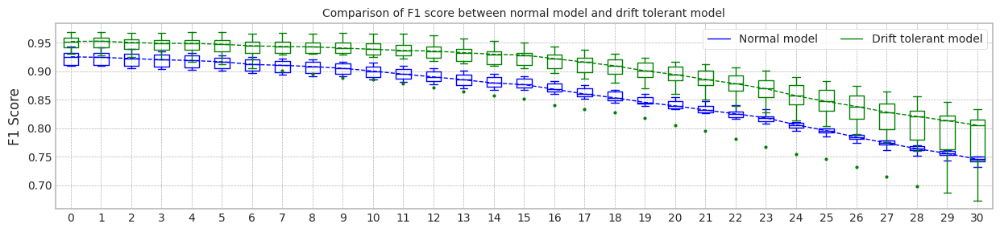

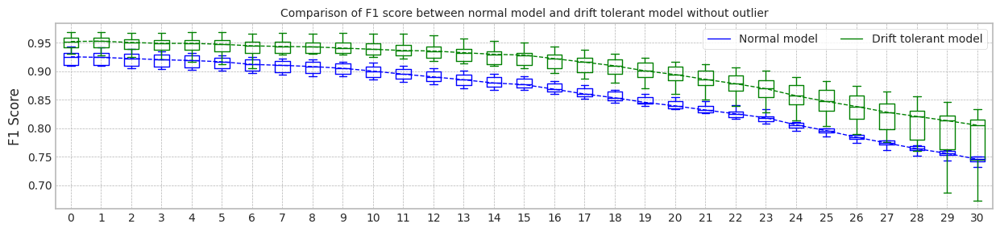

max_mean_trial= 6


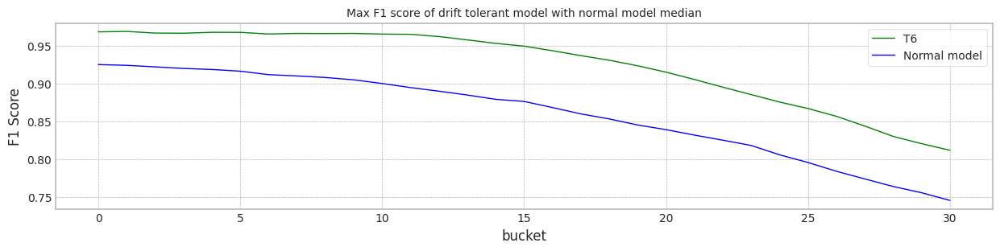

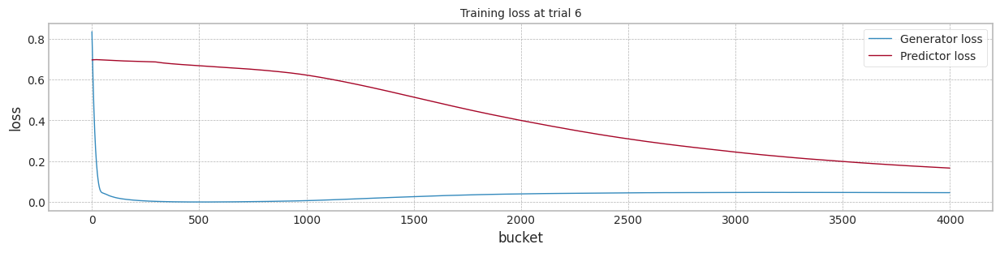

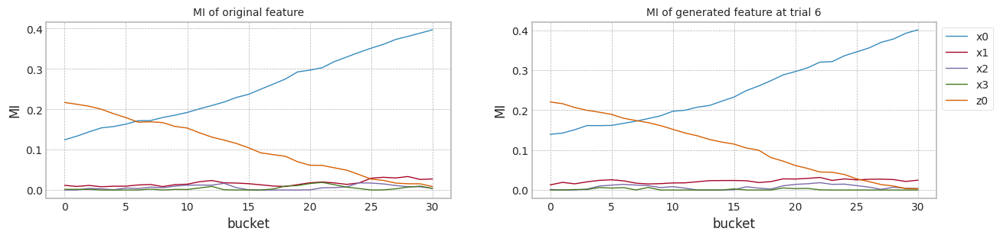

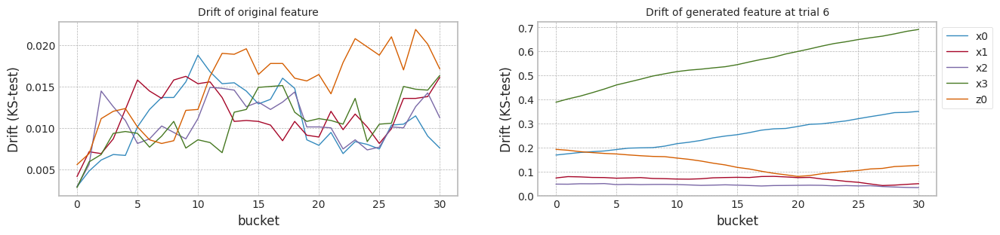

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.936577,0.936577,0.864285,0.749950
1,1.0,0.909562,0.909562,0.853292,0.750074
2,2.0,0.932284,0.932284,0.868453,0.741671
3,3.0,0.942868,0.942868,0.867282,0.749798
4,4.0,0.850659,0.850659,0.794080,0.710292
5,5.0,0.913332,0.913332,0.853311,0.731653
6,6.0,0.921739,0.921739,0.864576,0.746007
7,7.0,0.931203,0.931203,0.872548,0.763881
8,8.0,0.928545,0.928545,0.857450,0.743386
9,9.0,0.909188,0.909188,0.849852,0.745248


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.951883,0.951883,0.914578,0.825980
1,1.0,0.956287,0.956287,0.914845,0.815843
2,2.0,0.930772,0.930772,0.911131,0.834022
3,3.0,0.944256,0.944256,0.895069,0.807014
4,4.0,0.952079,0.952079,0.880603,0.735959
5,5.0,0.959035,0.959035,0.897069,0.739066
6,6.0,0.968362,0.968362,0.924717,0.811900
7,7.0,0.940560,0.940560,0.897299,0.803360
8,8.0,0.962087,0.962087,0.907010,0.762766
9,9.0,0.930661,0.930661,0.832485,0.673432


In [108]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100) #np.max(X1['b']+1))


## synthetic data의 생성 (Case #3 MI의 증감(상대적), Drift의 증가)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ 이때 대상 feature $z_0$에 대해서 MI 증가, ks-test 통계량 증가
+ 이에따라 $X_0$의 MI 감소

+ 5개의 feature
+ 각각 importance를 부여
+ 그 중, 1개의 feature는 가변 data drift, MI는 고정

### Dataset 준비

In [109]:
import matplotlib.pyplot as plt

cor = np.asarray([2.5, 1.2, 0.9 , 0.7, 1.5])

seed_everything()

x1 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x1[:,ix] = np.random.normal(1,cor_,data_size)

seed_everything()

y1_array = []
cor_const = cor[0]
for ii in range(x1.shape[0]):
    cor[0] = cor[0] - cor_const / x1.shape[0]
    e = np.random.normal(0.0, 2.0)
    e1 = np.random.normal(0.0,  4*ii/40000)
    x1[ii,4] = x1[ii,4] + e1
    y1_array.append(np.sum(cor * x1[ii])+e)

In [110]:
m = np.mean(y1_array)
print(m)
y1 = [1 if y_ > m else 0 for y_ in y1_array]
sum(y1)

5.568336092094251


19898

### 실험

MI Analysis MI Max 0.18765, Min 0.00339, Mean 0.06075, Std 0.07062
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:06<00:00,  4.64it/s]


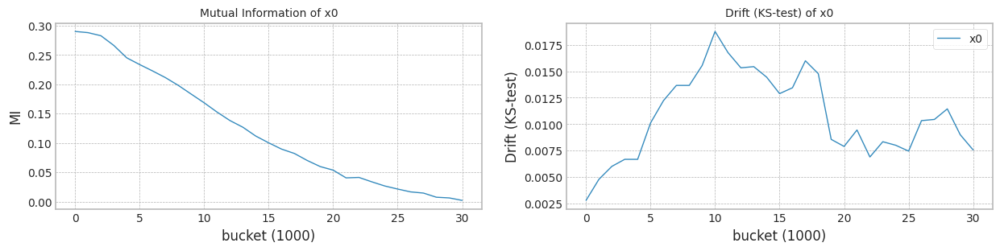

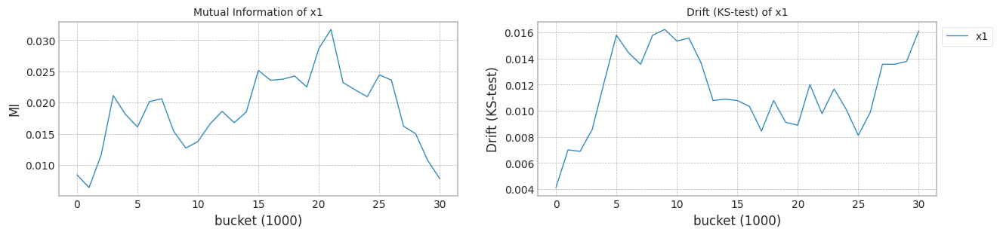

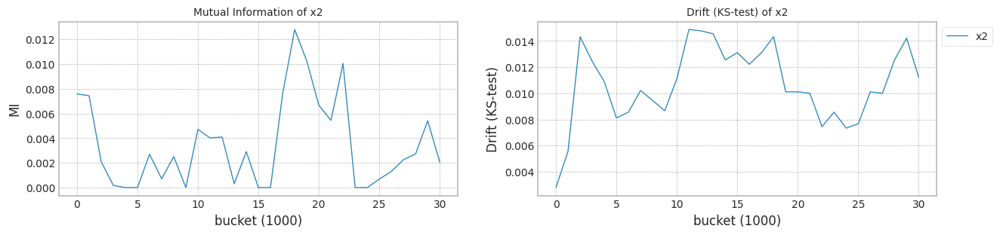

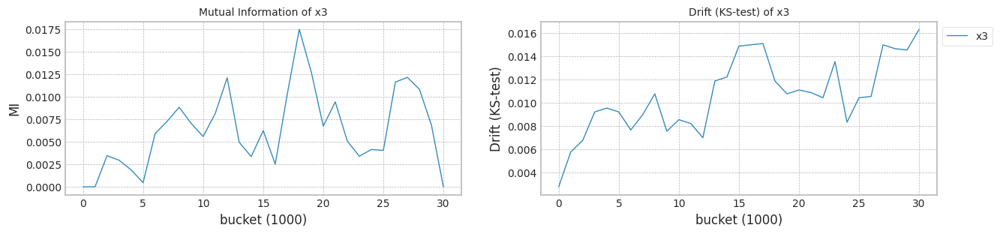

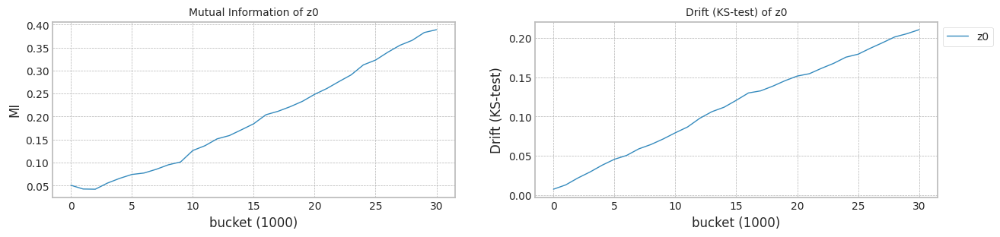

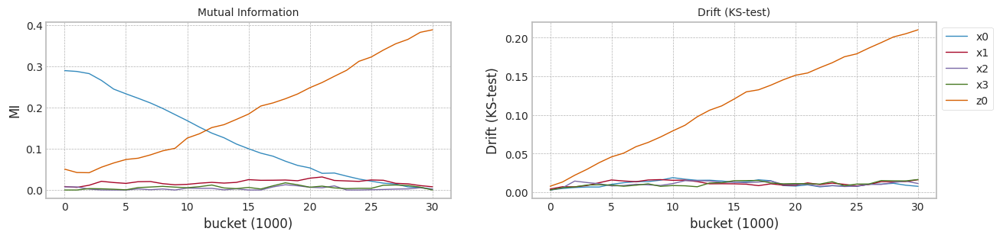

In [111]:
columns=['x0','x1','x2','x3','z0']
X1 = pd.DataFrame(x1,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X1, y1,train_size, test_size)

In [112]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.525799,0.497734,0.329063,0.549493,0.348766,0
1,0.610533,0.420412,0.508390,0.580336,0.603602,0
2,0.556874,0.464734,0.669603,0.724770,0.452177,0
3,0.344341,0.646524,0.340976,0.528780,0.559737,0
4,0.503142,0.550860,0.598773,0.465698,0.452611,0
...,...,...,...,...,...,...
39995,0.333622,0.399822,0.303105,0.605408,0.612303,39
39996,0.358451,0.483875,0.341855,0.574439,0.395651,39
39997,0.559469,0.343824,0.542547,0.575250,0.268402,39
39998,0.433692,0.530132,0.301231,0.282353,0.347175,39


trial_count: 10
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 546.68it/s]


Test f1 score: 0.9054407913878383
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.54it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8453543721755923
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 199.71it/s]


Test f1 score: 0.8969061974893744
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.48it/s]


mean of drift:
x0    0.228129
x1    0.088147
x2    0.042624
x3    0.240509
z0    0.233283
dtype: float64
Mean F1 for all data: 0.8522791274058752
Normal model mean        : 0.8453543721755923
Drift tolerant model mean: 0.8522791274058752
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 559.44it/s]


Test f1 score: 0.8943554538520213
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.51it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8331323541594289
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.43it/s]


Test f1 score: 0.9008085190297772
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.49it/s]


mean of drift:
x0    0.356670
x1    0.130677
x2    0.055986
x3    0.056928
z0    0.222749
dtype: float64
Mean F1 for all data: 0.8070763792052823
Normal model mean        : 0.8392433631675106
Drift tolerant model mean: 0.8296777533055788
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 554.78it/s]


Test f1 score: 0.9052734375000001
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8398637369354993
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 200.31it/s]


Test f1 score: 0.9004588444610919
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.49it/s]


mean of drift:
x0    0.176093
x1    0.066079
x2    0.030785
x3    0.012749
z0    0.184538
dtype: float64
Mean F1 for all data: 0.8631128152685468
Normal model mean        : 0.8394501544235068
Drift tolerant model mean: 0.8408227739599013
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 553.60it/s]


Test f1 score: 0.8840999249490725
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.54it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8341611715590737
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 194.91it/s]


Test f1 score: 0.8936664729808251
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.48it/s]


mean of drift:
x0    0.273043
x1    0.063427
x2    0.024900
x3    0.135781
z0    0.217018
dtype: float64
Mean F1 for all data: 0.8523615635850337
Normal model mean        : 0.8381279087073985
Drift tolerant model mean: 0.8437074713661845
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 560.34it/s]


Test f1 score: 0.8720298348428343
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.49it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8181127484850822
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.45it/s]


Test f1 score: 0.8905608755129959
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.47it/s]


mean of drift:
x0    0.290541
x1    0.072842
x2    0.024527
x3    0.213595
z0    0.228581
dtype: float64
Mean F1 for all data: 0.8403377746529715
Normal model mean        : 0.8341248766629352
Drift tolerant model mean: 0.843033532023542
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 557.90it/s]


Test f1 score: 0.8782599285791581
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8354662202166913
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.27it/s]


Test f1 score: 0.8978664559462664
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.50it/s]


mean of drift:
x0    0.197391
x1    0.085889
x2    0.067276
x3    0.153312
z0    0.267262
dtype: float64
Mean F1 for all data: 0.856694669121644
Normal model mean        : 0.8343484339218946
Drift tolerant model mean: 0.845310388206559
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 555.82it/s]


Test f1 score: 0.8791446160492493
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.54it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8325955808389909
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.23it/s]


Test f1 score: 0.901450427180608
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.287276
x1    0.071498
x2    0.043688
x3    0.340685
z0    0.212075
dtype: float64
Mean F1 for all data: 0.829162123211043
Normal model mean        : 0.8340980263386226
Drift tolerant model mean: 0.8430034932071997
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 560.26it/s]


Test f1 score: 0.8967517401392112
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.49it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8294344804851029
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 202.57it/s]


Test f1 score: 0.8940047021943575
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.49it/s]


mean of drift:
x0    0.223082
x1    0.077584
x2    0.029158
x3    0.063047
z0    0.292229
dtype: float64
Mean F1 for all data: 0.8460170640208431
Normal model mean        : 0.8335150831069327
Drift tolerant model mean: 0.8433801895589049
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 562.17it/s]


Test f1 score: 0.8774872847327564
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.818966236984827
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 202.48it/s]


Test f1 score: 0.8984932593180016
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.49it/s]


mean of drift:
x0    0.234247
x1    0.135778
x2    0.075570
x3    0.203606
z0    0.217294
dtype: float64
Mean F1 for all data: 0.8516431090970401
Normal model mean        : 0.8318985446489209
Drift tolerant model mean: 0.8442982917298089
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 556.79it/s]


Test f1 score: 0.8859665602104076
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.010828
x1    0.011545
x2    0.010692
x3    0.010649
z0    0.114068
dtype: float64
Mean F1 for all data: 0.8391685048733114
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 203.03it/s]


Test f1 score: 0.8925390856916683
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.157341
x1    0.133914
x2    0.034412
x3    0.120649
z0    0.246552
dtype: float64
Mean F1 for all data: 0.8570318285154357
Normal model mean        : 0.83262554067136
Drift tolerant model mean: 0.8455716454083715


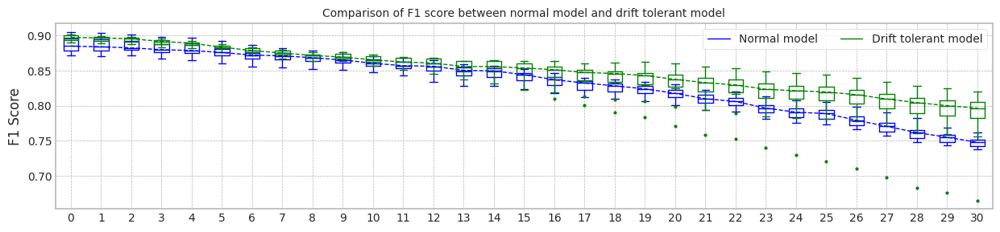

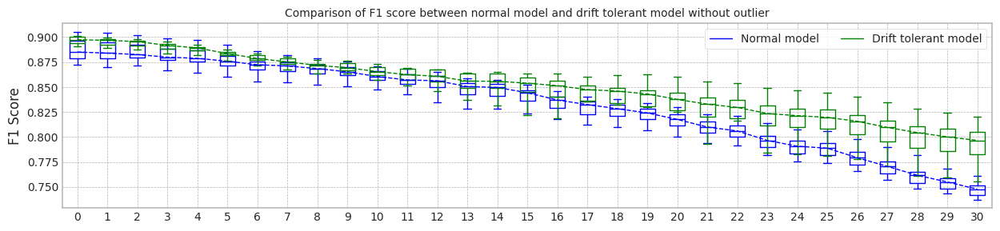

max_mean_trial= 2


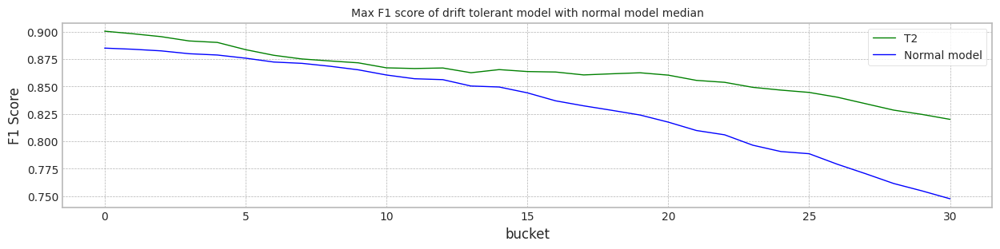

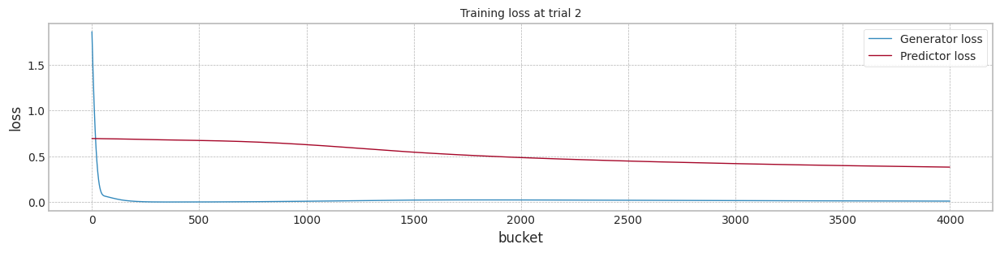

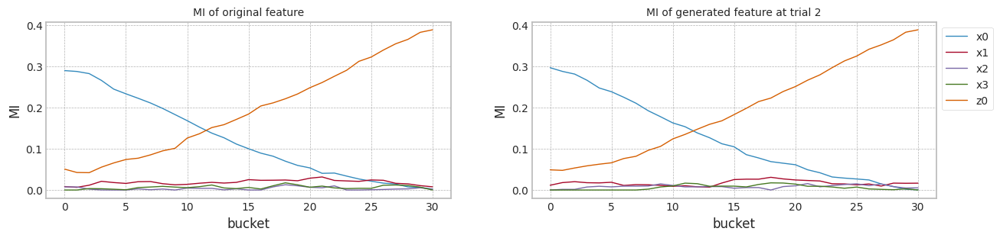

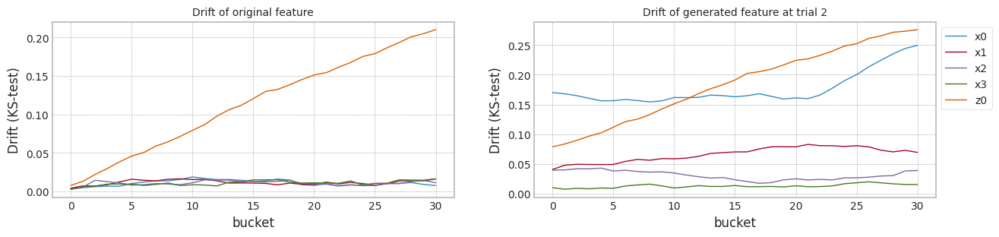

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.905441,0.905441,0.845354,0.761285
1,1.0,0.894355,0.894355,0.833132,0.749946
2,2.0,0.905273,0.905273,0.839864,0.748671
3,3.0,0.884100,0.884100,0.834161,0.743378
4,4.0,0.872030,0.872030,0.818113,0.737296
5,5.0,0.878260,0.878260,0.835466,0.751474
6,6.0,0.879145,0.879145,0.832596,0.746631
7,7.0,0.896752,0.896752,0.829434,0.738907
8,8.0,0.877487,0.877487,0.818966,0.741661
9,9.0,0.885967,0.885967,0.839169,0.772128


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.896906,0.896906,0.852279,0.806396
1,1.0,0.900809,0.900809,0.807076,0.664757
2,2.0,0.900459,0.900459,0.863113,0.820066
3,3.0,0.893666,0.893666,0.852362,0.802121
4,4.0,0.890561,0.890561,0.840338,0.780551
5,5.0,0.897866,0.897866,0.856695,0.801889
6,6.0,0.901450,0.901450,0.829162,0.755626
7,7.0,0.894005,0.894005,0.846017,0.791217
8,8.0,0.898493,0.898493,0.851643,0.788462
9,9.0,0.892539,0.892539,0.857032,0.810057


In [113]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100) #np.max(X1['b']+1))


## synthetic data의 생성 (Case #4 MI의 고정, Drift의 증가)

+ $P_t(y|X) = P_{t+w}(y|X)$ and $P_t(X) \ne P_{t+w}(X)$
+ Virtual Drift
+ 즉, Concept (본 Dataset에서 MI의 변화)의 변화는 없고, P(X)만 변함.

### Dataset 준비

In [114]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.9 , 0.7, 0.5])

y3= (np.random.normal(0.5,0.5,data_size) > 0.5).astype(int)
x3 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    '''
    x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)
    '''
    # z0
    if ix == 4:
        for ii in range(len(y3)):
            x3[ii,ix] = y3[ii] + np.random.normal(0.0 + 4*ii/data_size,cor_)
    else:
        x3[:,ix] = y3 + np.random.normal(1,cor_,data_size)


### 실험

MI Analysis MI Max 0.20278, Min 0.05089, Mean 0.11172, Std 0.05282
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:06<00:00,  4.66it/s]


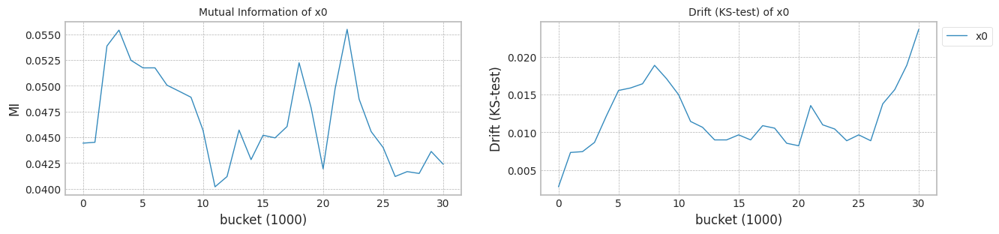

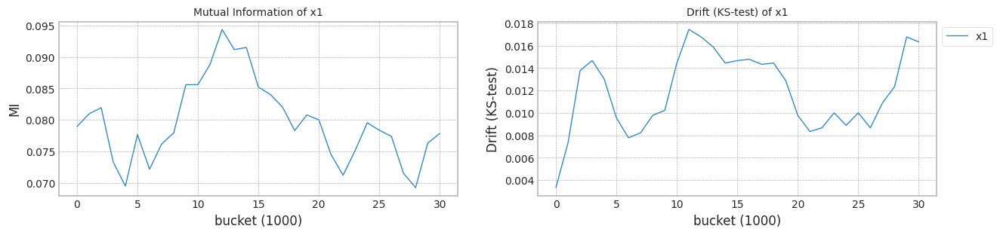

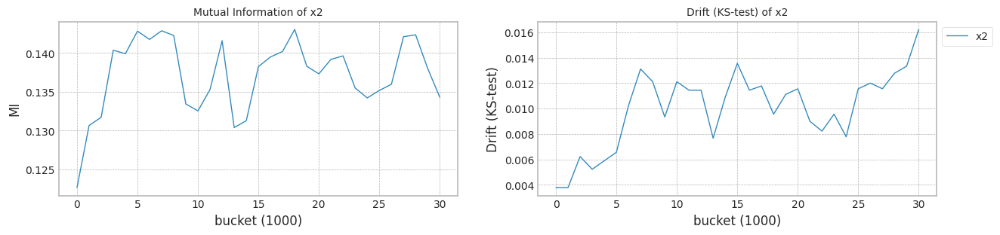

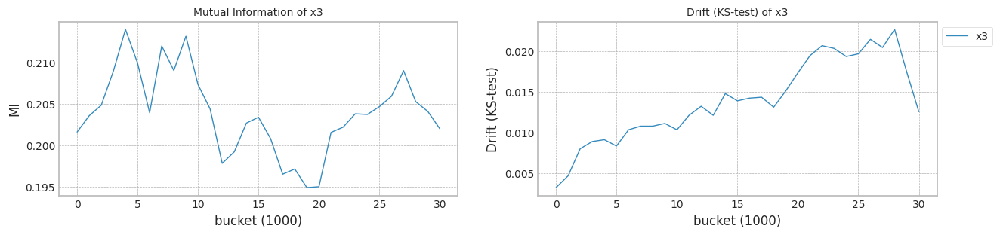

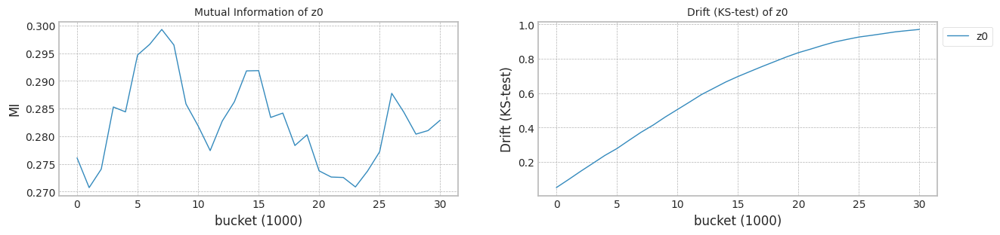

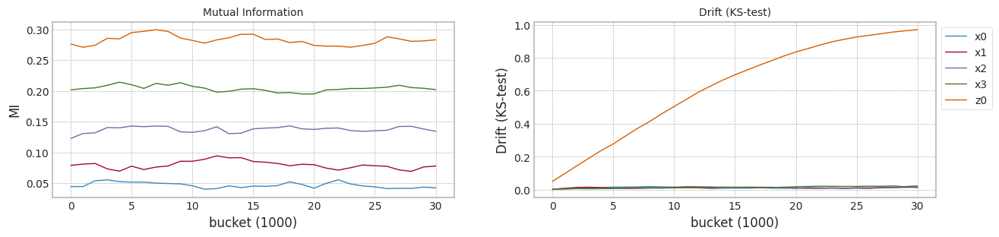

In [115]:
columns=['x0','x1','x2','x3','z0']
X3 = pd.DataFrame(x3,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X3, y3,train_size, test_size)

In [116]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,x0,x1,x2,x3,z0,b
0,0.520974,0.392205,0.600995,0.478669,0.477486,0
1,0.447230,0.556479,0.629077,0.735705,0.578715,0
2,0.489501,0.704159,0.760582,0.582973,0.354045,0
3,0.581446,0.301839,0.443337,0.515173,0.360338,0
4,0.571642,0.639275,0.524701,0.583380,0.597569,0
...,...,...,...,...,...,...
39995,0.346158,0.267147,0.513105,0.599663,0.989291,39
39996,0.426322,0.302644,0.484909,0.587518,1.004704,39
39997,0.374186,0.587769,0.624447,0.598315,1.321791,39
39998,0.470439,0.265430,0.218971,0.645349,1.148847,39


trial_count: 10
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 545.91it/s]


Test f1 score: 0.9094218415417559
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7553238378309143
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.75it/s]


Test f1 score: 0.9143297041680415
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.093057
x1    0.607032
x2    0.218258
x3    0.246925
z0    0.303996
dtype: float64
Mean F1 for all data: 0.9073047560676344
Normal model mean        : 0.7553238378309143
Drift tolerant model mean: 0.9073047560676344
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 543.32it/s]


Test f1 score: 0.9004610226320201
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7426420890419302
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 197.71it/s]


Test f1 score: 0.9213826191255042
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.119315
x1    0.191229
x2    0.240616
x3    0.251882
z0    0.341667
dtype: float64
Mean F1 for all data: 0.9147851198018191
Normal model mean        : 0.7489829634364222
Drift tolerant model mean: 0.9110449379347267
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 554.42it/s]


Test f1 score: 0.8989945155393052
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.49it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7795684763418709
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.58it/s]


Test f1 score: 0.9125156969443281
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.50it/s]


mean of drift:
x0    0.265939
x1    0.230226
x2    0.234459
x3    0.251358
z0    0.432057
dtype: float64
Mean F1 for all data: 0.8806082325069917
Normal model mean        : 0.759178134404905
Drift tolerant model mean: 0.9008993694588151
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 556.47it/s]


Test f1 score: 0.9095629597576806
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.50it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7643952962108309
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 202.09it/s]


Test f1 score: 0.910362920857018
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.51it/s]


mean of drift:
x0    0.501566
x1    0.107588
x2    0.277455
x3    0.279384
z0    0.350667
dtype: float64
Mean F1 for all data: 0.9053377420517814
Normal model mean        : 0.7604824248563865
Drift tolerant model mean: 0.9020089626070567
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 556.86it/s]


Test f1 score: 0.9053103007037748
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7504716963229595
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 199.75it/s]


Test f1 score: 0.9112841320320211
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.54it/s]


mean of drift:
x0    0.519265
x1    0.116763
x2    0.263982
x3    0.298731
z0    0.388527
dtype: float64
Mean F1 for all data: 0.9112040914710131
Normal model mean        : 0.7584802791497011
Drift tolerant model mean: 0.903847988379848
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 552.92it/s]


Test f1 score: 0.8929020459481084
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.55it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7700523497988314
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 200.43it/s]


Test f1 score: 0.9147814627717987
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.50it/s]


mean of drift:
x0    0.530602
x1    0.157222
x2    0.206312
x3    0.240176
z0    0.333842
dtype: float64
Mean F1 for all data: 0.9117893213151788
Normal model mean        : 0.7604089575912228
Drift tolerant model mean: 0.9051715438690698
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 557.30it/s]


Test f1 score: 0.9014436739797659
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7816751299196717
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 200.53it/s]


Test f1 score: 0.9125082435700154
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.51it/s]


mean of drift:
x0    0.561072
x1    0.083025
x2    0.257720
x3    0.302889
z0    0.462233
dtype: float64
Mean F1 for all data: 0.9071025607377375
Normal model mean        : 0.7634469822095726
Drift tolerant model mean: 0.9054474034217366
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 561.58it/s]


Test f1 score: 0.9087996582656984
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7576247123791781
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 202.02it/s]


Test f1 score: 0.9141480508103371
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.51it/s]


mean of drift:
x0    0.394978
x1    0.225634
x2    0.261810
x3    0.254613
z0    0.352789
dtype: float64
Mean F1 for all data: 0.9130152369637055
Normal model mean        : 0.7627191984807734
Drift tolerant model mean: 0.9063933826144827
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 550.45it/s]


Test f1 score: 0.9107334910733491
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.35it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7615620223789831
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.12it/s]


Test f1 score: 0.9125851087195256
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.55it/s]


mean of drift:
x0    0.147158
x1    0.546419
x2    0.264007
x3    0.265620
z0    0.481541
dtype: float64
Mean F1 for all data: 0.895217217810448
Normal model mean        : 0.7625906233583523
Drift tolerant model mean: 0.9051515865251455
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 553.30it/s]


Test f1 score: 0.9069319640564827
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.57it/s]


mean of drift:
x0    0.011903
x1    0.011896
x2    0.010036
x3    0.013871
z0    0.624315
dtype: float64
Mean F1 for all data: 0.7611482331474735
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 203.49it/s]


Test f1 score: 0.9039599453800637
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.489900
x1    0.136484
x2    0.233810
x3    0.248498
z0    0.326627
dtype: float64
Mean F1 for all data: 0.8949440444199436
Normal model mean        : 0.7624463843372643
Drift tolerant model mean: 0.9041308323146253


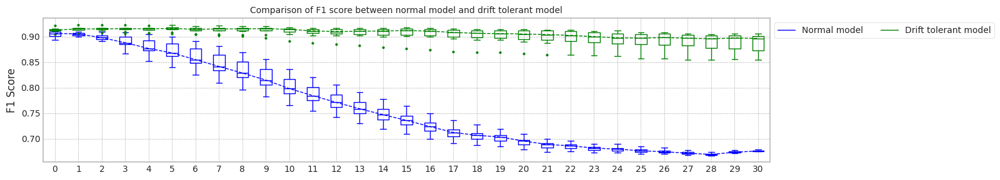

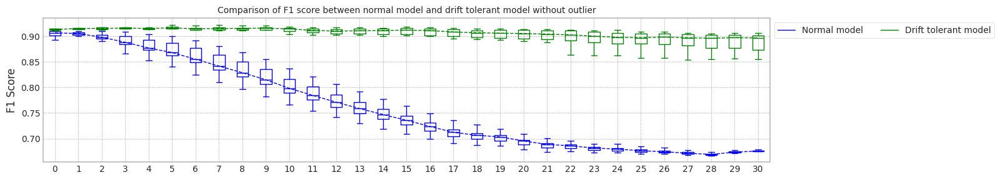

max_mean_trial= 1


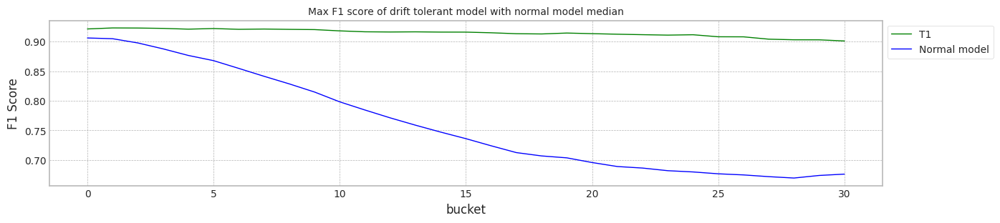

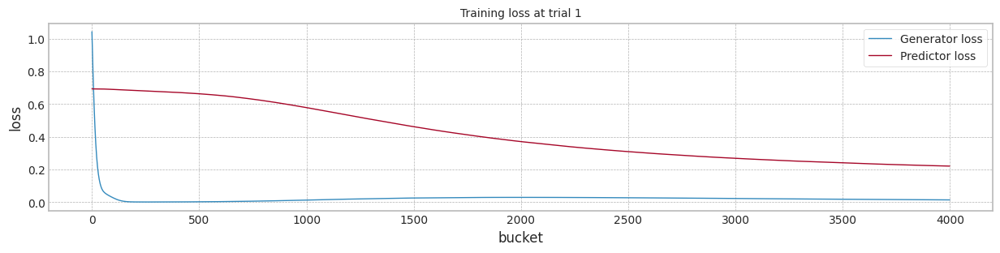

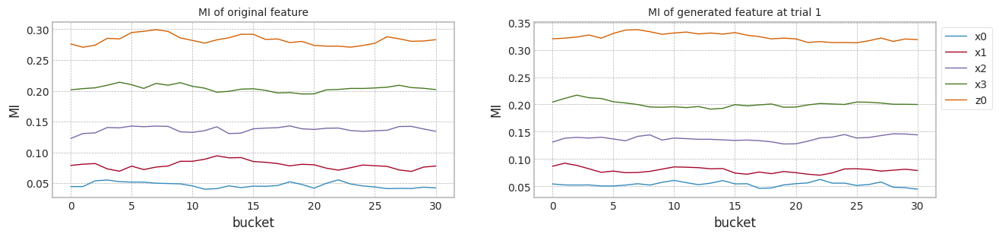

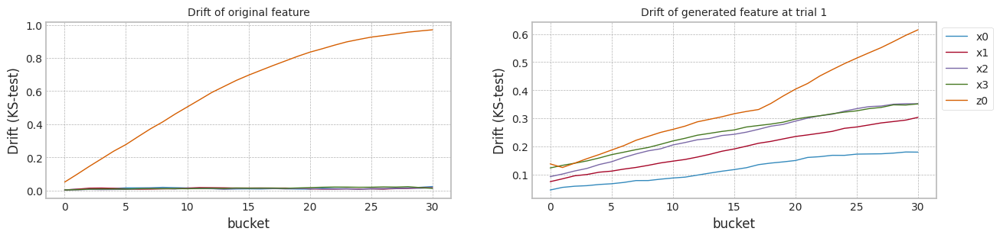

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.909422,0.909422,0.755324,0.675173
1,1.0,0.900461,0.900461,0.742642,0.674775
2,2.0,0.898995,0.898995,0.779568,0.677723
3,3.0,0.909563,0.909563,0.764395,0.677021
4,4.0,0.905310,0.905310,0.750472,0.674924
5,5.0,0.892902,0.892902,0.770052,0.675722
6,6.0,0.901444,0.901444,0.781675,0.679181
7,7.0,0.908800,0.908800,0.757625,0.675622
8,8.0,0.910733,0.910733,0.761562,0.675921
9,9.0,0.906932,0.906932,0.761148,0.676821


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.914330,0.914330,0.907305,0.890630
1,1.0,0.921383,0.921383,0.914785,0.901059
2,2.0,0.912516,0.912516,0.880608,0.854955
3,3.0,0.910363,0.910363,0.905338,0.899258
4,4.0,0.911284,0.911284,0.911204,0.905900
5,5.0,0.914781,0.914781,0.911789,0.899692
6,6.0,0.912508,0.912508,0.907103,0.893076
7,7.0,0.914148,0.914148,0.913015,0.905923
8,8.0,0.912585,0.912585,0.895217,0.855059
9,9.0,0.903960,0.903960,0.894944,0.867227


In [117]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100) #np.max(X1['b']+1))


## synthetic data의 생성 (Case #5 - Case #1,2,3,4의 상황이 각 feature에 혼재되어 있는 경우)

+ $P_t(y,X) \ne P_{t+w}(y,X) $ 이고 $P_t(y|X) \ne P_{t+w}(y|X) $
+ 전체적으로는 Real concept drift
+ 즉, P(y|X)와 P(X)의 변화가 연관되어 나타남.
+ $x_0$ : No drift
+ $x_1$ : $P_t(y|X) = P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Virtual Drift
+ $x_2$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Real Concept Drift, MI 감소, Drift 증가
+ $x_3$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) \ne P_{t+w}(X)$ 인 Real Concept Drift, MI 증가, Drift 증가
+ $z_0$ : $P_t(y|X) \ne P_{t+w}(y|X)$ 이면서 $P_t(X) = P_{t+w}(X)$ 인 Actual Drift, MI 감소, Drift 고정


### Dataset 준비

In [118]:
seed_everything()

data_size = 40000
cor = np.asarray([1.5, 1.2, 0.5 , 0.7, 2.5])

x4 = np.zeros((data_size,5))
for ix,cor_ in enumerate(cor):
    x4[:,ix] = np.random.normal(1,cor_,data_size)

y4_array = []
cor_const = cor[4]
cor_const2 = 3/x4.shape[0]
for ii in range(x4.shape[0]):
    # Case #2, MI의 증감(상대적), Drift의 고정 - z0
    cor[4] = cor[4] - cor_const / x4.shape[0]
    e = np.random.normal(0.0, 2.0)
    # Case #3 MI의 증감(상대적), Drift의 증가 - x3
    e1 = np.random.normal(0.0, 3*cor_const2 * ii)
    x4[ii,3] = x4[ii,3] + e1
    y4_array.append(np.sum(cor * x4[ii])+e)

y4 = [1 if y_ > 5 else 0 for y_ in y4_array]

for i in range(len(y4)):
    #Case #1 MI의 감소, Drift의 증가 - x2
    x4[i,2] = y4[i] + np.random.normal(1,0.5+(i/data_size))
    #Case #4 MI의 고정, Drift의 증가 - x1
    x4[i,1] = y4[i] + np.random.normal(0.0 + 4*(i/data_size),cor[1])


### 실험

MI Analysis MI Max 0.14553, Min 0.02498, Mean 0.08409, Std 0.04454
Dataset structure X_train, (9000, 5) X_test, (9000, 5) X_live (39000, 5)
Truncate 8000 rows from live_set (39000, 5)
Search MI & Drift...for X_live_set (31, 9000, 5)


100%|██████████| 31/31 [00:06<00:00,  4.64it/s]


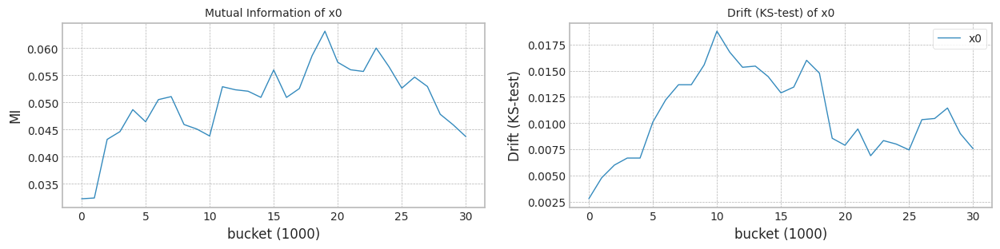

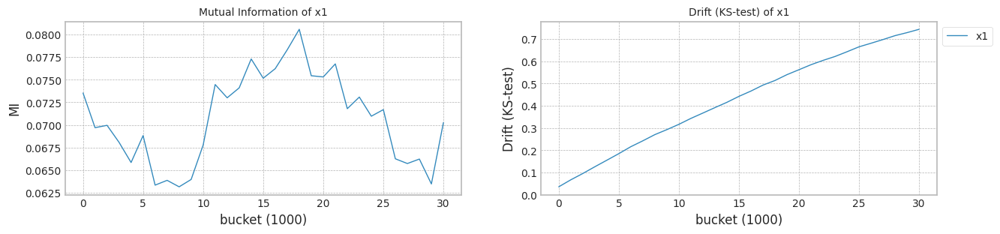

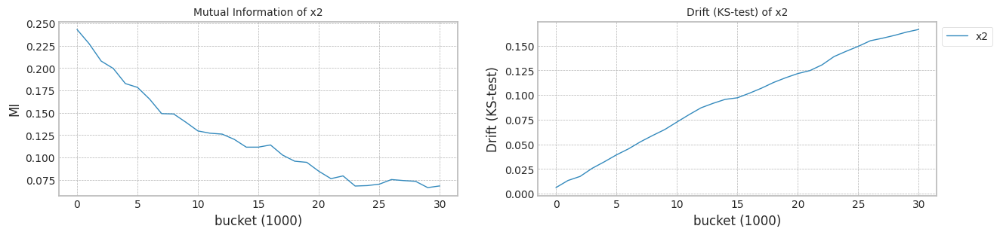

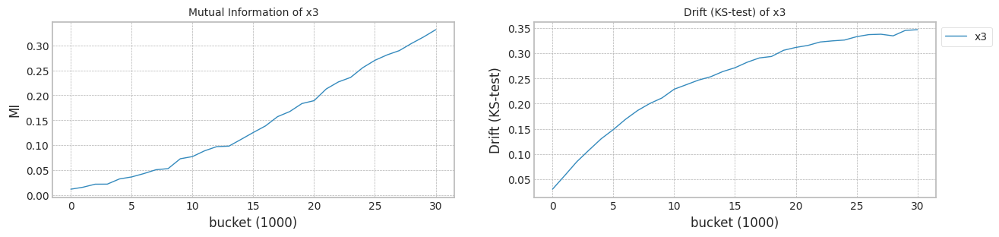

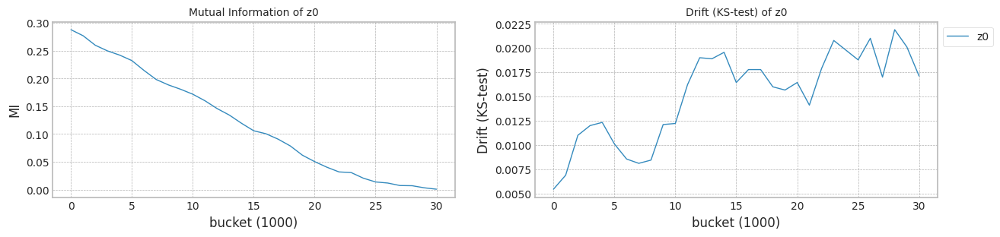

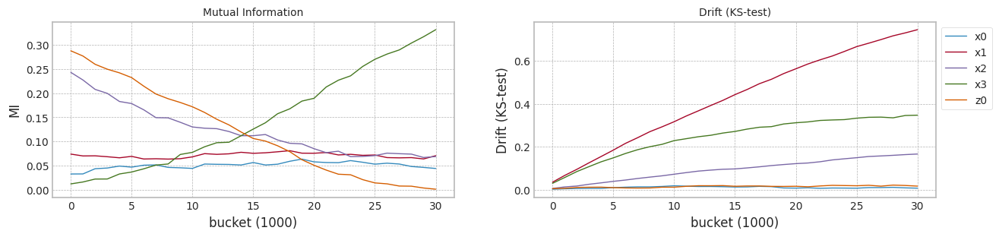

In [119]:
columns=['x0','x1','x2','x3','z0']
X4 = pd.DataFrame(x4,columns=columns)

train_size = 9000
test_size = 1000

X1,Y1 = check_mi_drift(X4, y4,train_size, test_size)

In [120]:
bucket_size = 1000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]


trial_count: 10
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 553.06it/s]


Test f1 score: 0.9100519112789052
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.49it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6955085967796114
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.69it/s]


Test f1 score: 0.9320780094149295
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.49it/s]


mean of drift:
x0    0.163254
x1    0.346247
x2    0.136100
x3    0.458430
z0    0.212276
dtype: float64
Mean F1 for all data: 0.8213330417332113
Normal model mean        : 0.6955085967796114
Drift tolerant model mean: 0.8213330417332113
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 558.26it/s]


Test f1 score: 0.9004264787687744
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6792197135633432
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.58it/s]


Test f1 score: 0.932657356035967
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.50it/s]


mean of drift:
x0    0.079412
x1    0.362943
x2    0.134283
x3    0.547136
z0    0.199147
dtype: float64
Mean F1 for all data: 0.78465046182834
Normal model mean        : 0.6873641551714773
Drift tolerant model mean: 0.8029917517807756
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 556.60it/s]


Test f1 score: 0.9145961170908359
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7518815702276859
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 202.57it/s]


Test f1 score: 0.925281473899693
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.50it/s]


mean of drift:
x0    0.137624
x1    0.328968
x2    0.153057
x3    0.387556
z0    0.234283
dtype: float64
Mean F1 for all data: 0.7871787147487646
Normal model mean        : 0.7088699601902135
Drift tolerant model mean: 0.7977207394367719
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 558.77it/s]


Test f1 score: 0.9121315192743764
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7176857800038914
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 202.32it/s]


Test f1 score: 0.9294343240651965
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.131416
x1    0.330082
x2    0.225057
x3    0.416785
z0    0.161065
dtype: float64
Mean F1 for all data: 0.8015665620354517
Normal model mean        : 0.7110739151436329
Drift tolerant model mean: 0.7986821950864419
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 554.77it/s]


Test f1 score: 0.8971049234740918
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.55it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6757244203938739
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.78it/s]


Test f1 score: 0.9314093314093315
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:07<00:00,  4.35it/s]


mean of drift:
x0    0.132409
x1    0.377839
x2    0.262165
x3    0.610434
z0    0.227186
dtype: float64
Mean F1 for all data: 0.7928095111674787
Normal model mean        : 0.7040040161936811
Drift tolerant model mean: 0.7975076583026492
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 558.60it/s]


Test f1 score: 0.9023869984763839
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.50it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7051551341264631
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.31it/s]


Test f1 score: 0.9230192217533989
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.48it/s]


mean of drift:
x0    0.124731
x1    0.310703
x2    0.143097
x3    0.354552
z0    0.118416
dtype: float64
Mean F1 for all data: 0.7817601863167297
Normal model mean        : 0.7041958691824782
Drift tolerant model mean: 0.7948830796383293
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 556.22it/s]


Test f1 score: 0.902545380793023
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.70665046647586
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 202.50it/s]


Test f1 score: 0.9264931087289434
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.49it/s]


mean of drift:
x0    0.196910
x1    0.328086
x2    0.250140
x3    0.657434
z0    0.228921
dtype: float64
Mean F1 for all data: 0.8176735060603882
Normal model mean        : 0.7045465259386756
Drift tolerant model mean: 0.7981388548414806
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 561.01it/s]


Test f1 score: 0.911817410166934
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7089878126390659
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.63it/s]


Test f1 score: 0.9270198170731708
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.52it/s]


mean of drift:
x0    0.141810
x1    0.347301
x2    0.216022
x3    0.558434
z0    0.158699
dtype: float64
Mean F1 for all data: 0.7955573488401245
Normal model mean        : 0.7051016867762243
Drift tolerant model mean: 0.797816166591311
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 549.47it/s]


Test f1 score: 0.9141776937618148
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.56it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.7176464463015735
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 201.32it/s]


Test f1 score: 0.9313857389967327
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.136609
x1    0.346133
x2    0.224781
x3    0.619534
z0    0.225853
dtype: float64
Mean F1 for all data: 0.8025787475388886
Normal model mean        : 0.7064955489457075
Drift tolerant model mean: 0.7983453422521529
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 558.69it/s]


Test f1 score: 0.8962663233400773
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.54it/s]


mean of drift:
x0    0.010828
x1    0.426663
x2    0.094563
x3    0.246330
z0    0.015151
dtype: float64
Mean F1 for all data: 0.6748250956889921
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:19<00:00, 203.13it/s]


Test f1 score: 0.9175288799598192
X_live.shape (39000, 6)
Truncate 8000 rows from live_set (39000, 6)
Search MI & Drift...for X_live_set torch.Size([31, 9000, 6])


100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


mean of drift:
x0    0.193738
x1    0.391792
x2    0.162427
x3    0.155656
z0    0.155806
dtype: float64
Mean F1 for all data: 0.7474067440080728
Normal model mean        : 0.7033285036200361
Drift tolerant model mean: 0.7932514824277449


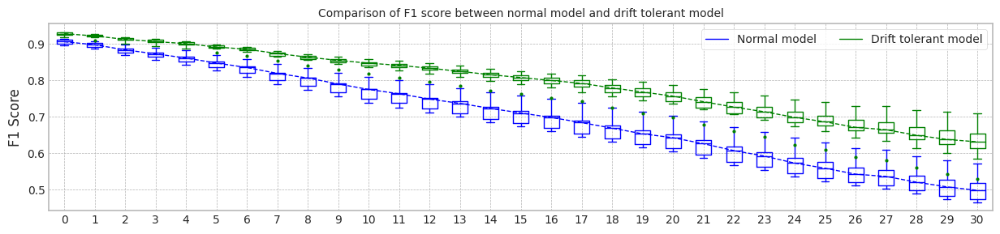

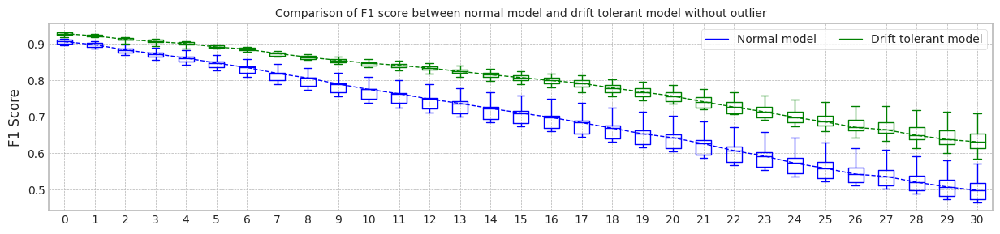

max_mean_trial= 0


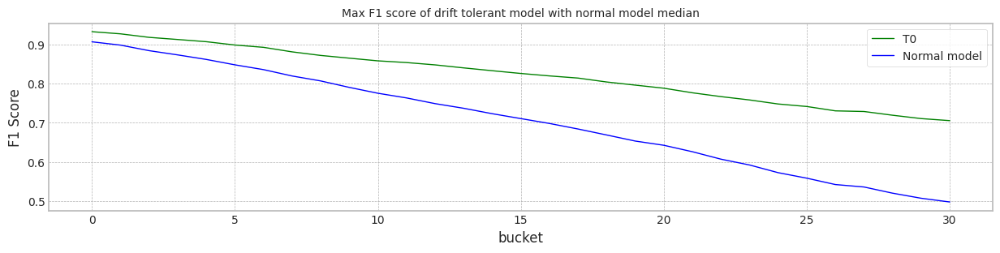

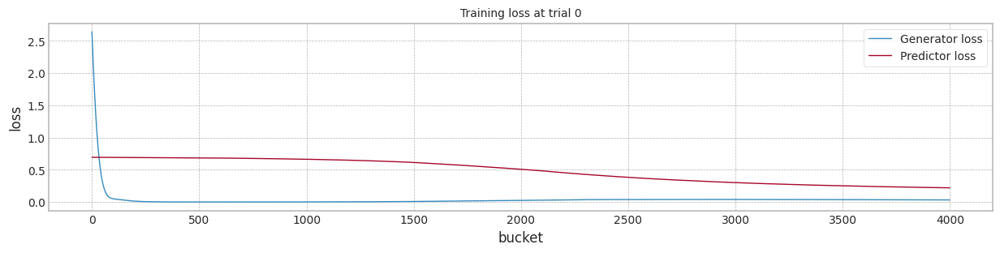

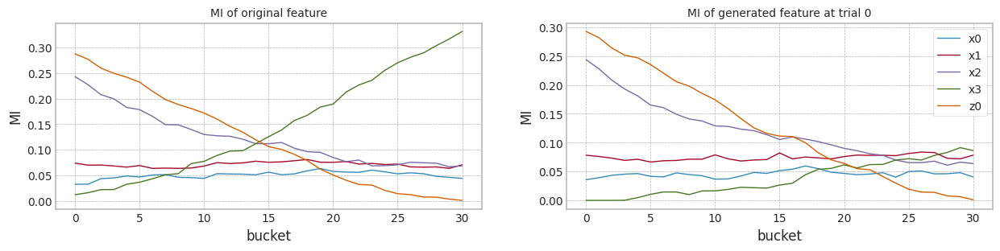

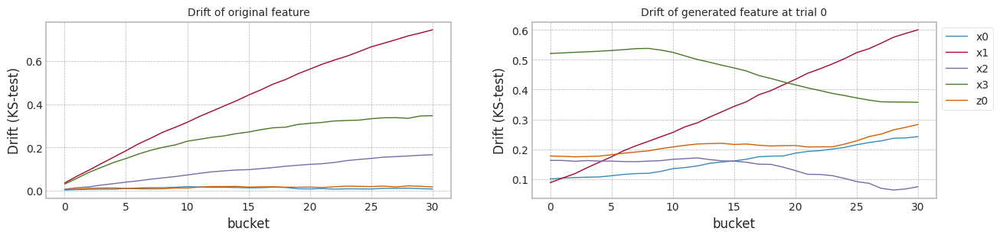

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.910052,0.910052,0.695509,0.485772
1,1.0,0.900426,0.900426,0.679220,0.468137
2,2.0,0.914596,0.914596,0.751882,0.571839
3,3.0,0.912132,0.912132,0.717686,0.534419
4,4.0,0.897105,0.897105,0.675724,0.470208
5,5.0,0.902387,0.902387,0.705155,0.495738
6,6.0,0.902545,0.902545,0.706650,0.499509
7,7.0,0.911817,0.911817,0.708988,0.511062
8,8.0,0.914178,0.914178,0.717646,0.520180
9,9.0,0.896266,0.896266,0.674825,0.465242


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.932078,0.932078,0.821333,0.705163
1,1.0,0.932657,0.932657,0.784650,0.585489
2,2.0,0.925281,0.925281,0.787179,0.621542
3,3.0,0.929434,0.929434,0.801567,0.659549
4,4.0,0.931409,0.931409,0.792810,0.610819
5,5.0,0.923019,0.923019,0.781760,0.624303
6,6.0,0.926493,0.926493,0.817674,0.709919
7,7.0,0.927020,0.927020,0.795557,0.637575
8,8.0,0.931386,0.931386,0.802579,0.639083
9,9.0,0.917529,0.917529,0.747407,0.529911


In [121]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100) #np.max(X1['b'])+1)

## real-world data 의 실험

### Loan data 실험

#### Dataset 준비

##### Data load

In [18]:

if True:
    from google.colab import drive
    drive.mount('/content/drive')

Mounted at /content/drive


In [19]:

df_accepted = pd.read_csv("/content/drive/MyDrive/Drift/accepted_2007_to_2018Q4.csv")

print(df_accepted.shape)

(2260701, 151)


##### Data 정제

In [20]:
# for the sake of simplicity, let's consider only Fully Paid and Charged Off values:
df_accepted = df_accepted[df_accepted.loan_status.isin(['Fully Paid', 'Charged Off'])]
print(df_accepted.shape)

cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(50).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# maybe we can go further, and eliminate columns up to title:
cols_to_drop = df_accepted.isnull().sum().sort_values(ascending=False).head(45).index
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# Remaining columns have missing data points, but they account for less than 0.2% of the total data. Let's remove the rows that are missing those values in those columns with dropna():
df_accepted = df_accepted.dropna()
print(df_accepted.shape)

# These are constant columns. We can drop it either.
cols_to_drop = ['out_prncp', 'out_prncp_inv', 'policy_code']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

# It seems we have many "duplicated" information. Let's drop some columns, based on visual inspection at corr_pairs dataframe:
cols_to_drop = ['fico_range_low', 'funded_amnt_inv', 'funded_amnt', 'total_pymnt_inv', 'total_pymnt', 'installment', 'collection_recovery_fee', 'total_rec_prncp', 'last_fico_range_low']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)

values = df_accepted.loan_status.unique()
encode = [1,0]
d = dict(zip(values, encode))
df_accepted['loan_paid'] = df_accepted['loan_status'].map(d)
df_accepted = df_accepted.drop(columns=['loan_status'])

df_accepted

(1345310, 151)
(1345310, 101)
(1345310, 56)
(1341026, 56)
(1341026, 53)
(1341026, 44)


,id,loan_amnt,term,int_rate,grade,sub_grade,home_ownership,annual_inc,verification_status,issue_d,...,application_type,acc_now_delinq,chargeoff_within_12_mths,delinq_amnt,pub_rec_bankruptcies,tax_liens,hardship_flag,disbursement_method,debt_settlement_flag,loan_paid
0,68407277,3600.0,36 months,13.99,C,C4,MORTGAGE,55000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
1,68355089,24700.0,36 months,11.99,C,C1,MORTGAGE,65000.0,Not Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2,68341763,20000.0,60 months,10.78,B,B4,MORTGAGE,63000.0,Not Verified,Dec-2015,...,Joint App,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
4,68476807,10400.0,60 months,22.45,F,F1,MORTGAGE,104433.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
5,68426831,11950.0,36 months,13.44,C,C3,RENT,34000.0,Source Verified,Dec-2015,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2260688,89905081,18000.0,60 months,9.49,B,B2,OWN,130000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260690,88948836,29400.0,60 months,13.99,C,C3,MORTGAGE,180792.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,1
2260691,89996426,32000.0,60 months,14.49,C,C4,MORTGAGE,157000.0,Source Verified,Oct-2016,...,Individual,0.0,0.0,0.0,0.0,0.0,N,Cash,N,0
2260692,90006534,16000.0,60 months,12.79,C,C1,RENT,150000.0,Not Verified,Oct-2016,...,Individual,0.0,0.0,0.0,3.0,0.0,N,Cash,N,1


In [21]:
# droping constant columns
print(df_accepted.pymnt_plan.value_counts())
print(df_accepted.hardship_flag.value_counts())
cols_to_drop = ['id', 'pymnt_plan', 'hardship_flag']
df_accepted = df_accepted.drop(columns=cols_to_drop)
print(df_accepted.shape)
cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

print(df_accepted.term.value_counts())

# convert term into either a 36 or 60 integer numeric data type

l1 = df_accepted.term.unique()
l2 = [36, 60]
d = dict(zip(l1, l2))

df_accepted['term'] = df_accepted['term'].map(d)

# as grade is part of sub_grade, so let's just drop the grade feature.

df_accepted = df_accepted.drop(columns='grade')

df_accepted = pd.get_dummies(df_accepted, columns = ['sub_grade'], prefix='', prefix_sep='', drop_first=True)

cat_cols = df_accepted.select_dtypes(include=['object']).columns
print(cat_cols)

# for these columns, let's just create dummy variables, concatenate them with the original dataframe and drop original columns.

df_accepted = pd.get_dummies(df_accepted, columns = ['verification_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['application_type'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['initial_list_status'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['purpose'], prefix='', prefix_sep='', drop_first=True)
print(df_accepted.shape)

df_accepted['home_ownership'] = df_accepted.home_ownership.replace('NONE', 'ANY')
df_accepted = pd.get_dummies(df_accepted, columns = ['home_ownership'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=[ 'url', 'last_pymnt_d', 'last_credit_pull_d'])
df_accepted = df_accepted.drop(columns=['zip_code', 'addr_state'])
df_accepted = pd.get_dummies(df_accepted, columns = ['disbursement_method'], prefix='', prefix_sep='', drop_first=True)
df_accepted = pd.get_dummies(df_accepted, columns = ['debt_settlement_flag'], prefix='', prefix_sep='', drop_first=True)
df_accepted = df_accepted.drop(columns=['earliest_cr_line'])
print(df_accepted.shape)


df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jan','01')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Feb','02')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Mar','03')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Apr','04')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('May','05')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jun','06')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Jul','07')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Aug','08')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Sep','09')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Oct','10')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Dec','11')
df_accepted['issue_d'] = df_accepted['issue_d'].str.replace('Nov','12')

def reorder_issue_d(dt):
    a = dt.split('-')
    return a[1]+a[0]

reorder_issue_d('01-2009')

df_accepted['issue_d'] = df_accepted['issue_d'].apply(reorder_issue_d)
df_accepted = df_accepted.sort_values(by='issue_d')
df_accepted.reset_index(drop=True, inplace=True)

df_accepted.info()

n    1341026
Name: pymnt_plan, dtype: int64
N    1341026
Name: hardship_flag, dtype: int64
(1341026, 41)
Index(['term', 'grade', 'sub_grade', 'home_ownership', 'verification_status',
       'issue_d', 'url', 'purpose', 'zip_code', 'addr_state',
       'earliest_cr_line', 'initial_list_status', 'last_pymnt_d',
       'last_credit_pull_d', 'application_type', 'disbursement_method',
       'debt_settlement_flag'],
      dtype='object')
 36 months    1017398
 60 months     323628
Name: term, dtype: int64
Index(['home_ownership', 'verification_status', 'issue_d', 'url', 'purpose',
       'zip_code', 'addr_state', 'earliest_cr_line', 'initial_list_status',
       'last_pymnt_d', 'last_credit_pull_d', 'application_type',
       'disbursement_method', 'debt_settlement_flag'],
      dtype='object')
(1341026, 86)
(1341026, 83)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1341026 entries, 0 to 1341025
Data columns (total 83 columns):
 #   Column                      Non-Null Count    Dtype  

##### Dataset 만들기

In [22]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values

2010
2011
2012
2013
2014
2015
2016
2017
2018


In [23]:

X[2010].shape

(11497, 81)

In [24]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'dti', 'delinq_2yrs',
       'fico_range_high', 'inq_last_6mths', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'total_rec_int', 'total_rec_late_fee',
       'recoveries', 'last_pymnt_amnt', 'last_fico_range_high',
       'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],
      dtype

In [25]:
seed_everything(12)

X_df = pd.DataFrame(X[2010],columns=COLUMNS)
mi_scores = make_mi_scores(X_df, Y[2010], discrete_features="auto")
print(mi_scores)

recoveries                  0.375327
last_fico_range_high        0.090427
last_pymnt_amnt             0.085496
total_rec_late_fee          0.038954
int_rate                    0.016850
                              ...   
F2                          0.000000
chargeoff_within_12_mths    0.000000
G1                          0.000000
G3                          0.000000
D3                          0.000000
Name: MI Scores, Length: 81, dtype: float64


In [191]:
# MI Top 5, columns
top_columns = list(mi_scores[0:5].index)
top_columns

['recoveries',
 'last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate']

+ 일부러 예측 확률을 떨어뜨리기 위해 (조정), "recoveries" feature를 제외 한다.

In [192]:
top_columns = list(mi_scores[2:7].index)
top_columns

['last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate',
 'term',
 'fico_range_high']

In [167]:
top_columns = [
'last_fico_range_high',
'last_pymnt_amnt'] #,
#'total_rec_late_fee',
#'term',
#'DirectPay']

In [181]:
top_columns_index = [list(COLUMNS).index(tc) for tc in top_columns]
top_columns_index

[17, 16, 14, 2, 1]

In [182]:
# 2010년의 data를 기준으로 그 이후의 data 들...
X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
X2 = pd.DataFrame(X2,columns = COLUMNS)[top_columns]
#X2_df_t5 = X2_df[top_columns]

#### 실험

columns: ['C1', 'w', 'OWN', 'major_purchase', 'D2']
MI Analysis MI Max 0.01703, Min 0.00000, Mean 0.00404, Std 0.00658
Dataset structure X_train, (10000, 5) X_test, (10000, 5) X_live (125968, 5)
Truncate 9968 rows from live_set (125968, 5)
Search MI & Drift...for X_live_set (58, 10000, 5)


100%|██████████| 58/58 [00:12<00:00,  4.64it/s]


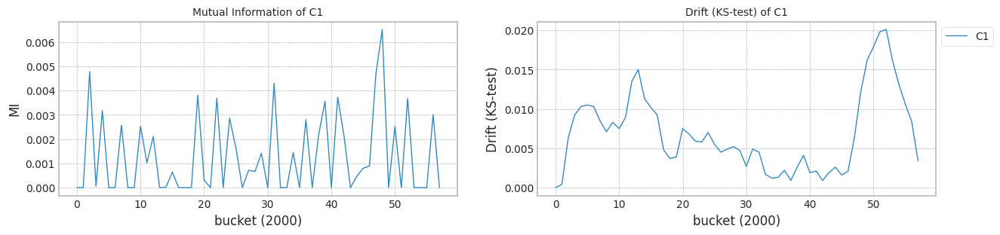

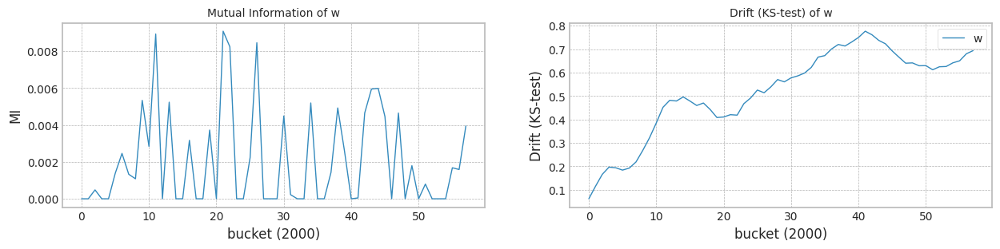

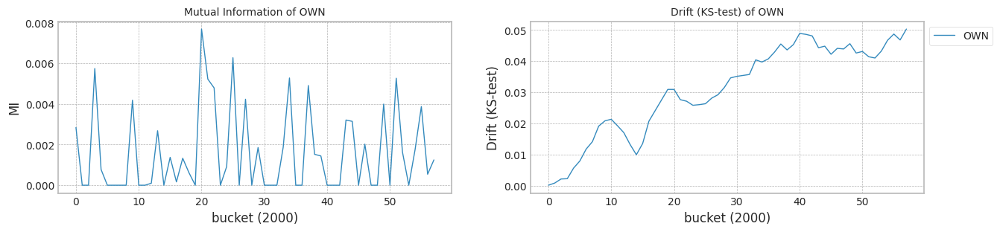

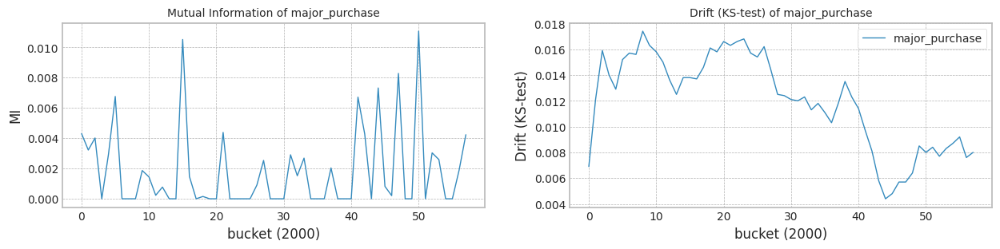

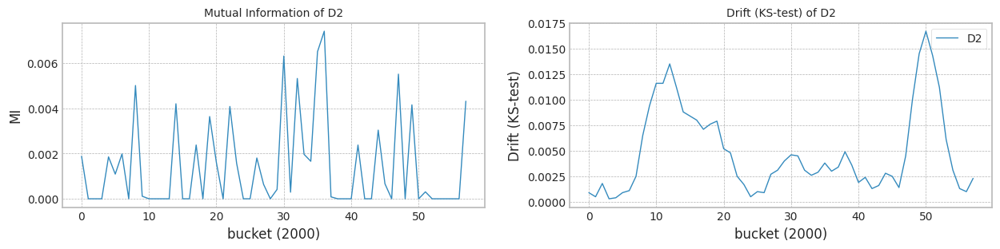

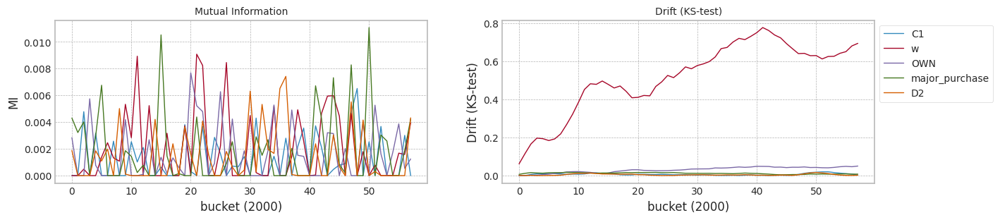

trial_count: 5
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 573.33it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.40it/s]


mean of drift:
C1                0.006898
w                 0.519750
OWN               0.030817
major_purchase    0.011974
D2                0.004857
dtype: float64
Mean F1 for all data: 0.8871817463899765
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 195.94it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.58it/s]


mean of drift:
C1                0.910960
w                 0.910190
OWN               0.880702
major_purchase    0.941572
D2                0.935960
dtype: float64
Mean F1 for all data: 0.8871817463899765
Normal model mean        : 0.8871817463899765
Drift tolerant model mean: 0.8871817463899765
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 583.12it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.40it/s]


mean of drift:
C1                0.006898
w                 0.519750
OWN               0.030817
major_purchase    0.011974
D2                0.004857
dtype: float64
Mean F1 for all data: 0.8871817463899765
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 195.48it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.62it/s]


mean of drift:
C1                0.929836
w                 0.619081
OWN               0.856376
major_purchase    0.971371
D2                0.947772
dtype: float64
Mean F1 for all data: 0.8871817463899765
Normal model mean        : 0.8871817463899765
Drift tolerant model mean: 0.8871817463899765
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 572.29it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.40it/s]


mean of drift:
C1                0.006898
w                 0.519750
OWN               0.030817
major_purchase    0.011974
D2                0.004857
dtype: float64
Mean F1 for all data: 0.8871817463899765
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 196.23it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.67it/s]


mean of drift:
C1                0.915700
w                 0.880912
OWN               0.901055
major_purchase    0.973050
D2                0.947757
dtype: float64
Mean F1 for all data: 0.8871817463899765
Normal model mean        : 0.8871817463899765
Drift tolerant model mean: 0.8871817463899765
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 572.26it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.44it/s]


mean of drift:
C1                0.006898
w                 0.519750
OWN               0.030817
major_purchase    0.011974
D2                0.004857
dtype: float64
Mean F1 for all data: 0.8871817463899765
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 197.62it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.66it/s]


mean of drift:
C1                0.912183
w                 0.848717
OWN               0.917010
major_purchase    0.959397
D2                0.961883
dtype: float64
Mean F1 for all data: 0.8871817463899765
Normal model mean        : 0.8871817463899765
Drift tolerant model mean: 0.8871817463899765
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 577.16it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.47it/s]


mean of drift:
C1                0.006898
w                 0.519750
OWN               0.030817
major_purchase    0.011974
D2                0.004857
dtype: float64
Mean F1 for all data: 0.8871817463899765
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 196.95it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.65it/s]


mean of drift:
C1                0.912007
w                 0.760278
OWN               0.901019
major_purchase    0.942367
D2                0.961883
dtype: float64
Mean F1 for all data: 0.8871817463899765
Normal model mean        : 0.8871817463899765
Drift tolerant model mean: 0.8871817463899765


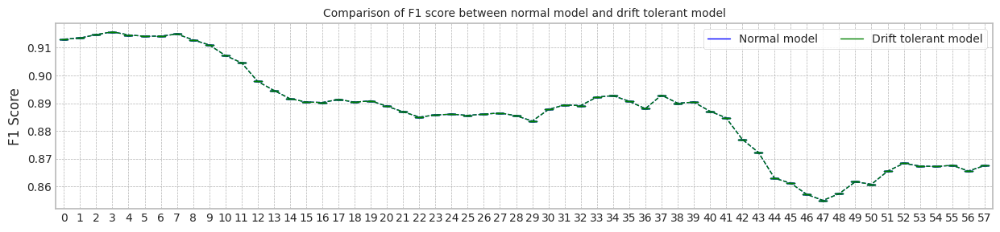

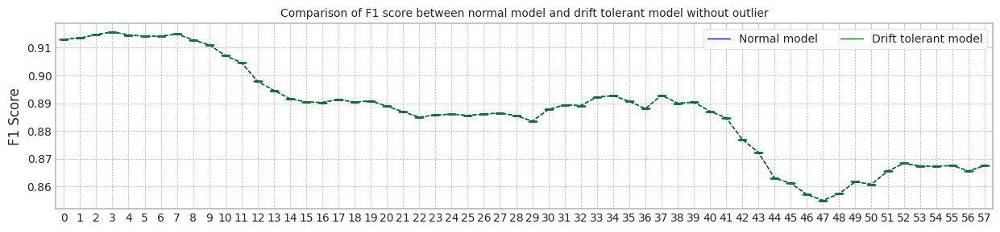

max_mean_trial= 0


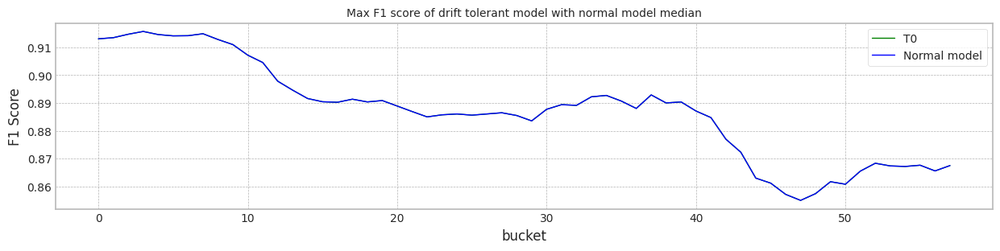

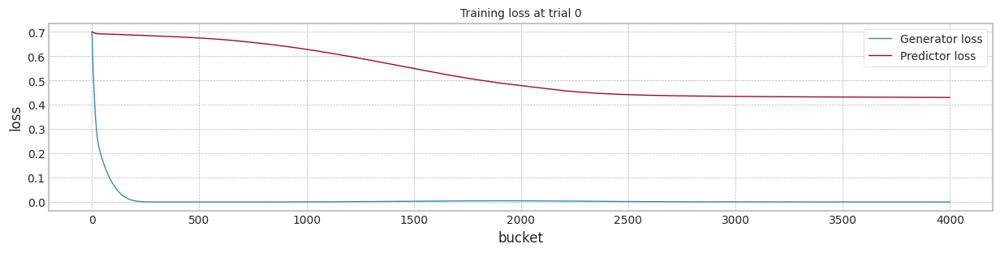

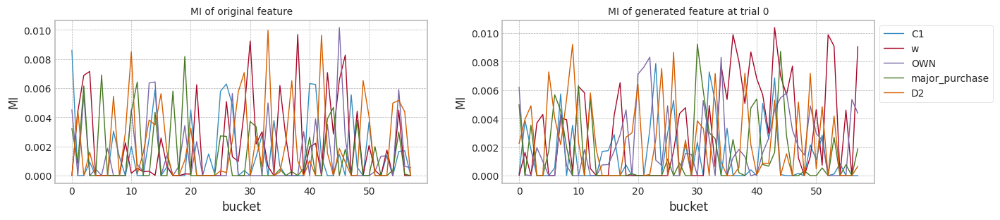

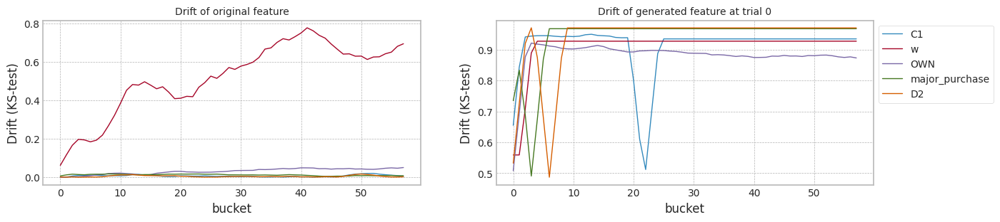

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,9.130435e-01,9.130435e-01,0.887182,0.867497
1,1.0,9.130435e-01,9.130435e-01,0.887182,0.867497
2,2.0,9.130435e-01,9.130435e-01,0.887182,0.867497
3,3.0,9.130435e-01,9.130435e-01,0.887182,0.867497
4,4.0,9.130435e-01,9.130435e-01,0.887182,0.867497
5,mean,9.130435e-01,9.130435e-01,0.887182,0.867497
6,sem,5.551115e-17,5.551115e-17,0.000000,0.000000


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,9.130435e-01,9.130435e-01,0.887182,0.867497
1,1.0,9.130435e-01,9.130435e-01,0.887182,0.867497
2,2.0,9.130435e-01,9.130435e-01,0.887182,0.867497
3,3.0,9.130435e-01,9.130435e-01,0.887182,0.867497
4,4.0,9.130435e-01,9.130435e-01,0.887182,0.867497
5,mean,9.130435e-01,9.130435e-01,0.887182,0.867497
6,sem,5.551115e-17,5.551115e-17,0.000000,0.000000


columns: ['E5', 'annual_inc', 'RENT', 'revol_bal', 'C3']
MI Analysis MI Max 0.01126, Min 0.00043, Mean 0.00360, Std 0.00394
Dataset structure X_train, (10000, 5) X_test, (10000, 5) X_live (125968, 5)
Truncate 9968 rows from live_set (125968, 5)
Search MI & Drift...for X_live_set (58, 10000, 5)


100%|██████████| 58/58 [00:12<00:00,  4.50it/s]


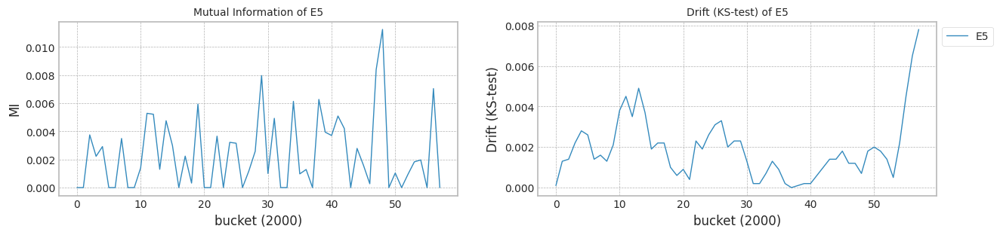

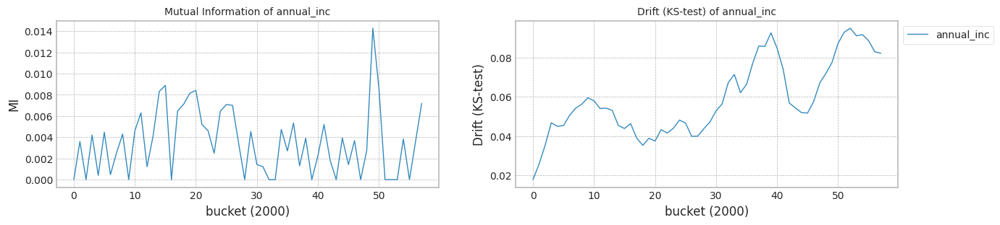

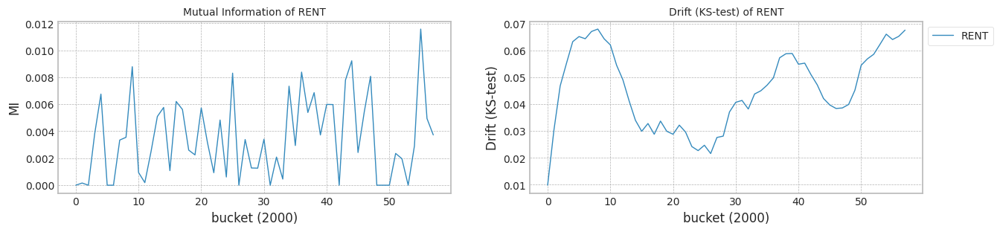

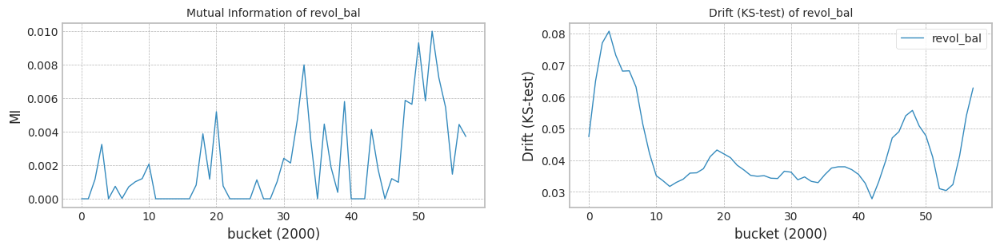

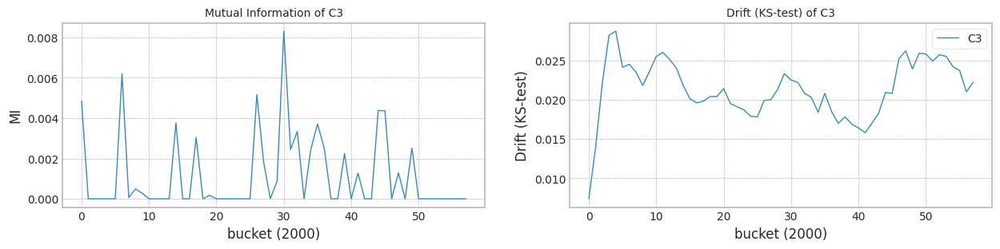

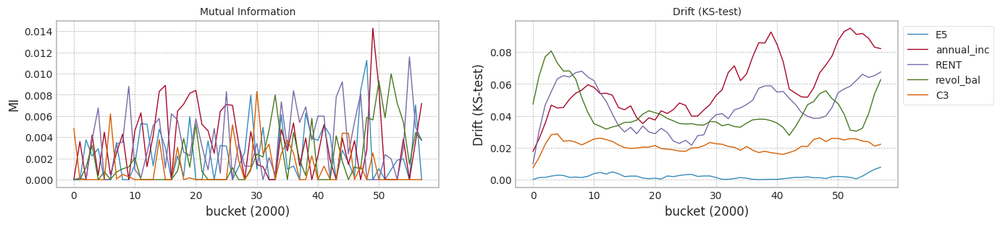

trial_count: 5
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 560.99it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.41it/s]


mean of drift:
E5            0.001884
annual_inc    0.083948
RENT          0.045445
revol_bal     0.042912
C3            0.021345
dtype: float64
Mean F1 for all data: 0.8871817463899765
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 192.83it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.49it/s]


mean of drift:
E5            0.982666
annual_inc    0.958260
RENT          0.573836
revol_bal     0.945295
C3            0.928652
dtype: float64
Mean F1 for all data: 0.8871817463899765
Normal model mean        : 0.8871817463899765
Drift tolerant model mean: 0.8871817463899765
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 570.93it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.42it/s]


mean of drift:
E5            0.001884
annual_inc    0.083948
RENT          0.045445
revol_bal     0.042912
C3            0.021345
dtype: float64
Mean F1 for all data: 0.8871817463899765
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 193.65it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.51it/s]


mean of drift:
E5            0.982666
annual_inc    0.957886
RENT          0.556410
revol_bal     0.208836
C3            0.957276
dtype: float64
Mean F1 for all data: 0.8871817463899765
Normal model mean        : 0.8871817463899765
Drift tolerant model mean: 0.8871817463899765
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 567.04it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.28it/s]


mean of drift:
E5            0.001884
annual_inc    0.083948
RENT          0.045445
revol_bal     0.042912
C3            0.021345
dtype: float64
Mean F1 for all data: 0.8871817463899765
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 194.35it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.52it/s]


mean of drift:
E5            0.982666
annual_inc    0.958262
RENT          0.552138
revol_bal     0.890386
C3            0.958959
dtype: float64
Mean F1 for all data: 0.8871817463899765
Normal model mean        : 0.8871817463899765
Drift tolerant model mean: 0.8871817463899765
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 574.09it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.38it/s]


mean of drift:
E5            0.001884
annual_inc    0.083948
RENT          0.045445
revol_bal     0.042912
C3            0.021345
dtype: float64
Mean F1 for all data: 0.8871817463899765
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 195.54it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.51it/s]


mean of drift:
E5            0.984362
annual_inc    0.932841
RENT          0.563669
revol_bal     0.913595
C3            0.958959
dtype: float64
Mean F1 for all data: 0.8871817463899765
Normal model mean        : 0.8871817463899765
Drift tolerant model mean: 0.8871817463899765
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 579.04it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.43it/s]


mean of drift:
E5            0.001884
annual_inc    0.083948
RENT          0.045445
revol_bal     0.042912
C3            0.021345
dtype: float64
Mean F1 for all data: 0.8871817463899765
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 195.38it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.60it/s]


mean of drift:
E5            0.984362
annual_inc    0.949555
RENT          0.568529
revol_bal     0.939678
C3            0.953938
dtype: float64
Mean F1 for all data: 0.8871817463899765
Normal model mean        : 0.8871817463899765
Drift tolerant model mean: 0.8871817463899765


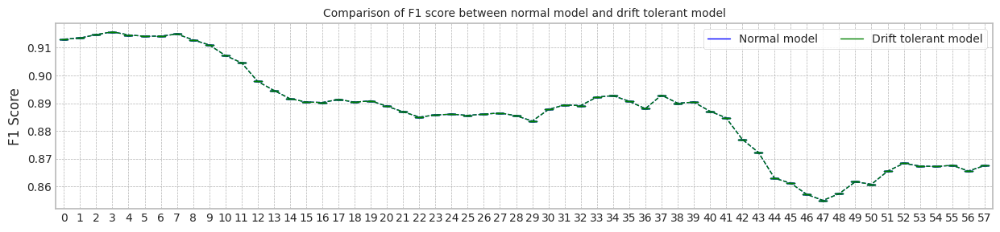

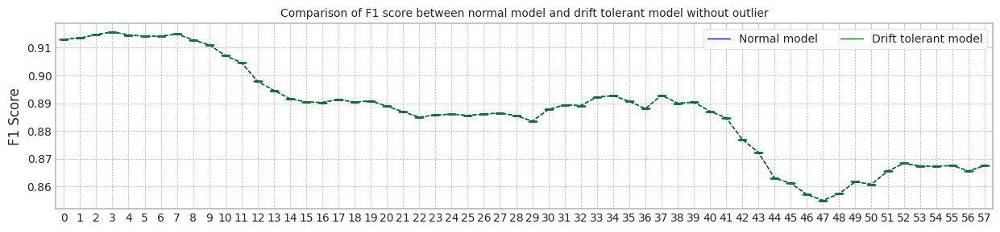

max_mean_trial= 0


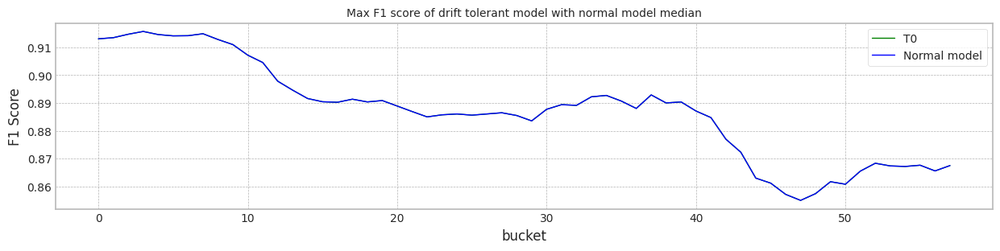

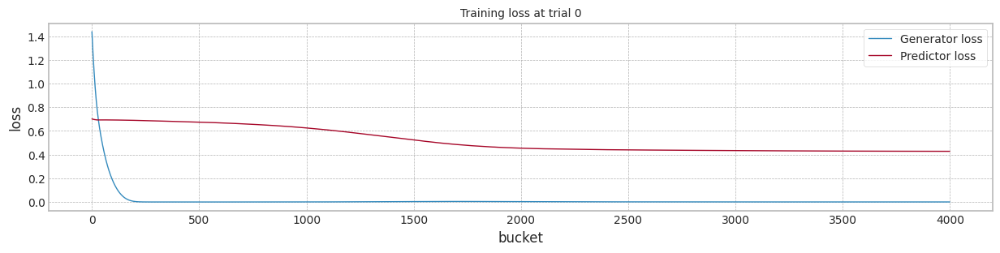

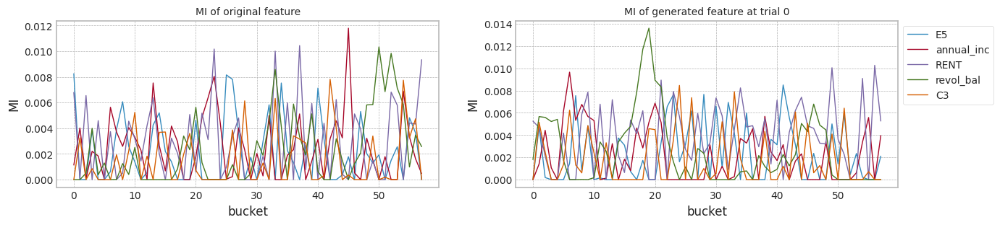

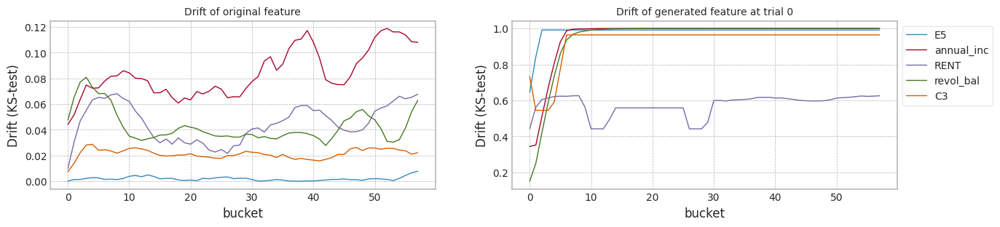

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,9.130435e-01,9.130435e-01,0.887182,0.867497
1,1.0,9.130435e-01,9.130435e-01,0.887182,0.867497
2,2.0,9.130435e-01,9.130435e-01,0.887182,0.867497
3,3.0,9.130435e-01,9.130435e-01,0.887182,0.867497
4,4.0,9.130435e-01,9.130435e-01,0.887182,0.867497
5,mean,9.130435e-01,9.130435e-01,0.887182,0.867497
6,sem,5.551115e-17,5.551115e-17,0.000000,0.000000


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,9.130435e-01,9.130435e-01,0.887182,0.867497
1,1.0,9.130435e-01,9.130435e-01,0.887182,0.867497
2,2.0,9.130435e-01,9.130435e-01,0.887182,0.867497
3,3.0,9.130435e-01,9.130435e-01,0.887182,0.867497
4,4.0,9.130435e-01,9.130435e-01,0.887182,0.867497
5,mean,9.130435e-01,9.130435e-01,0.887182,0.867497
6,sem,5.551115e-17,5.551115e-17,0.000000,0.000000


columns: ['E5', 'annual_inc', 'RENT', 'revol_bal', 'C3']
MI Analysis MI Max 0.01126, Min 0.00043, Mean 0.00360, Std 0.00394
Dataset structure X_train, (10000, 5) X_test, (10000, 5) X_live (125968, 5)
Truncate 9968 rows from live_set (125968, 5)
Search MI & Drift...for X_live_set (58, 10000, 5)


100%|██████████| 58/58 [00:12<00:00,  4.50it/s]


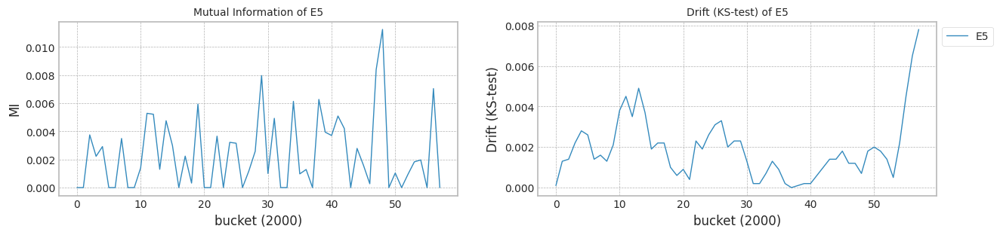

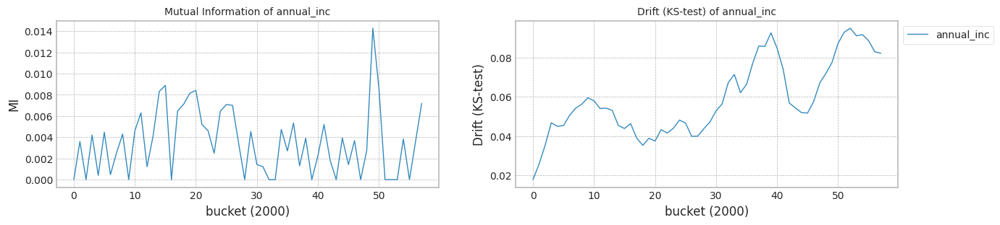

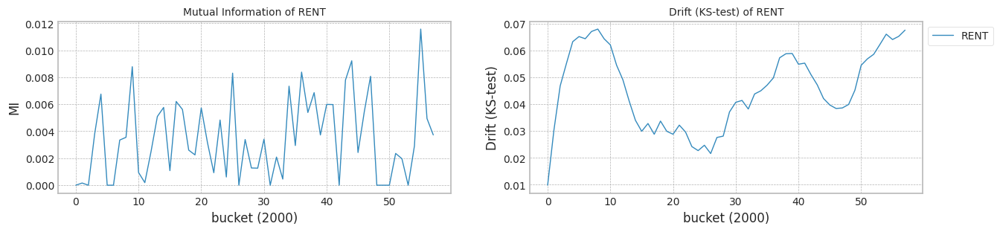

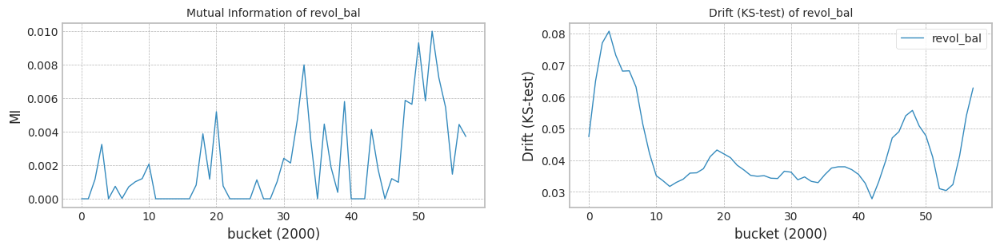

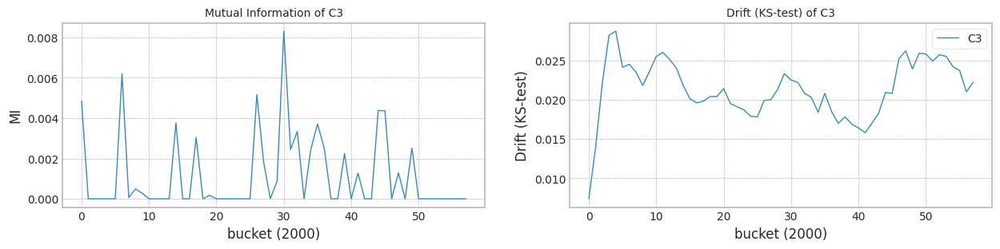

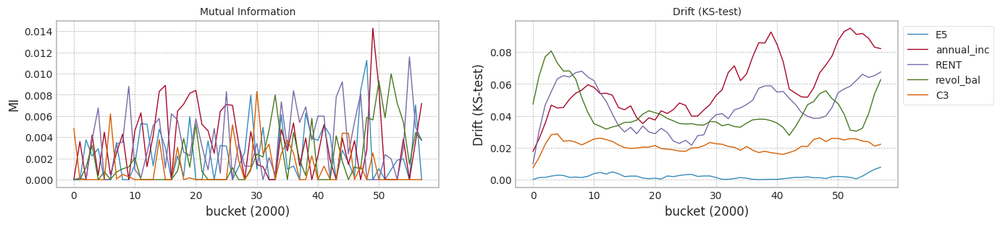

trial_count: 5
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 565.37it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.39it/s]


mean of drift:
E5            0.001884
annual_inc    0.083948
RENT          0.045445
revol_bal     0.042912
C3            0.021345
dtype: float64
Mean F1 for all data: 0.8871817463899765
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 196.37it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.58it/s]


mean of drift:
E5            0.982666
annual_inc    0.958260
RENT          0.573836
revol_bal     0.945295
C3            0.928652
dtype: float64
Mean F1 for all data: 0.8871817463899765
Normal model mean        : 0.8871817463899765
Drift tolerant model mean: 0.8871817463899765
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 564.38it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.40it/s]


mean of drift:
E5            0.001884
annual_inc    0.083948
RENT          0.045445
revol_bal     0.042912
C3            0.021345
dtype: float64
Mean F1 for all data: 0.8871817463899765
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:20<00:00, 195.51it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.46it/s]


mean of drift:
E5            0.982666
annual_inc    0.957886
RENT          0.556410
revol_bal     0.208836
C3            0.957276
dtype: float64
Mean F1 for all data: 0.8871817463899765
Normal model mean        : 0.8871817463899765
Drift tolerant model mean: 0.8871817463899765
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 571.88it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


  9%|▊         | 5/58 [00:01<00:14,  3.72it/s]


KeyboardInterrupt: ignored

In [199]:
for iz in range(10):
    print("=" * 50)
    s = np.sort(np.random.choice(len(COLUMNS),5,replace= False))
    top_columns = list(mi_scores[s].index)
    print('columns:',top_columns)
    X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
    Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
    X2 = pd.DataFrame(X2,columns = COLUMNS)[top_columns]
    # 1/10 로 사이즈 줄이기...
    seed_everything()

    s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
    #print(s.shape)
    X3 = pd.DataFrame(X2.values[s],columns=top_columns)
    Y3 = Y2[s]

    train_size = 10000
    test_size = 2000

    X1,Y1 = check_mi_drift(X3, Y3, train_size, test_size)

    bucket_size = 500
    X1['b'] = [int(b/bucket_size) for b in X1.index.values]
    _,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 300)

In [144]:
X2.shape

(1279680, 2)

In [183]:
# 1/10 로 사이즈 줄이기...
seed_everything()

s = np.sort(np.random.choice(X2.shape[0],int(X2.shape[0]/10),replace= False))
print(s.shape)
X3 = pd.DataFrame(X2.values[s],columns=top_columns)
Y3 = Y2[s]

(127968,)


In [146]:
X3.shape

(127968, 2)

In [147]:
Y3.shape

(127968,)

MI Analysis MI Max 0.27289, Min 0.02023, Mean 0.12253, Std 0.11713
Dataset structure X_train, (10000, 5) X_test, (10000, 5) X_live (125968, 5)
Truncate 9968 rows from live_set (125968, 5)
Search MI & Drift...for X_live_set (58, 10000, 5)


100%|██████████| 58/58 [00:12<00:00,  4.65it/s]


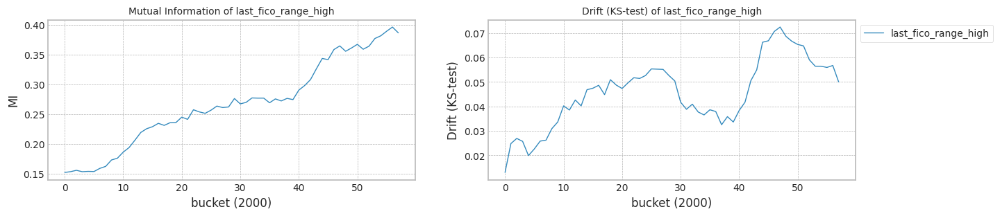

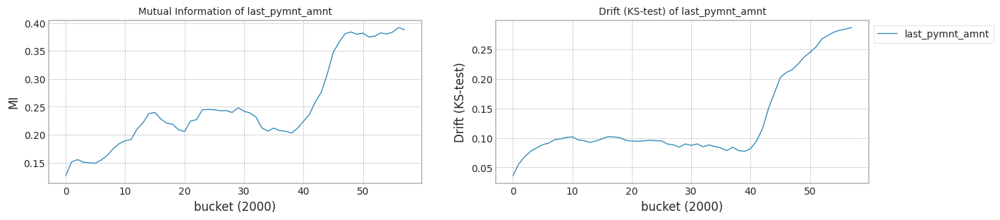

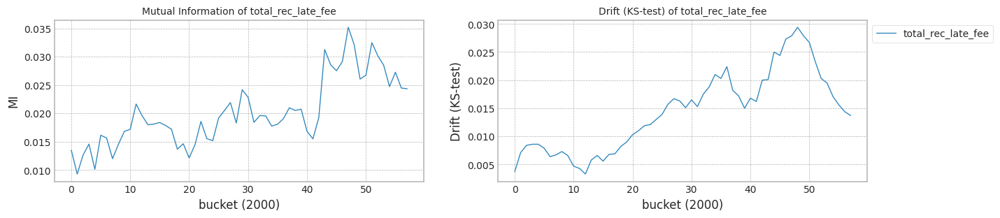

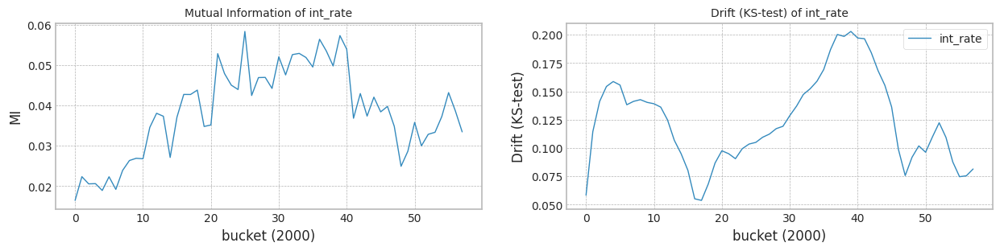

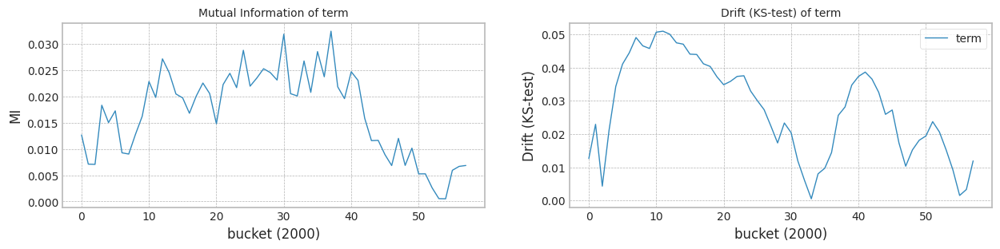

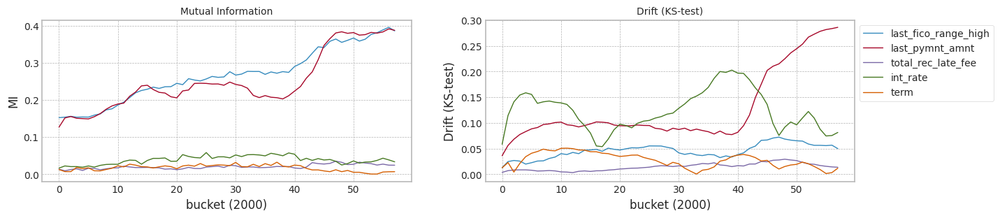

In [188]:
train_size = 10000
test_size = 2000

X1,Y1 = check_mi_drift(X3, Y3, train_size, test_size)

In [189]:
bucket_size = 500
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,last_fico_range_high,last_pymnt_amnt,total_rec_late_fee,int_rate,term,b
0,0.887059,0.000164,0.000000,0.180791,0.0,0
1,0.869412,0.000698,0.000000,0.436569,0.0,0
2,0.904706,0.023880,0.000000,0.365177,0.0,0
3,0.845882,0.005163,0.000000,0.436569,0.0,0
4,0.951765,0.008043,0.000000,0.162815,0.0,0
...,...,...,...,...,...,...
127963,0.622353,0.007015,0.000000,0.099127,0.0,255
127964,0.857647,0.752235,0.194747,1.300976,1.0,255
127965,0.875294,0.062622,0.000000,0.256805,0.0,255
127966,0.681176,0.017759,0.000000,0.419620,0.0,255


trial_count: 10
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 611.47it/s]


Test f1 score: 0.9253731343283582
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.60it/s]


mean of drift:
last_fico_range_high    0.066395
last_pymnt_amnt         0.127748
total_rec_late_fee      0.019981
int_rate                0.129124
term                    0.027514
dtype: float64
Mean F1 for all data: 0.9126000848276783
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 229.90it/s]


Test f1 score: 0.928312007599039
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.68it/s]


mean of drift:
last_fico_range_high    0.275014
last_pymnt_amnt         0.543771
total_rec_late_fee      0.975903
int_rate                0.154384
term                    0.772000
dtype: float64
Mean F1 for all data: 0.9489987931153002
Normal model mean        : 0.9126000848276783
Drift tolerant model mean: 0.9489987931153002
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 617.81it/s]


Test f1 score: 0.9239818000221952
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.49it/s]


mean of drift:
last_fico_range_high    0.066395
last_pymnt_amnt         0.127748
total_rec_late_fee      0.019981
int_rate                0.129124
term                    0.027514
dtype: float64
Mean F1 for all data: 0.9088856725385777
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 228.59it/s]


Test f1 score: 0.9275023646580982
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.74it/s]


mean of drift:
last_fico_range_high    0.410774
last_pymnt_amnt         0.492081
total_rec_late_fee      0.974176
int_rate                0.136717
term                    0.755041
dtype: float64
Mean F1 for all data: 0.8906809324137948
Normal model mean        : 0.910742878683128
Drift tolerant model mean: 0.9198398627645474
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 632.76it/s]


Test f1 score: 0.9230088495575219
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.63it/s]


mean of drift:
last_fico_range_high    0.066395
last_pymnt_amnt         0.127748
total_rec_late_fee      0.019981
int_rate                0.129124
term                    0.027514
dtype: float64
Mean F1 for all data: 0.9072110671251651
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:17<00:00, 232.90it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.83it/s]


mean of drift:
last_fico_range_high    0.217050
last_pymnt_amnt         0.493628
total_rec_late_fee      0.972353
int_rate                0.145943
term                    0.739119
dtype: float64
Mean F1 for all data: 0.8871817463899765
Normal model mean        : 0.909565608163807
Drift tolerant model mean: 0.9089538239730238
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 645.84it/s]


Test f1 score: 0.9208395306560899
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.67it/s]


mean of drift:
last_fico_range_high    0.066395
last_pymnt_amnt         0.127748
total_rec_late_fee      0.019981
int_rate                0.129124
term                    0.027514
dtype: float64
Mean F1 for all data: 0.9025750648402041
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 214.73it/s]


Test f1 score: 0.934019439679817
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.54it/s]


mean of drift:
last_fico_range_high    0.248131
last_pymnt_amnt         0.478862
total_rec_late_fee      0.973834
int_rate                0.147941
term                    0.772000
dtype: float64
Mean F1 for all data: 0.8925341878073341
Normal model mean        : 0.9078179723329063
Drift tolerant model mean: 0.9048489149316014
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 614.14it/s]


Test f1 score: 0.9144352947592301
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.43it/s]


mean of drift:
last_fico_range_high    0.066395
last_pymnt_amnt         0.127748
total_rec_late_fee      0.019981
int_rate                0.129124
term                    0.027514
dtype: float64
Mean F1 for all data: 0.8906278093797508
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 215.72it/s]


Test f1 score: 0.9286272757734837
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.64it/s]


mean of drift:
last_fico_range_high    0.341902
last_pymnt_amnt         0.536666
total_rec_late_fee      0.972986
int_rate                0.134622
term                    0.772000
dtype: float64
Mean F1 for all data: 0.9153244036413413
Normal model mean        : 0.9043799397422753
Drift tolerant model mean: 0.9069440126735493
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 612.14it/s]


Test f1 score: 0.9191503375596904
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.49it/s]


mean of drift:
last_fico_range_high    0.066395
last_pymnt_amnt         0.127748
total_rec_late_fee      0.019981
int_rate                0.129124
term                    0.027514
dtype: float64
Mean F1 for all data: 0.8987026035636825
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 215.32it/s]


Test f1 score: 0.9338243626062324
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.56it/s]


mean of drift:
last_fico_range_high    0.192290
last_pymnt_amnt         0.829107
total_rec_late_fee      0.974916
int_rate                0.129481
term                    0.761481
dtype: float64
Mean F1 for all data: 0.8893363797064175
Normal model mean        : 0.9034337170458432
Drift tolerant model mean: 0.9040094071790273
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 610.77it/s]


Test f1 score: 0.9239966786603931
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.44it/s]


mean of drift:
last_fico_range_high    0.066395
last_pymnt_amnt         0.127748
total_rec_late_fee      0.019981
int_rate                0.129124
term                    0.027514
dtype: float64
Mean F1 for all data: 0.9083749136732955
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 214.56it/s]


Test f1 score: 0.9352460421786593
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.50it/s]


mean of drift:
last_fico_range_high    0.480052
last_pymnt_amnt         0.654802
total_rec_late_fee      0.975188
int_rate                0.214881
term                    0.772000
dtype: float64
Mean F1 for all data: 0.8990386786048222
Normal model mean        : 0.9041396022783363
Drift tolerant model mean: 0.903299303096998
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 583.81it/s]


Test f1 score: 0.9217073979873935
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.42it/s]


mean of drift:
last_fico_range_high    0.066395
last_pymnt_amnt         0.127748
total_rec_late_fee      0.019981
int_rate                0.129124
term                    0.027514
dtype: float64
Mean F1 for all data: 0.9032275729303241
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 213.96it/s]


Test f1 score: 0.9275894695831246
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.55it/s]


mean of drift:
last_fico_range_high    0.216657
last_pymnt_amnt         0.525657
total_rec_late_fee      0.971529
int_rate                0.143971
term                    0.772000
dtype: float64
Mean F1 for all data: 0.8919451418604608
Normal model mean        : 0.9040255986098348
Drift tolerant model mean: 0.9018800329424309
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 608.04it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.42it/s]


mean of drift:
last_fico_range_high    0.066395
last_pymnt_amnt         0.127748
total_rec_late_fee      0.019981
int_rate                0.129124
term                    0.027514
dtype: float64
Mean F1 for all data: 0.8871817463899765
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 212.86it/s]


Test f1 score: 0.9345794392523364
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.52it/s]


mean of drift:
last_fico_range_high    0.274469
last_pymnt_amnt         0.581155
total_rec_late_fee      0.976283
int_rate                0.213091
term                    0.746626
dtype: float64
Mean F1 for all data: 0.8899742417582529
Normal model mean        : 0.902154059474295
Drift tolerant model mean: 0.9005571672552999
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:06<00:00, 603.18it/s]


Test f1 score: 0.9183617522890509
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:13<00:00,  4.40it/s]


mean of drift:
last_fico_range_high    0.066395
last_pymnt_amnt         0.127748
total_rec_late_fee      0.019981
int_rate                0.129124
term                    0.027514
dtype: float64
Mean F1 for all data: 0.8969947844148186
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:18<00:00, 217.33it/s]


Test f1 score: 0.9130434782608696
X_live.shape (125968, 6)
Truncate 9968 rows from live_set (125968, 6)
Search MI & Drift...for X_live_set torch.Size([58, 10000, 6])


100%|██████████| 58/58 [00:12<00:00,  4.54it/s]


mean of drift:
last_fico_range_high    0.078191
last_pymnt_amnt         0.309491
total_rec_late_fee      0.953324
int_rate                0.130900
term                    0.756719
dtype: float64
Mean F1 for all data: 0.8871817463899765
Normal model mean        : 0.9016381319683473
Drift tolerant model mean: 0.8992196251687676


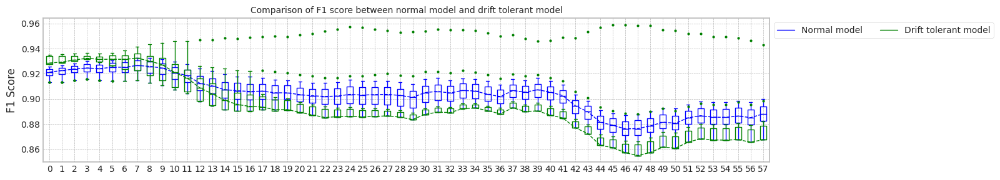

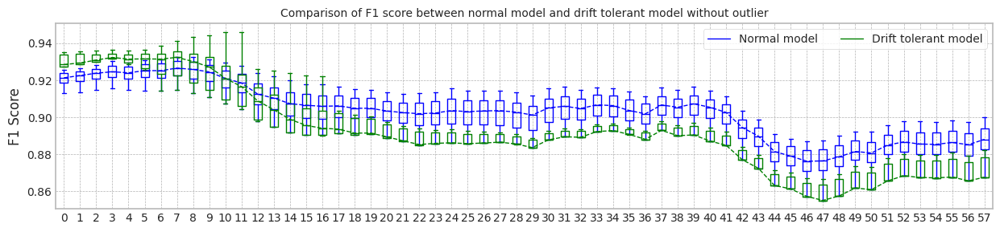

max_mean_trial= 0


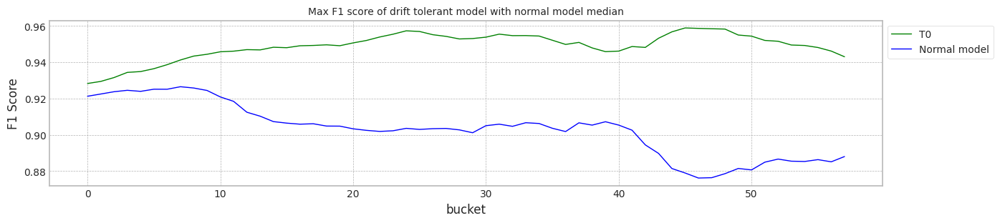

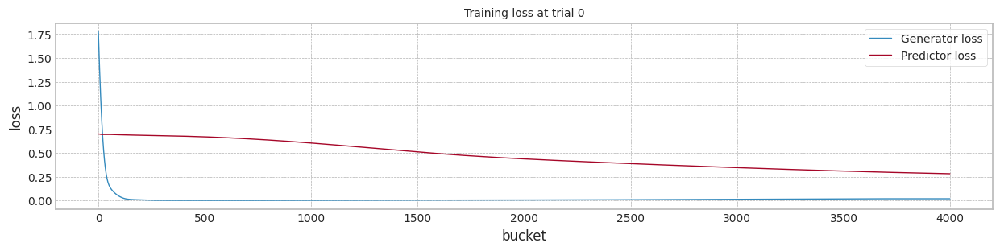

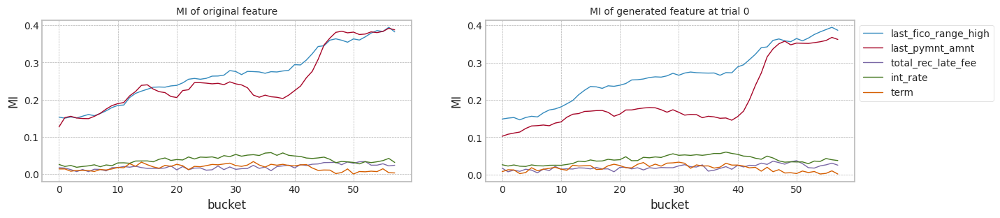

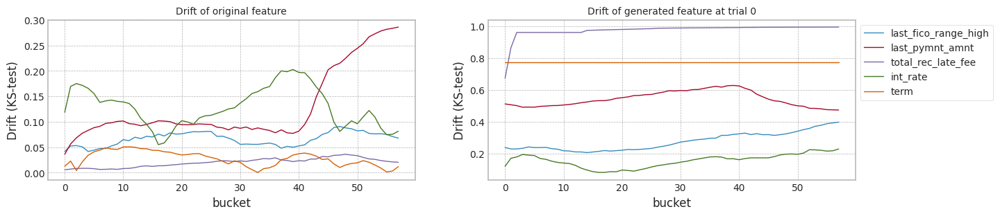

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.925373,0.925373,0.912600,0.899959
1,1.0,0.923982,0.923982,0.908886,0.895102
2,2.0,0.923009,0.923009,0.907211,0.893450
3,3.0,0.920840,0.920840,0.902575,0.887921
4,4.0,0.914435,0.914435,0.890628,0.874693
5,5.0,0.919150,0.919150,0.898703,0.883025
6,6.0,0.923997,0.923997,0.908375,0.894065
7,7.0,0.921707,0.921707,0.903228,0.888099
8,8.0,0.913043,0.913043,0.887182,0.867497
9,9.0,0.918362,0.918362,0.896995,0.882285


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.928312,0.928312,0.948999,0.943064
1,1.0,0.927502,0.927502,0.890681,0.867497
2,2.0,0.913043,0.913043,0.887182,0.867497
3,3.0,0.934019,0.934019,0.892534,0.867497
4,4.0,0.928627,0.928627,0.915324,0.898263
5,5.0,0.933824,0.933824,0.889336,0.867497
6,6.0,0.935246,0.935246,0.899039,0.881980
7,7.0,0.927589,0.927589,0.891945,0.867497
8,8.0,0.934579,0.934579,0.889974,0.867497
9,9.0,0.913043,0.913043,0.887182,0.867497


In [190]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 300) #np.max(X1['b'])+1)


### #2 날짜 단위로 bucket 만들기

#### data 정제

In [30]:
X = {}
Y = {}

df = df_accepted[df_accepted['issue_d'].str.startswith('2007') + df_accepted['issue_d'].str.startswith('2008') + df_accepted['issue_d'].str.startswith('2009')].copy()
#df = df.drop(columns=['issue_d'])


X[2009] = df.loc[:, df.columns != 'loan_paid'].values
Y[2009] = df.loan_paid.values


for year in range(2010,2019):
    print(year)
    df = df_accepted[df_accepted['issue_d'].str.startswith(str(year))].copy()
    #df = df.drop(columns=['issue_d'])
    X[year] = df.loc[:, df.columns != 'loan_paid'].values
    Y[year] = df.loan_paid.values


2010
2011
2012
2013
2014
2015
2016
2017
2018


In [31]:
COLUMNS = df.loc[:, df.columns != 'loan_paid'].columns
COLUMNS

Index(['loan_amnt', 'term', 'int_rate', 'annual_inc', 'issue_d', 'dti',
       'delinq_2yrs', 'fico_range_high', 'inq_last_6mths', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'last_pymnt_amnt',
       'last_fico_range_high', 'collections_12_mths_ex_med', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_liens', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1',
       'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3',
       'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5',
       'Source Verified', 'Verified', 'Joint App', 'w', 'credit_card',
       'debt_consolidation', 'educational', 'home_improvement', 'house',
       'major_purchase', 'medical', 'moving', 'other', 'renewable_energy',
       'small_business', 'vacation', 'wedding', 'MORTGAGE', 'OTHER', 'OWN',
       'RENT', 'DirectPay', 'Y'],


In [32]:
X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
X2 = pd.DataFrame(X2,columns = list(COLUMNS))[top_columns+['issue_d']]

In [33]:
X2

,last_fico_range_high,last_pymnt_amnt,total_rec_late_fee,term,DirectPay,issue_d
0,784.0,834.5,0.0,36,0,201001
1,729.0,264.86,0.0,36,0,201001
2,614.0,9672.45,0.0,36,0,201001
3,734.0,551.28,0.0,36,0,201001
4,804.0,697.95,0.0,36,0,201001
...,...,...,...,...,...,...
1279675,774.0,6.84,15.0,36,0,201712
1279676,724.0,10244.35,0.0,36,0,201712
1279677,764.0,8489.54,0.0,36,0,201712
1279678,779.0,24656.42,0.0,36,0,201712


In [34]:
from datetime import date
from datetime import datetime

def date_bucket_num(d,start_day='20100101'):
    date1 = datetime.strptime(start_day, '%Y%m%d')
    date2 = datetime.strptime(str(d)+'01', '%Y%m%d')
    delta = date2 - date1
    return int(delta.days/30)

In [35]:
X2['b'] = [date_bucket_num(d) for d in X2['issue_d']]

In [36]:
X2 = X2.drop(columns=['issue_d'])

In [37]:
X2

,last_fico_range_high,last_pymnt_amnt,total_rec_late_fee,term,DirectPay,b
0,784.0,834.5,0.0,36,0,0
1,729.0,264.86,0.0,36,0,0
2,614.0,9672.45,0.0,36,0,0
3,734.0,551.28,0.0,36,0,0
4,804.0,697.95,0.0,36,0,0
...,...,...,...,...,...,...
1279675,774.0,6.84,15.0,36,0,96
1279676,724.0,10244.35,0.0,36,0,96
1279677,764.0,8489.54,0.0,36,0,96
1279678,779.0,24656.42,0.0,36,0,96


In [43]:
b_cnt = X2.groupby(['b'])['b'].count()

<BarContainer object of 95 artists>

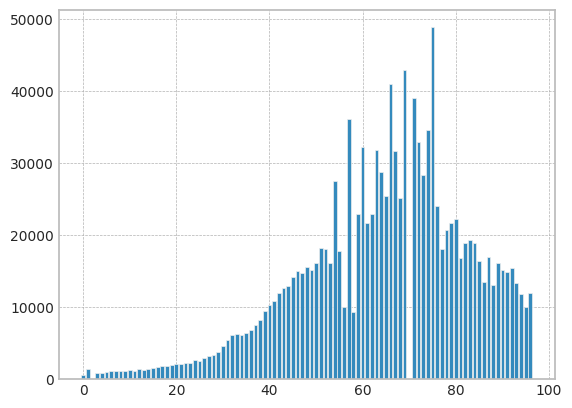

In [48]:
plt.bar(b_cnt.index,b_cnt.values)


#### Drift tolerant 학습

MI Analysis MI Max 0.31570, Min 0.00000, Mean 0.14393, Std 0.12712
Dataset structure X_train, (118518, 5) X_test, (118518, 5) X_live (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set (58, 118518, 5)


100%|██████████| 58/58 [03:22<00:00,  3.48s/it]


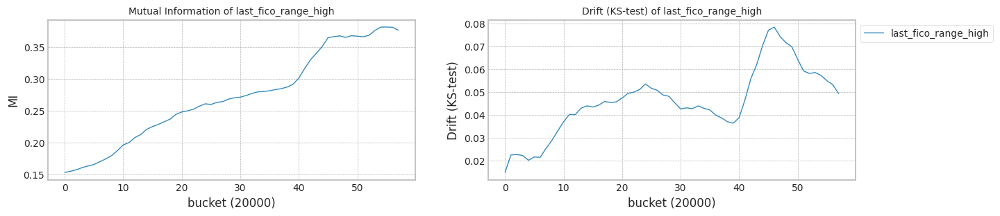

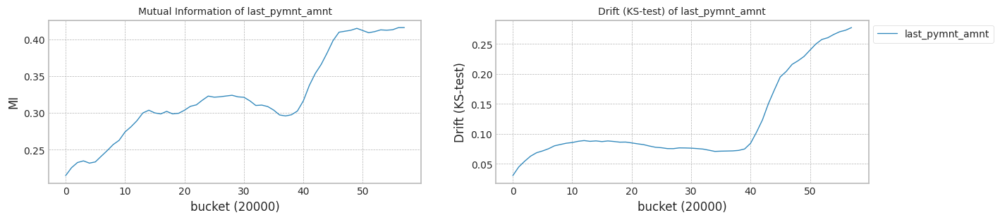

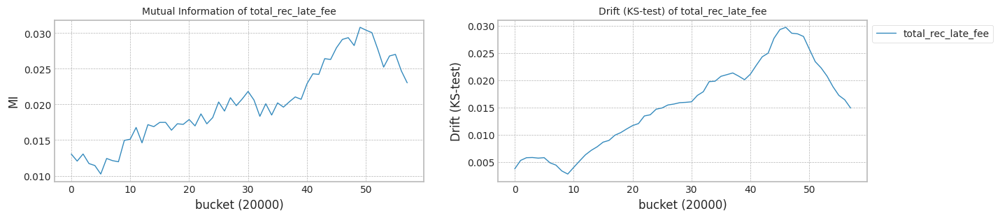

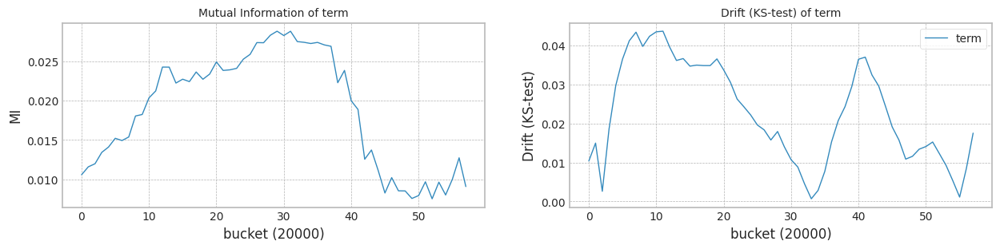

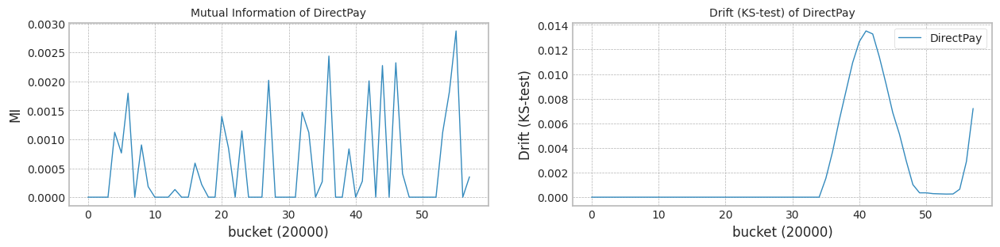

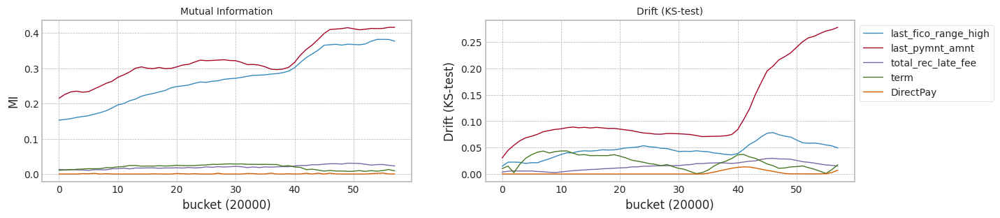

In [53]:
train_size = X2[X2['b'] < 40].shape[0] # 2010년 1월에서 39개월 (약 3년6개월간의 data)
test_size = 20000

X1,Y1 = check_mi_drift(X2[top_columns], Y2, train_size, test_size)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:10<00:00, 380.63it/s]


Test f1 score: 0.9141419925874683
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.8870149653364365
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:30<00:00, 130.35it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.186293
last_pymnt_amnt         0.448052
total_rec_late_fee      0.964014
term                    0.768415
dtype: float64
Mean F1 for all data: 0.886970720622339
Normal model mean        : 0.8870149653364365
Drift tolerant model mean: 0.886970720622339
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 517.23it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:44<00:00,  2.84s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.886970720622339
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 127.31it/s]


Test f1 score: 0.9351891710910221
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.194931
last_pymnt_amnt         0.458083
total_rec_late_fee      0.963871
term                    0.768415
dtype: float64
Mean F1 for all data: 0.9376319058841436
Normal model mean        : 0.8869928429793877
Drift tolerant model mean: 0.9123013132532413
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 511.69it/s]


Test f1 score: 0.9141469671980941
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:44<00:00,  2.84s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.8870269129409516
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 127.13it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.209943
last_pymnt_amnt         0.444261
total_rec_late_fee      0.996604
term                    0.759964
dtype: float64
Mean F1 for all data: 0.886970720622339
Normal model mean        : 0.8870041996332424
Drift tolerant model mean: 0.9038577823762738
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 511.13it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.886970720622339
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 127.10it/s]


Test f1 score: 0.9141333626518607
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.134489
last_pymnt_amnt         0.433970
total_rec_late_fee      0.954666
term                    0.768415
dtype: float64
Mean F1 for all data: 0.8869766039354209
Normal model mean        : 0.8869958298805165
Drift tolerant model mean: 0.8996374877660606
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:08<00:00, 499.39it/s]


Test f1 score: 0.9143409946402945
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:44<00:00,  2.84s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.8877886792897131
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 126.99it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.152290
last_pymnt_amnt         0.434405
total_rec_late_fee      0.963972
term                    0.768415
dtype: float64
Mean F1 for all data: 0.886970720622339
Normal model mean        : 0.8871543997623558
Drift tolerant model mean: 0.8971041343373163
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 505.14it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.886970720622339
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 126.90it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.154394
last_pymnt_amnt         0.423864
total_rec_late_fee      0.985681
term                    0.768415
dtype: float64
Mean F1 for all data: 0.886970720622339
Normal model mean        : 0.8871237865723529
Drift tolerant model mean: 0.8954152320514867
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 512.66it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.886970720622339
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 126.90it/s]


Test f1 score: 0.9141336167600479
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.210319
last_pymnt_amnt         0.447003
total_rec_late_fee      0.963989
term                    0.768415
dtype: float64
Mean F1 for all data: 0.8870213828647924
Normal model mean        : 0.8871019200080651
Drift tolerant model mean: 0.8942161107391017
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 510.44it/s]


Test f1 score: 0.9141569162826069
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.8870329062681515
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 127.04it/s]


Test f1 score: 0.9183100148292791
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.248907
last_pymnt_amnt         0.428025
total_rec_late_fee      0.964014
term                    0.768415
dtype: float64
Mean F1 for all data: 0.8961424832784961
Normal model mean        : 0.8870932932905761
Drift tolerant model mean: 0.8944569073065262
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 506.36it/s]


Test f1 score: 0.9142066209260864
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.8874234992204189
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 127.11it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.179998
last_pymnt_amnt         0.446116
total_rec_late_fee      0.996769
term                    0.768415
dtype: float64
Mean F1 for all data: 0.886970720622339
Normal model mean        : 0.8871299828383363
Drift tolerant model mean: 0.8936251087860609
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 507.14it/s]


Test f1 score: 0.9141276014824384
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.886986357637573
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 127.23it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.193108
last_pymnt_amnt         0.445965
total_rec_late_fee      0.962089
term                    0.768415
dtype: float64
Mean F1 for all data: 0.886977782771842
Normal model mean        : 0.8871156203182601
Drift tolerant model mean: 0.8929603761846391
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 505.88it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.886970720622339
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 126.66it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.183446
last_pymnt_amnt         0.404473
total_rec_late_fee      0.926724
term                    0.758372
dtype: float64
Mean F1 for all data: 0.886970720622339
Normal model mean        : 0.8871024476186308
Drift tolerant model mean: 0.8924158620426117
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 514.16it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.886970720622339
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 126.76it/s]


Test f1 score: 0.9235427635862993
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.220736
last_pymnt_amnt         0.453110
total_rec_late_fee      0.964007
term                    0.768415
dtype: float64
Mean F1 for all data: 0.9102809017058504
Normal model mean        : 0.8870914703689398
Drift tolerant model mean: 0.8939046153478816
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 509.98it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.886970720622339
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 127.04it/s]


Test f1 score: 0.9311219309471974
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:46<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.294833
last_pymnt_amnt         0.459750
total_rec_late_fee      0.964014
term                    0.768415
dtype: float64
Mean F1 for all data: 0.9248573045851041
Normal model mean        : 0.8870821819268936
Drift tolerant model mean: 0.8962855914430526
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 505.88it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.886970720622339
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 126.42it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.185183
last_pymnt_amnt         0.444940
total_rec_late_fee      0.962072
term                    0.768415
dtype: float64
Mean F1 for all data: 0.886970720622339
Normal model mean        : 0.8870742204051396
Drift tolerant model mean: 0.8956202435272873
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 504.15it/s]


Test f1 score: 0.9149155127580788
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.8903116622816839
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 126.73it/s]


Test f1 score: 0.92975072534645
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.289783
last_pymnt_amnt         0.458191
total_rec_late_fee      0.962081
term                    0.768415
dtype: float64
Mean F1 for all data: 0.9218107247804119
Normal model mean        : 0.887290049863576
Drift tolerant model mean: 0.8973662756108289
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 501.09it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.886970720622339
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 126.31it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:46<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.184604
last_pymnt_amnt         0.449990
total_rec_late_fee      0.963997
term                    0.768415
dtype: float64
Mean F1 for all data: 0.886970720622339
Normal model mean        : 0.8872700917859987
Drift tolerant model mean: 0.8967165534240483
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 506.43it/s]


Test f1 score: 0.9141199864380687
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.8870335371429688
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 126.95it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.158769
last_pymnt_amnt         0.395387
total_rec_late_fee      0.963972
term                    0.759964
dtype: float64
Mean F1 for all data: 0.886970720622339
Normal model mean        : 0.887256176806997
Drift tolerant model mean: 0.8961432691415948
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 508.66it/s]


Test f1 score: 0.9141325759311009
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.8869826891435473
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 125.55it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.188740
last_pymnt_amnt         0.453306
total_rec_late_fee      0.997281
term                    0.758372
dtype: float64
Mean F1 for all data: 0.886970968054843
Normal model mean        : 0.8872409830479164
Drift tolerant model mean: 0.8956336968589975
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 505.72it/s]


Test f1 score: 0.9142115854469111
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:46<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.8874840091192684
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:31<00:00, 126.41it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.202358
last_pymnt_amnt         0.457480
total_rec_late_fee      0.964007
term                    0.768415
dtype: float64
Mean F1 for all data: 0.886970720622339
Normal model mean        : 0.887253773893777
Drift tolerant model mean: 0.8951777507412787
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 506.93it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
dtype: float64
Mean F1 for all data: 0.886970720622339
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:30<00:00, 131.08it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 5])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.191480
last_pymnt_amnt         0.446579
total_rec_late_fee      0.964007
term                    0.768415
dtype: float64
Mean F1 for all data: 0.886970720622339
Normal model mean        : 0.8872396212302052
Drift tolerant model mean: 0.8947673992353318


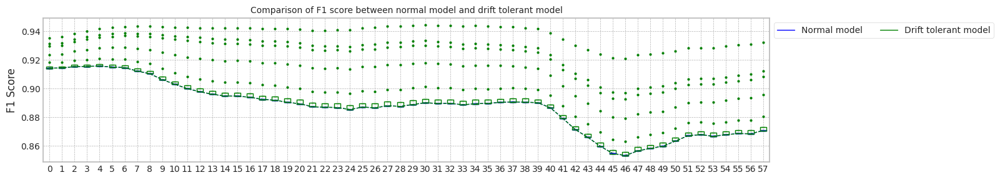

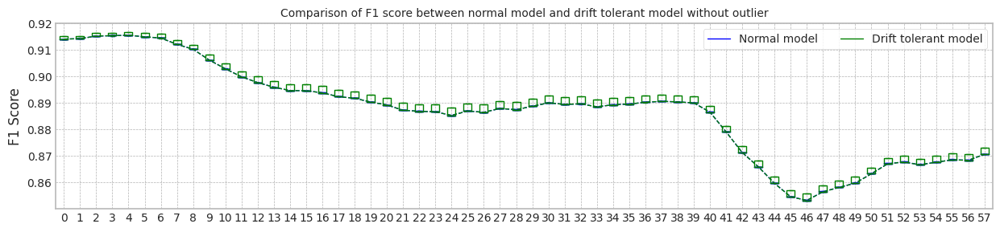

max_mean_trial= 1


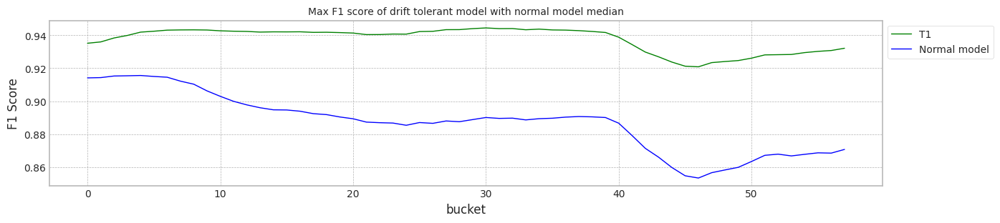

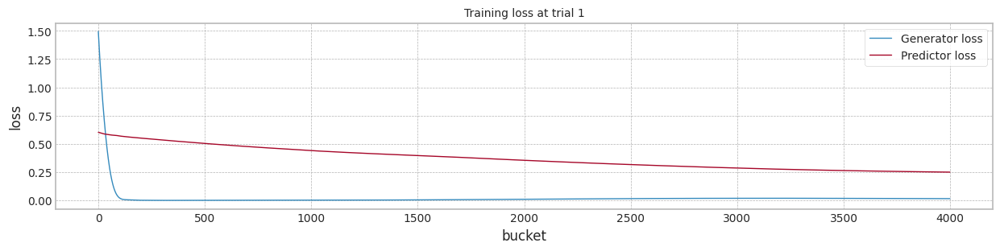

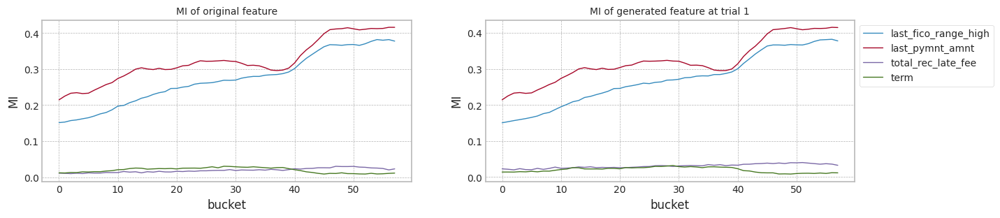

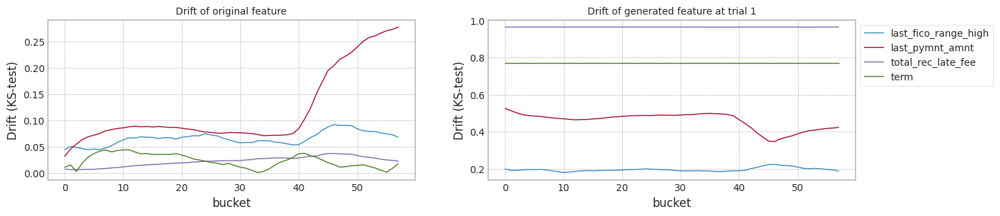

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.914142,0.914142,0.887015,0.870777
1,1.0,0.914138,0.914138,0.886971,0.870655
2,2.0,0.914147,0.914147,0.887027,0.870761
3,3.0,0.914138,0.914138,0.886971,0.870655
4,4.0,0.914341,0.914341,0.887789,0.871715
5,5.0,0.914138,0.914138,0.886971,0.870655
6,6.0,0.914138,0.914138,0.886971,0.870655
7,7.0,0.914157,0.914157,0.887033,0.870757
8,8.0,0.914207,0.914207,0.887423,0.871278
9,9.0,0.914128,0.914128,0.886986,0.870687


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.914138,0.914138,0.886971,0.870655
1,1.0,0.935189,0.935189,0.937632,0.932154
2,2.0,0.914138,0.914138,0.886971,0.870655
3,3.0,0.914133,0.914133,0.886977,0.870678
4,4.0,0.914138,0.914138,0.886971,0.870655
5,5.0,0.914138,0.914138,0.886971,0.870655
6,6.0,0.914134,0.914134,0.887021,0.870720
7,7.0,0.918310,0.918310,0.896142,0.880263
8,8.0,0.914138,0.914138,0.886971,0.870655
9,9.0,0.914138,0.914138,0.886978,0.870663


In [54]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 100) #np.max(X1['b'])+1)

### #3

In [ ]:
'''
['last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate',
 'term']
 '''

In [ ]:
top_columns = list(mi_scores[1:6].index)
top_columns

['last_fico_range_high',
 'last_pymnt_amnt',
 'total_rec_late_fee',
 'int_rate',
 'term']

In [ ]:
top_columns_index = [list(COLUMNS).index(tc) for tc in top_columns]
top_columns_index

[17, 16, 14, 2, 1]

In [ ]:
X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
X2 = pd.DataFrame(X2,columns = COLUMNS)[top_columns]

In [ ]:
train_size = 90000
test_size = 10000

X1,Y1 = check_mi_drift(X2, Y2, train_size, test_size)

KeyboardInterrupt: ignored

In [ ]:
bucket_size = 10000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,last_fico_range_high,last_pymnt_amnt,total_rec_late_fee,int_rate,term,b
0,0.922353,0.023107,0.000000,0.418593,0.0,0
1,0.857647,0.007334,0.000000,0.347201,0.0,0
2,0.722353,0.267822,0.000000,0.472008,0.0,0
3,0.863529,0.015264,0.000000,0.543400,0.0,0
4,0.945882,0.019326,0.000000,0.329224,0.0,0
...,...,...,...,...,...,...
1279675,0.910588,0.000189,0.052309,0.231638,0.0,127
1279676,0.851765,0.283658,0.000000,0.231638,0.0,127
1279677,0.898824,0.235068,0.000000,0.130971,0.0,127
1279678,0.916471,0.682716,0.000000,-0.005136,0.0,127


lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 563.53it/s]


Test f1 score: 0.9154104610410371
X_live.shape (1269680, 6)
Truncate 89680 rows from live_set (1269680, 6)
Search MI & Drift...for X_live_set torch.Size([118, 90000, 6])


100%|██████████| 118/118 [04:45<00:00,  2.42s/it]


mean of drift:
last_fico_range_high    0.070345
last_pymnt_amnt         0.136316
total_rec_late_fee      0.021553
int_rate                0.128013
term                    0.022858
dtype: float64
Mean F1 for all data: 0.8885835191276548
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 539.18it/s]


Test f1 score: 0.9151136719785916
X_live.shape (1269680, 6)
Truncate 89680 rows from live_set (1269680, 6)
Search MI & Drift...for X_live_set torch.Size([118, 90000, 6])


100%|██████████| 118/118 [04:49<00:00,  2.45s/it]


mean of drift:
last_fico_range_high    0.070345
last_pymnt_amnt         0.136316
total_rec_late_fee      0.021553
int_rate                0.128013
term                    0.022858
dtype: float64
Mean F1 for all data: 0.8873854343213327
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 539.75it/s]


Test f1 score: 0.9170385959819538
X_live.shape (1269680, 6)
Truncate 89680 rows from live_set (1269680, 6)
Search MI & Drift...for X_live_set torch.Size([118, 90000, 6])


100%|██████████| 118/118 [04:43<00:00,  2.40s/it]


mean of drift:
last_fico_range_high    0.070345
last_pymnt_amnt         0.136316
total_rec_late_fee      0.021553
int_rate                0.128013
term                    0.022858
dtype: float64
Mean F1 for all data: 0.8936690444544568
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:37<00:00, 107.52it/s]


Test f1 score: 0.9345633984123578
X_live.shape (1269680, 6)
Truncate 89680 rows from live_set (1269680, 6)
Search MI & Drift...for X_live_set torch.Size([118, 90000, 6])


100%|██████████| 118/118 [04:39<00:00,  2.37s/it]


mean of drift:
last_fico_range_high    0.296042
last_pymnt_amnt         0.447626
total_rec_late_fee      0.972604
int_rate                0.205972
term                    0.747615
dtype: float64
Mean F1 for all data: 0.9041555770130897
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:37<00:00, 107.95it/s]


Test f1 score: 0.9151136719785916
X_live.shape (1269680, 6)
Truncate 89680 rows from live_set (1269680, 6)
Search MI & Drift...for X_live_set torch.Size([118, 90000, 6])


100%|██████████| 118/118 [04:38<00:00,  2.36s/it]


mean of drift:
last_fico_range_high    0.101964
last_pymnt_amnt         0.388907
total_rec_late_fee      0.958007
int_rate                0.128368
term                    0.744917
dtype: float64
Mean F1 for all data: 0.8873854343213327
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:37<00:00, 107.52it/s]


Test f1 score: 0.931920463753662
X_live.shape (1269680, 6)
Truncate 89680 rows from live_set (1269680, 6)
Search MI & Drift...for X_live_set torch.Size([118, 90000, 6])


100%|██████████| 118/118 [04:52<00:00,  2.48s/it]


mean of drift:
last_fico_range_high    0.484831
last_pymnt_amnt         0.538115
total_rec_late_fee      0.969837
int_rate                0.131548
term                    0.763944
dtype: float64
Mean F1 for all data: 0.958856247756004


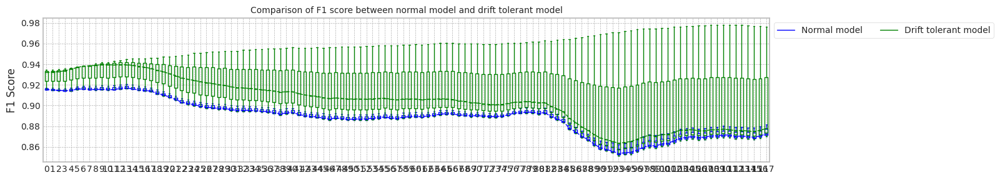

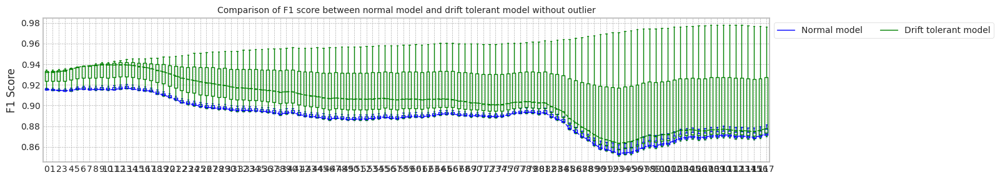

max_mean_trial= 2


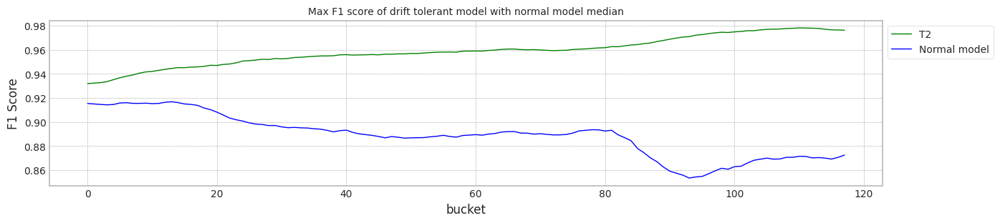

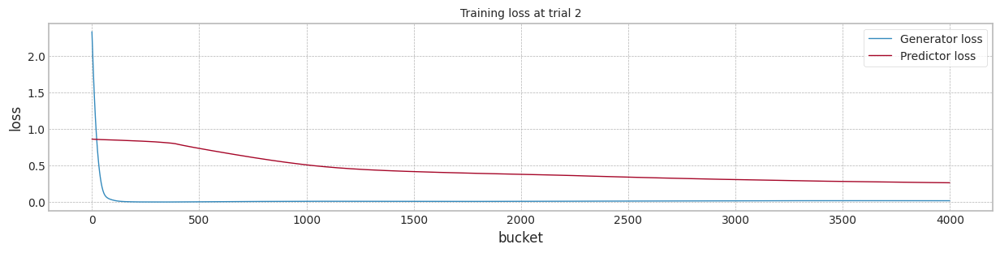

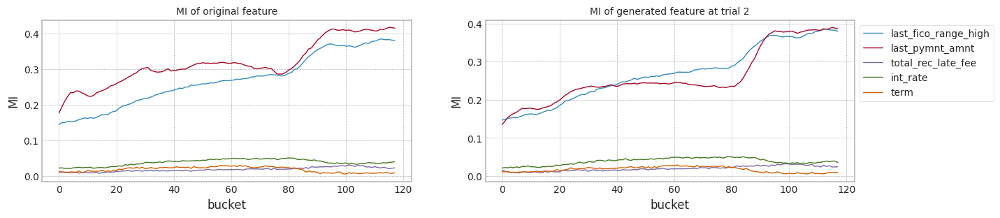

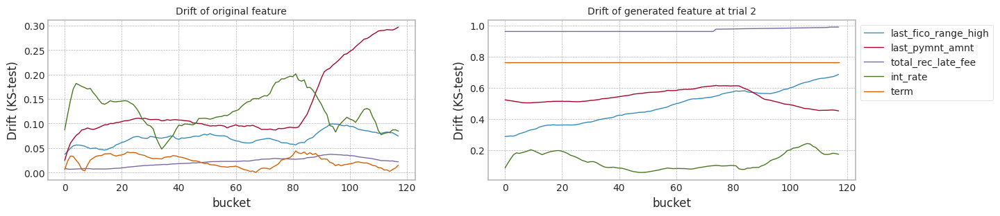

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.915410,0.915410,0.888584,0.872492
1,1.0,0.915114,0.915114,0.887385,0.870163
2,2.0,0.917039,0.917039,0.893669,0.881695
3,mean,0.915854,0.915854,0.889879,0.874783
4,sem,0.000598,0.000598,0.001926,0.003521


,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.934563,0.934563,0.904156,0.877768
1,1.0,0.915114,0.915114,0.887385,0.870163
2,2.0,0.931920,0.931920,0.958856,0.976317
3,mean,0.927199,0.927199,0.916799,0.908083
4,sem,0.006091,0.006091,0.021579,0.034188


In [ ]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 130) #np.max(X1['b'])+1)


### #4

In [ ]:
top_columns = list(mi_scores[1:6].index)
print(top_columns)

top_columns_index = [list(COLUMNS).index(tc) for tc in top_columns]
print(top_columns_index)

X2 = np.concatenate((X[2010],X[2011],X[2012],X[2013],X[2014],X[2015],X[2016],X[2017]))
Y2 = np.concatenate((Y[2010],Y[2011],Y[2012],Y[2013],Y[2014],Y[2015],Y[2016],Y[2017]))
X2 = pd.DataFrame(X2,columns = COLUMNS)[top_columns]

['last_fico_range_high', 'last_pymnt_amnt', 'total_rec_late_fee', 'int_rate', 'term']
[17, 16, 14, 2, 1]


MI Analysis MI Max 0.31570, Min 0.02189, Mean 0.15207, Std 0.11870
Dataset structure X_train, (100000, 5) X_test, (100000, 5) X_live (1259680, 5)
Truncate 99680 rows from live_set (1259680, 5)
Search MI & Drift...for X_live_set (58, 100000, 5)


100%|██████████| 58/58 [02:47<00:00,  2.89s/it]


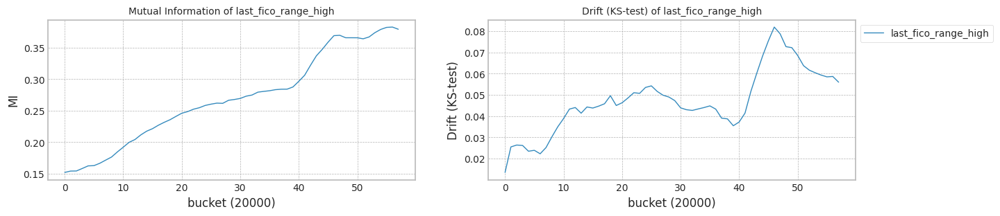

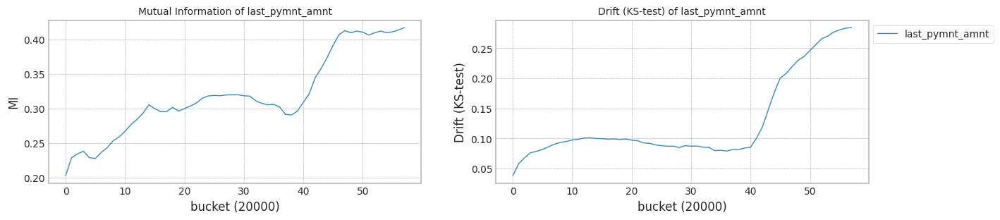

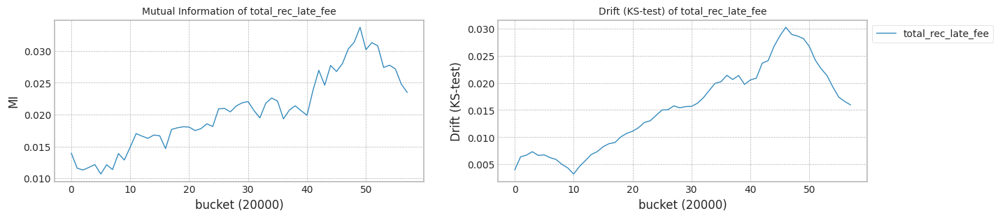

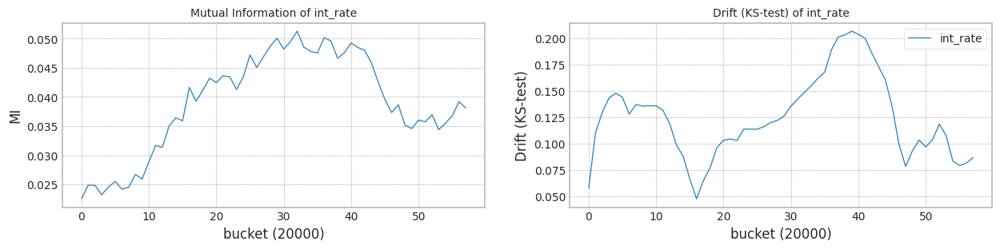

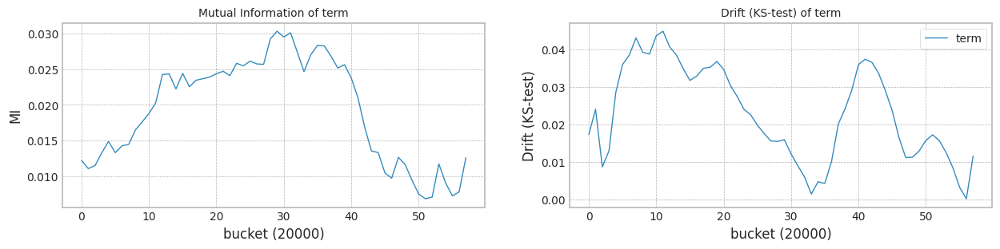

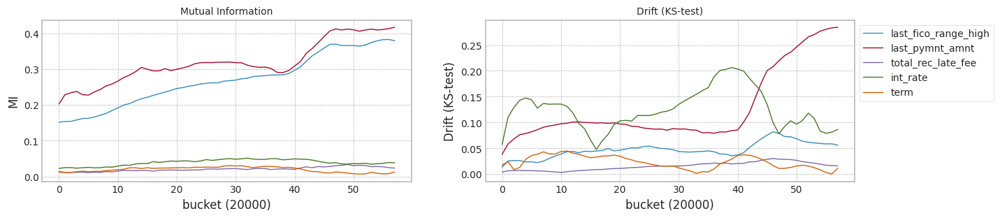

In [ ]:
train_size = 100000
test_size = 20000

X1,Y1 = check_mi_drift(X2, Y2, train_size, test_size)


In [ ]:
bucket_size = 5000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,last_fico_range_high,last_pymnt_amnt,total_rec_late_fee,int_rate,term,b
0,0.922353,0.023107,0.000000,0.418593,0.0,0
1,0.857647,0.007334,0.000000,0.347201,0.0,0
2,0.722353,0.267822,0.000000,0.472008,0.0,0
3,0.863529,0.015264,0.000000,0.543400,0.0,0
4,0.945882,0.019326,0.000000,0.329224,0.0,0
...,...,...,...,...,...,...
1279675,0.910588,0.000189,0.052309,0.231638,0.0,255
1279676,0.851765,0.283658,0.000000,0.231638,0.0,255
1279677,0.898824,0.235068,0.000000,0.130971,0.0,255
1279678,0.916471,0.682716,0.000000,-0.005136,0.0,255


trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 509.27it/s]


Test f1 score: 0.9149575412499117
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:48<00:00,  2.90s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8885716221713209
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 98.57it/s]


Test f1 score: 0.9206611570247935
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:39<00:00,  2.75s/it]


mean of drift:
last_fico_range_high    0.246756
last_pymnt_amnt         0.598983
total_rec_late_fee      0.968022
int_rate                0.151128
term                    0.767480
dtype: float64
Mean F1 for all data: 0.941304883728269
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 509.93it/s]


Test f1 score: 0.9216374654557641
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:51<00:00,  2.95s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8998556544512725
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 97.58it/s]


Test f1 score: 0.9379995977358273
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:40<00:00,  2.76s/it]


mean of drift:
last_fico_range_high    0.365446
last_pymnt_amnt         0.655786
total_rec_late_fee      0.965377
int_rate                0.242914
term                    0.753113
dtype: float64
Mean F1 for all data: 0.8978893264843143
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 503.50it/s]


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:48<00:00,  2.90s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8873029740733172
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 97.92it/s]


Test f1 score: 0.9348616000317442
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:42<00:00,  2.80s/it]


mean of drift:
last_fico_range_high    0.566171
last_pymnt_amnt         0.563957
total_rec_late_fee      0.943638
int_rate                0.129677
term                    0.743058
dtype: float64
Mean F1 for all data: 0.9560815677762226
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 506.49it/s]


Test f1 score: 0.9147909007477721
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:49<00:00,  2.91s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8880984306975221
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:41<00:00, 97.31it/s]


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:41<00:00,  2.79s/it]


mean of drift:
last_fico_range_high    0.319288
last_pymnt_amnt         0.588967
total_rec_late_fee      0.992901
int_rate                0.133167
term                    0.751892
dtype: float64
Mean F1 for all data: 0.8873029740733172
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:08<00:00, 496.47it/s]


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:46<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8873029740733172
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 98.31it/s]


Test f1 score: 0.9286564275943371
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:40<00:00,  2.77s/it]


mean of drift:
last_fico_range_high    0.572260
last_pymnt_amnt         0.553841
total_rec_late_fee      0.951093
int_rate                0.147131
term                    0.767480
dtype: float64
Mean F1 for all data: 0.9131820064103829
######################### Trial 5 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 507.72it/s]


Test f1 score: 0.9279314461689522
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:46<00:00,  2.87s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.9167106402574711
######################### Trial 5 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 98.34it/s]


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:40<00:00,  2.76s/it]


mean of drift:
last_fico_range_high    0.115215
last_pymnt_amnt         0.429231
total_rec_late_fee      0.954674
int_rate                0.142884
term                    0.725623
dtype: float64
Mean F1 for all data: 0.8873029740733172
######################### Trial 6 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 502.28it/s]


Test f1 score: 0.9146502348055051
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:46<00:00,  2.87s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8876512835153842
######################### Trial 6 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 98.23it/s]


Test f1 score: 0.9335336382920063
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:40<00:00,  2.76s/it]


mean of drift:
last_fico_range_high    0.537570
last_pymnt_amnt         0.573626
total_rec_late_fee      0.925074
int_rate                0.208637
term                    0.767480
dtype: float64
Mean F1 for all data: 0.8982146892983833
######################### Trial 7 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 507.23it/s]


Test f1 score: 0.9147629468334084
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8879068100979817
######################### Trial 7 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 97.96it/s]


Test f1 score: 0.9381381105320915
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:39<00:00,  2.75s/it]


mean of drift:
last_fico_range_high    0.464167
last_pymnt_amnt         0.595464
total_rec_late_fee      0.967531
int_rate                0.143486
term                    0.752890
dtype: float64
Mean F1 for all data: 0.8966825418080357
######################### Trial 8 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 504.32it/s]


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:44<00:00,  2.83s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8873029740733172
######################### Trial 8 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 98.82it/s]


Test f1 score: 0.9345140569990192
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:39<00:00,  2.74s/it]


mean of drift:
last_fico_range_high    0.340451
last_pymnt_amnt         0.542275
total_rec_late_fee      0.943550
int_rate                0.257377
term                    0.754616
dtype: float64
Mean F1 for all data: 0.9132781302681647
######################### Trial 9 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 527.04it/s]


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:43<00:00,  2.82s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8873029740733172
######################### Trial 9 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 98.53it/s]


Test f1 score: 0.9370451882127647
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:38<00:00,  2.73s/it]


mean of drift:
last_fico_range_high    0.781144
last_pymnt_amnt         0.588092
total_rec_late_fee      0.958067
int_rate                0.187622
term                    0.767480
dtype: float64
Mean F1 for all data: 0.8920739869444428
######################### Trial 10 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 507.48it/s]


Test f1 score: 0.9145713370852985
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:44<00:00,  2.83s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8873127531043788
######################### Trial 10 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 98.54it/s]


Test f1 score: 0.9201969797172106
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:39<00:00,  2.74s/it]


mean of drift:
last_fico_range_high    0.251969
last_pymnt_amnt         0.522007
total_rec_late_fee      0.967625
int_rate                0.259335
term                    0.767480
dtype: float64
Mean F1 for all data: 0.8879570921281809
######################### Trial 11 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 503.49it/s]


Test f1 score: 0.9228716070896799
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:44<00:00,  2.84s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.9029031054999391
######################### Trial 11 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 98.06it/s]


Test f1 score: 0.9356688762697676
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:39<00:00,  2.75s/it]


mean of drift:
last_fico_range_high    0.590916
last_pymnt_amnt         0.707133
total_rec_late_fee      0.948811
int_rate                0.225389
term                    0.767480
dtype: float64
Mean F1 for all data: 0.8948943429677537
######################### Trial 12 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 509.86it/s]


Test f1 score: 0.9215644298065048
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:44<00:00,  2.83s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.9003388156629475
######################### Trial 12 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 98.91it/s]


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:39<00:00,  2.74s/it]


mean of drift:
last_fico_range_high    0.523264
last_pymnt_amnt         0.415303
total_rec_late_fee      0.932955
int_rate                0.121895
term                    0.767480
dtype: float64
Mean F1 for all data: 0.8873029740733172
######################### Trial 13 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 509.70it/s]


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:45<00:00,  2.85s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8872992380679643
######################### Trial 13 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 98.74it/s]


Test f1 score: 0.9331792711587756
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:39<00:00,  2.75s/it]


mean of drift:
last_fico_range_high    0.799180
last_pymnt_amnt         0.697253
total_rec_late_fee      0.962435
int_rate                0.236141
term                    0.767480
dtype: float64
Mean F1 for all data: 0.890663482055416
######################### Trial 14 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 512.31it/s]


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:47<00:00,  2.89s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8873029740733172
######################### Trial 14 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 98.51it/s]


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:39<00:00,  2.76s/it]


mean of drift:
last_fico_range_high    0.322708
last_pymnt_amnt         0.480926
total_rec_late_fee      0.969155
int_rate                0.148509
term                    0.737679
dtype: float64
Mean F1 for all data: 0.8873029740733172
######################### Trial 15 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 503.11it/s]


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:46<00:00,  2.87s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8873045435751417
######################### Trial 15 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 98.16it/s]


Test f1 score: 0.9372986962643727
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:39<00:00,  2.74s/it]


mean of drift:
last_fico_range_high    0.226214
last_pymnt_amnt         0.821907
total_rec_late_fee      0.950466
int_rate                0.166086
term                    0.767480
dtype: float64
Mean F1 for all data: 0.8918401864946992
######################### Trial 16 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 509.84it/s]


Test f1 score: 0.927967811351206
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:45<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.917230935499608
######################### Trial 16 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 99.65it/s] 


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:38<00:00,  2.74s/it]


mean of drift:
last_fico_range_high    0.442276
last_pymnt_amnt         0.590011
total_rec_late_fee      0.964097
int_rate                0.188357
term                    0.767480
dtype: float64
Mean F1 for all data: 0.8873029740733172
######################### Trial 17 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 502.33it/s]


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:47<00:00,  2.89s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8873046327146397
######################### Trial 17 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 99.33it/s]


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:39<00:00,  2.75s/it]


mean of drift:
last_fico_range_high    0.544878
last_pymnt_amnt         0.734690
total_rec_late_fee      0.945927
int_rate                0.157538
term                    0.767480
dtype: float64
Mean F1 for all data: 0.8873029740733172
######################### Trial 18 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 502.18it/s]


Test f1 score: 0.9145831185112422
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:46<00:00,  2.86s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.8873029740733172
######################### Trial 18 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 98.95it/s]


Test f1 score: 0.9378897936126628
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:39<00:00,  2.76s/it]


mean of drift:
last_fico_range_high    0.499277
last_pymnt_amnt         0.709181
total_rec_late_fee      0.978482
int_rate                0.144082
term                    0.767480
dtype: float64
Mean F1 for all data: 0.8940802557231109
######################### Trial 19 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 500.07it/s]


Test f1 score: 0.9252901930553321
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:46<00:00,  2.87s/it]


mean of drift:
last_fico_range_high    0.067513
last_pymnt_amnt         0.127393
total_rec_late_fee      0.021608
int_rate                0.129588
term                    0.023087
dtype: float64
Mean F1 for all data: 0.909488900227719
######################### Trial 19 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:40<00:00, 98.89it/s]


Test f1 score: 0.9308162032791285
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 100000, 6])


100%|██████████| 58/58 [02:40<00:00,  2.76s/it]


mean of drift:
last_fico_range_high    0.462630
last_pymnt_amnt         0.616485
total_rec_late_fee      0.955856
int_rate                0.125532
term                    0.767480
dtype: float64
Mean F1 for all data: 0.8958666543493505


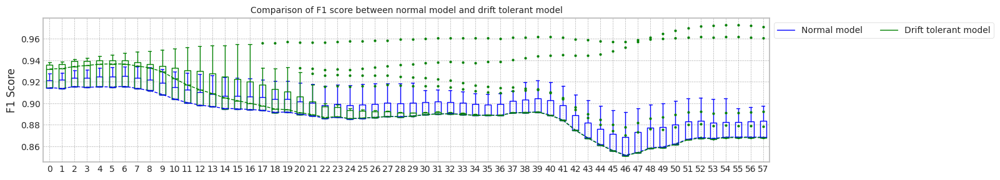

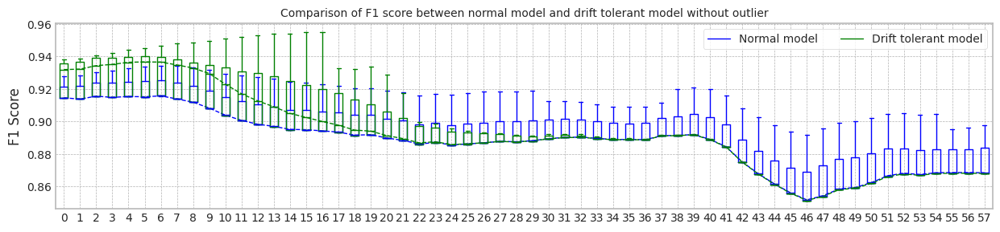

max_mean_trial= -15


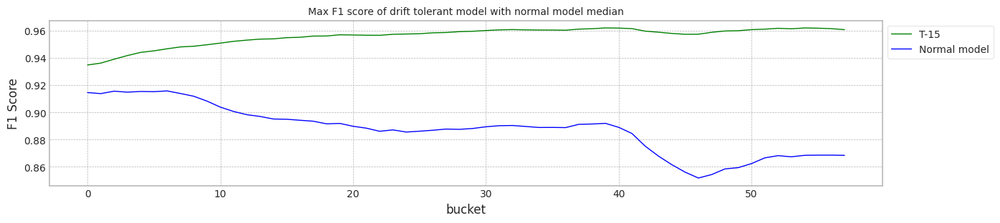

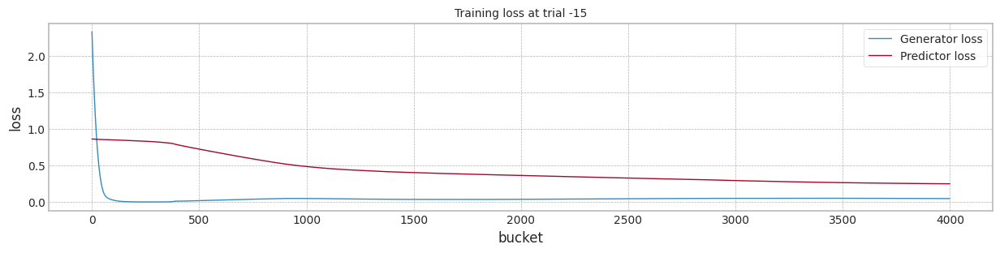

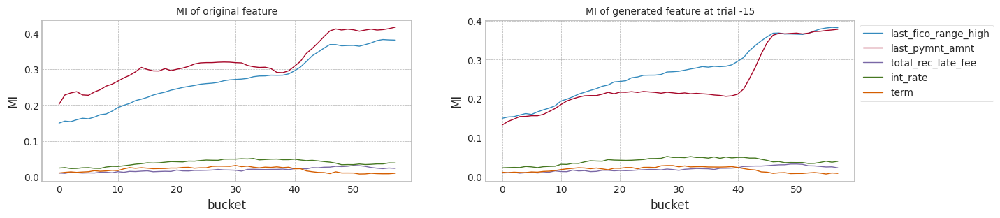

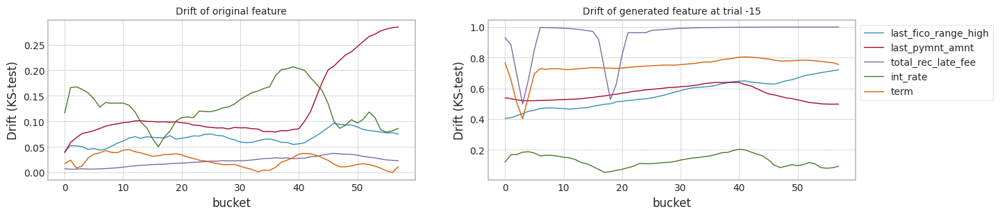

,Trial,test_f1,init_f1,mean_f1,last_f1
0,0.0,0.914958,0.914958,0.888572,0.870629
1,1.0,0.921637,0.921637,0.899856,0.883739
2,2.0,0.914583,0.914583,0.887303,0.868055
3,3.0,0.914791,0.914791,0.888098,0.870261
4,4.0,0.914583,0.914583,0.887303,0.868055
5,5.0,0.927931,0.927931,0.916711,0.908180
6,6.0,0.914650,0.914650,0.887651,0.868872
7,7.0,0.914763,0.914763,0.887907,0.869040
8,8.0,0.914583,0.914583,0.887303,0.868055
9,9.0,0.914583,0.914583,0.887303,0.868055


,Trial,test_f1,init_f1,mean_f1,last_f1
0,-19.0,0.920661,0.920661,0.941305,0.971019
1,-17.0,0.938000,0.938000,0.897889,0.868055
2,-15.0,0.934862,0.934862,0.956082,0.960854
3,-13.0,0.914583,0.914583,0.887303,0.868055
4,-11.0,0.928656,0.928656,0.913182,0.878441
5,-9.0,0.914583,0.914583,0.887303,0.868055
6,-7.0,0.933534,0.933534,0.898215,0.868065
7,-5.0,0.938138,0.938138,0.896683,0.868055
8,-3.0,0.934514,0.934514,0.913278,0.892618
9,-1.0,0.937045,0.937045,0.892074,0.868055


In [ ]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 260)

### #5

In [55]:
bucket_size = 2000
X1['b'] = [int(b/bucket_size) for b in X1.index.values]
X1

,last_fico_range_high,last_pymnt_amnt,total_rec_late_fee,term,DirectPay,b
0,0.922353,0.023107,0.000000,0.0,0.0,0
1,0.857647,0.007334,0.000000,0.0,0.0,0
2,0.722353,0.267822,0.000000,0.0,0.0,0
3,0.863529,0.015264,0.000000,0.0,0.0,0
4,0.945882,0.019326,0.000000,0.0,0.0,0
...,...,...,...,...,...,...
1279675,0.910588,0.000189,0.052309,0.0,0.0,639
1279676,0.851765,0.283658,0.000000,0.0,0.0,639
1279677,0.898824,0.235068,0.000000,0.0,0.0,639
1279678,0.916471,0.682716,0.000000,0.0,0.0,639


In [75]:
_,_,_,_,_,_ = drift_tolerant(X1, Y1,train_size, test_size,avaible_range = 700)

trial_count: 20
lambda_f2 1.0
######################### Trial 0 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 502.09it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 6])


100%|██████████| 58/58 [03:22<00:00,  3.50s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
DirectPay               0.002059
dtype: float64
Mean F1 for all data: 0.886970720622339
######################### Trial 0 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:47<00:00, 84.45it/s]


Test f1 score: 0.9228452862805601
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 6])


100%|██████████| 58/58 [03:11<00:00,  3.30s/it]


mean of drift:
last_fico_range_high    0.298745
last_pymnt_amnt         0.497591
total_rec_late_fee      0.957886
term                    0.768415
DirectPay               0.976940
dtype: float64
Mean F1 for all data: 0.8924043918282443
Normal model mean        : 0.886970720622339
Drift tolerant model mean: 0.8924043918282443
######################### Trial 1 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 502.06it/s]


Test f1 score: 0.9158481208334674
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 6])


100%|██████████| 58/58 [03:23<00:00,  3.51s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
DirectPay               0.002059
dtype: float64
Mean F1 for all data: 0.8924107543685921
######################### Trial 1 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:47<00:00, 84.43it/s]


Test f1 score: 0.9295119915891508
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 6])


100%|██████████| 58/58 [03:11<00:00,  3.30s/it]


mean of drift:
last_fico_range_high    0.338024
last_pymnt_amnt         0.576801
total_rec_late_fee      0.968116
term                    0.768415
DirectPay               0.974461
dtype: float64
Mean F1 for all data: 0.895985219239055
Normal model mean        : 0.8896907374954655
Drift tolerant model mean: 0.8941948055336497
######################### Trial 2 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:08<00:00, 494.62it/s]


Test f1 score: 0.925015758877501
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 6])


100%|██████████| 58/58 [03:23<00:00,  3.51s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
DirectPay               0.002059
dtype: float64
Mean F1 for all data: 0.9147497018946343
######################### Trial 2 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:47<00:00, 84.30it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 6])


100%|██████████| 58/58 [03:11<00:00,  3.30s/it]


mean of drift:
last_fico_range_high    0.180132
last_pymnt_amnt         0.584004
total_rec_late_fee      0.960363
term                    0.765378
DirectPay               0.974461
dtype: float64
Mean F1 for all data: 0.886970720622339
Normal model mean        : 0.8980437256285217
Drift tolerant model mean: 0.8917867772298794
######################### Trial 3 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 507.27it/s]


Test f1 score: 0.9143244903760626
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 6])


100%|██████████| 58/58 [03:24<00:00,  3.53s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
DirectPay               0.002059
dtype: float64
Mean F1 for all data: 0.8877663472395219
######################### Trial 3 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:47<00:00, 84.47it/s]


Test f1 score: 0.9342773558475715
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 6])


100%|██████████| 58/58 [03:12<00:00,  3.31s/it]


mean of drift:
last_fico_range_high    0.474835
last_pymnt_amnt         0.581427
total_rec_late_fee      0.966874
term                    0.768415
DirectPay               0.972403
dtype: float64
Mean F1 for all data: 0.906356859855451
Normal model mean        : 0.8954743810312717
Drift tolerant model mean: 0.8954292978862723
######################### Trial 4 for Normal model ###########################
cuda:0


100%|██████████| 4000/4000 [00:07<00:00, 504.70it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 6])


100%|██████████| 58/58 [03:23<00:00,  3.52s/it]


mean of drift:
last_fico_range_high    0.065474
last_pymnt_amnt         0.117957
total_rec_late_fee      0.021759
term                    0.022712
DirectPay               0.002059
dtype: float64
Mean F1 for all data: 0.886970720622339
######################### Trial 4 for Drift tolerant model ###########################
cuda:0


100%|██████████| 4000/4000 [00:45<00:00, 87.38it/s]


Test f1 score: 0.9141383370057674
X_live.shape (1259680, 6)
Truncate 99680 rows from live_set (1259680, 6)
Search MI & Drift...for X_live_set torch.Size([58, 118518, 6])


 62%|██████▏   | 36/58 [02:02<01:14,  3.40s/it]


KeyboardInterrupt: ignored